<a href="https://colab.research.google.com/github/esengendo/spatial-hospital-recommendation-system/blob/main/HCAHPS_03_10_25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Introduction

## Problem Overview
Healthcare decision-making has become increasingly complex for patients and administrators alike. With numerous hospital options available, selecting the most appropriate facility based on patient experience metrics is challenging. This notebook develops a recommendation system that leverages deep learning techniques to help:
- **Patients**: Find hospitals that match their priorities for care quality
- **Healthcare Administrators**: Benchmark their facilities and identify improvement opportunities

## Dataset Description
We're using the Hospital Consumer Assessment of Healthcare Providers and Systems (HCAHPS) dataset from the Centers for Medicare & Medicaid Services (CMS), specifically the "Patient Survey (PCH - HCAHPS) PPS-Exempt Cancer Hospital" dataset available through the CMS Provider Data Catalog (cms.gov). This nationally standardized survey collects patients' perspectives on hospital care across multiple dimensions organized into composite topics, individual items, and global measures:

**Composite Topics:**
- Nurse Communication (Q1-Q3)
- Doctor Communication (Q5-Q7)
- Responsiveness of Hospital Staff (Q4, Q11)
- Communication About Medicines (Q13, Q14)
- Discharge Information (Q16, Q17)
- Care Transition (Q20-Q22)

**Individual Items:**
- Cleanliness of Hospital Environment (Q8)
- Quietness of Hospital Environment (Q9)

**Global Measures:**
- Overall Rating of Hospital (Q18)
- Willingness to Recommend Hospital (Q19)

The dataset includes both raw survey responses and standardized measure IDs that can be mapped to specific questions and topics.

## Data Preparation and Feature Engineering
Our initial data processing involves several critical steps:

1. **Comprehensive Topic Mapping**: We've created a detailed mapping structure that connects all possible HCAHPS response descriptions to their corresponding topic categories. This includes:
   - Dictionary mappings for a wide range of response texts (e.g., "Nurses 'always' communicated well" → "Nurse Communication")
   - Classification of response types by frequency adverbs ("always", "usually", "sometimes", "never")
   - Identification of linear mean scores and star ratings for each topic category
   - Coverage for all ten main HCAHPS dimensions with their various response formats

2. **Natural Language Processing for Topic Assignment**: For textual response descriptions, we've implemented an NLP-based function that analyzes the content of HCAHPS answers and assigns them to appropriate topic categories. This function:
   - Performs case-insensitive keyword matching
   - Recognizes topic-specific terminology (e.g., "nurse communicated" → "Nurse Communication")
   - Identifies contextual phrases that indicate specific aspects of patient experience
   - Handles ambiguous responses by prioritizing the most relevant topic category

3. **Measure ID Standardization**: Each measure ID is processed to extract its base component, removing suffixes that indicate response types (e.g., `H_NURSE_RESPECT_A_P` → `H_NURSE_RESPECT`).

4. **Question Categorization**: Each question is assigned to its appropriate topic category (e.g., "Nurse Communication", "Doctor Communication") using our mapping dictionaries.

5. **Advanced Sentiment Analysis Pipeline**: We employ transformer-based natural language processing to extract sentiment from textual responses:
   - Utilizing the DistilBERT model fine-tuned on SST-2 for sentiment analysis
   - Calculating a continuous positive sentiment score for each HCAHPS answer
   - Mapping raw sentiment scores to a standardized 1-5 scale:
     * 5: Very positive (≥0.9)
     * 4: Positive (≥0.7)
     * 3: Neutral (≥0.5)
     * 2: Negative (≥0.3)
     * 1: Very negative (<0.3)
   - Processing all answers systematically with progress tracking
   - Handling exceptions and missing values gracefully

6. **Structured Data Enrichment**: Our processing pipeline creates a bidirectional mapping between topics and answers:
   - Creating a reverse lookup dictionary (answer_to_topic) for efficient processing
   - Generating dedicated sentiment and score columns for each topic category
   - Applying sentiment analysis to each answer and populating the appropriate topic-specific columns
   - Maintaining data integrity throughout the transformation process

7. **Statistical Analysis**: We compute comprehensive summary statistics to understand sentiment distribution:
   - Calculating mean and median sentiment scores for each topic
   - Deriving mean and median mapped scores (1-5 scale) by topic
   - Creating a structured summary table for cross-topic comparison
   - Enabling identification of relative strengths and weaknesses across hospital care dimensions

This multi-faceted approach to data preparation ensures that we capture both the explicit categories defined in the HCAHPS survey and the implicit sentiment expressed in the responses, providing a rich foundation for our recommendation system.

## Objectives of the Recommendation System
Our deep learning recommendation system aims to:
1. **Personalize recommendations** based on user preferences for different aspects of care
2. **Identify similar hospitals** to help with benchmarking and best practice sharing
3. **Predict patient satisfaction** for various hospital attributes
4. **Enable interactive exploration** of hospital performance data
5. **Support data-driven decision-making** for both patients and healthcare administrators

## Approach
We'll build a PyTorch-based neural collaborative filtering model that can:
- Learn latent representations of hospitals and care dimensions
- Incorporate both explicit ratings and derived sentiment scores
- Handle the sparse and heterogeneous nature of healthcare data
- Provide interpretable recommendations with supporting evidence

The foundation of our model relies on the carefully structured topic mappings and sentiment scores we've created. By leveraging our comprehensive dictionaries, transformer-based sentiment analysis, and detailed statistical summaries, our recommendation system can provide context-aware, personalized recommendations that account for the multifaceted nature of healthcare quality and patient experience.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 2. Data Ingest

## Importing Required Libraries


In [6]:
# Basic Libraries
import os
import random
import time
import pickle
import warnings

# Data Handling
import pandas as pd
import numpy as np

# Visualization Libraries
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning Libraries
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    confusion_matrix,
    precision_recall_curve,
    auc
)

# NLP and Transformer Libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from transformers import pipeline
from sentence_transformers import SentenceTransformer, util

# Geospatial Libraries
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from geopy.exc import GeocoderTimedOut, GeocoderServiceError

# Utility and Progress Bars
from tqdm.notebook import tqdm

# Settings and Configurations
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
np.random.seed(42)
pio.templates.default = "plotly_white"


## Loading the Dataset

In this step, we'll load the HCAHPS dataset using pandas and examine its structure.


In [3]:
df = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/HCAHPS-Hospital.csv', usecols=['Facility ID',
 'Facility Name',
 'Address',
 'City/Town',
 'State',
 'ZIP Code',
 'County/Parish',
 'Telephone Number',
 'HCAHPS Measure ID',
 'HCAHPS Question',
 'HCAHPS Answer Description',
 'Patient Survey Star Rating',
 'HCAHPS Answer Percent',
 'HCAHPS Linear Mean Value',
 'Number of Completed Surveys',
 'Survey Response Rate Percent',
 'Start Date',
 'End Date'])
df.head()

In [ ]:
df.shape

(444447, 18)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444447 entries, 0 to 444446
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   Facility ID                   444447 non-null  object
 1   Facility Name                 444447 non-null  object
 2   Address                       444447 non-null  object
 3   City/Town                     444447 non-null  object
 4   State                         444447 non-null  object
 5   ZIP Code                      444447 non-null  int64 
 6   County/Parish                 444447 non-null  object
 7   Telephone Number              444447 non-null  object
 8   HCAHPS Measure ID             444447 non-null  object
 9   HCAHPS Question               444447 non-null  object
 10  HCAHPS Answer Description     444447 non-null  object
 11  Patient Survey Star Rating    444447 non-null  object
 12  HCAHPS Answer Percent         444447 non-null  object
 13 

In [ ]:
# Create topic mappings
def create_hcahps_topic_mappings():
    """
    Creates dictionaries mapping HCAHPS questions to their composite and individual topics
    """
    # Composite Topics
    composite_topics = {
        'Nurse Communication': ['Q1', 'Q2', 'Q3'],
        'Doctor Communication': ['Q5', 'Q6', 'Q7'],
        'Responsiveness of Hospital Staff': ['Q4', 'Q11'],
        'Communication About Medicines': ['Q13', 'Q14'],
        'Discharge Information': ['Q16', 'Q17'],
        'Care Transition': ['Q20', 'Q21', 'Q22']
    }

    # Individual Items
    individual_topics = {
        'Cleanliness of Hospital Environment': ['Q8'],
        'Quietness of Hospital Environment': ['Q9']
    }

    # Global Items
    global_topics = {
        'Overall Rating of Hospital': ['Q18'],
        'Willingness to Recommend Hospital': ['Q19']
    }

    # Combine all mappings
    all_mappings = {**composite_topics, **individual_topics, **global_topics}

    # Create reverse mapping (question number to topic)
    question_to_topic = {}
    for topic, questions in all_mappings.items():
        for q in questions:
            question_to_topic[q] = topic

    return all_mappings, question_to_topic

# Create measure ID to question number mapping
def create_measure_id_mapping():
    """
    Maps HCAHPS Measure IDs to their corresponding question numbers
    """
    return {
        'H_NURSE_RESPECT': 'Q1',
        'H_NURSE_LISTEN': 'Q2',
        'H_NURSE_EXPLAIN': 'Q3',
        'H_CALL_BUTTON': 'Q4',
        'H_DOCTOR_RESPECT': 'Q5',
        'H_DOCTOR_LISTEN': 'Q6',
        'H_DOCTOR_EXPLAIN': 'Q7',
        'H_CLEAN_HSP': 'Q8',
        'H_QUIET_HSP': 'Q9',
        'H_BATH_HELP': 'Q11',
        'H_MED_FOR': 'Q13',
        'H_SIDE_EFFECTS': 'Q14',
        'H_DISCH_HELP': 'Q16',
        'H_SYMPTOMS': 'Q17',
        'H_HSP_RATING': 'Q18',
        'H_RECMND': 'Q19',
        'H_CT_PREFER': 'Q20',
        'H_CT_UNDER': 'Q21',
        'H_CT_MED': 'Q22'
    }

# Function to extract base measure ID
def get_base_measure_id(measure_id):
    """
    Extracts the base measure ID by removing suffixes
    Example: H_NURSE_RESPECT_A_P -> H_NURSE_RESPECT
    """
    return '_'.join(measure_id.split('_')[:2])

# Create the mappings
topic_mappings, question_to_topic = create_hcahps_topic_mappings()
measure_id_mapping = create_measure_id_mapping()

# Create function to map measure ID to topic
def map_measure_id_to_topic(measure_id):
    """
    Maps an HCAHPS Measure ID to its corresponding topic
    """
    base_measure = get_base_measure_id(measure_id)
    question_num = measure_id_mapping.get(base_measure)
    return question_to_topic.get(question_num, 'Other')

# Add new columns to DataFrame
df['Base_Measure_ID'] = df['HCAHPS Measure ID'].apply(get_base_measure_id)
df['Question_Number'] = df['Base_Measure_ID'].map(measure_id_mapping)
df['Topic_Category'] = df['HCAHPS Measure ID'].apply(map_measure_id_to_topic)

# Display sample results
print("\nSample of categorized data:")
print(df[['HCAHPS Measure ID', 'Base_Measure_ID', 'Question_Number', 'Topic_Category']].head())

# Display unique topics and their questions
print("\nTopics and their associated questions:")
for topic, questions in topic_mappings.items():
    print(f"\n{topic}:")
    topic_data = df[df['Topic_Category'] == topic]['HCAHPS Question'].unique()
    for q in topic_data:
        print(f"- {q}")

# Basic analysis
print("\nDistribution of responses by topic:")
topic_distribution = df['Topic_Category'].value_counts()
print(topic_distribution)

# You can now easily filter for specific topics
nurse_communication = df[df['Topic_Category'] == 'Nurse Communication']
doctor_communication = df[df['Topic_Category'] == 'Doctor Communication']

# Example: Calculate average ratings by topic (if applicable)
if 'Patient Survey Star Rating' in df.columns:
    avg_ratings = df.groupby('Topic_Category')['Patient Survey Star Rating'].mean().sort_values(ascending=False)
    print("\nAverage Star Ratings by Topic:")
    print(avg_ratings)


Sample of categorized data:
       HCAHPS Measure ID Base_Measure_ID Question_Number Topic_Category
0           H_COMP_1_A_P          H_COMP             NaN          Other
1          H_COMP_1_SN_P          H_COMP             NaN          Other
2           H_COMP_1_U_P          H_COMP             NaN          Other
3  H_COMP_1_LINEAR_SCORE          H_COMP             NaN          Other
4   H_COMP_1_STAR_RATING          H_COMP             NaN          Other

Topics and their associated questions:

Nurse Communication:

Doctor Communication:

Responsiveness of Hospital Staff:

Communication About Medicines:

Discharge Information:
- Patients who reported that NO, they did not receive written information about possible symptoms to look out for after discharge
- Patients who reported that YES, they did receive written information about possible symptoms to look out for after discharge

Care Transition:

Cleanliness of Hospital Environment:

Quietness of Hospital Environment:

Overall Ratin

TypeError: agg function failed [how->mean,dtype->object]

In [ ]:

def assign_topic(answer):
    # work in lowercase for case-insensitive matching
    ans = answer.lower()

    # 1. Nurse Communication
    # Look for nurse-related wording that indicates communication
    if "nurse" in ans and any(word in ans for word in ["communicated", "treated", "listened", "explained"]):
        return "Nurse Communication"

    # 2. Doctor Communication
    if "doctor" in ans and any(word in ans for word in ["communicated", "treated", "listened", "explained"]):
        return "Doctor Communication"

    # 3. Responsiveness of Hospital Staff
    # Look for help responses (including call button or bathroom help)
    if ("help as soon" in ans) or ("call button" in ans) or ("bathroom help" in ans) or ("staff responsiveness" in ans):
        return "Responsiveness of Hospital Staff"

    # 4. Communication About Medicines
    # Look for mention of medications or side effects
    if ("medic" in ans) or ("side effect" in ans) or ("communication about medicines" in ans):
        return "Communication About Medicines"

    # 5. Discharge Information
    # Look for the word 'discharge' or phrases about giving patients information (but not those already captured below)
    if ("discharge" in ans) or (("give patients" in ans) and ("information" in ans)) or ("understood their care when they left" in ans):
        return "Discharge Information"

    # 6. Care Transition
    # Look for the explicit phrase or key words like 'preferences', 'responsibl' (to catch both responsibilities and responsibility),
    # or mention of understanding medications in the context of leaving.
    if ("care transition" in ans) or ("preferences" in ans) or ("responsibl" in ans) or ("understood their medications" in ans):
        return "Care Transition"

    # 7. Cleanliness of Hospital Environment
    if ("clean" in ans) or ("cleanliness" in ans):
        return "Cleanliness of Hospital Environment"

    # 8. Quietness of Hospital Environment
    if ("quiet" in ans) or ("quietness" in ans):
        return "Quietness of Hospital Environment"

    # 10. Willingness to Recommend Hospital
    # Check for wording about recommendation
    if "recommend" in ans:
        return "Willingness to Recommend Hospital"

    # 9. Overall Rating of Hospital
    # Check for overall hospital rating phrasing or rating numbers
    if ("overall hospital rating" in ans) or ("gave a rating" in ans):
        return "Overall Rating of Hospital"

    # If nothing matches, mark as "Other" (or you can leave it as NaN)
    return "Other"

# Apply the mapping function to create a new 'Topic' column
df['Topic'] = df['HCAHPS Answer Description'].apply(assign_topic)

# Display a few rows to check the assignment
print(df[['HCAHPS Answer Description', 'Topic']].head(15))


                            HCAHPS Answer Description                 Topic
0                   Nurses "always" communicated well   Nurse Communication
1     Nurses "sometimes" or "never" communicated well   Nurse Communication
2                  Nurses "usually" communicated well   Nurse Communication
3             Nurse communication - linear mean score                 Other
4                   Nurse communication - star rating                 Other
5   Nurses "always" treated them with courtesy and...   Nurse Communication
6   Nurses "sometimes" or "never" treated them wit...   Nurse Communication
7   Nurses "usually"  treated them with courtesy a...   Nurse Communication
8                  Nurses "always" listened carefully   Nurse Communication
9    Nurses "sometimes" or "never" listened carefully   Nurse Communication
10                Nurses "usually" listened carefully   Nurse Communication
11  Nurses "always" explained things so they could...   Nurse Communication
12  Nurses "

In [ ]:
df['Topic'].value_counts()

,count
Topic,
Nurse Communication,57348
Doctor Communication,57348
Responsiveness of Hospital Staff,52569
Communication About Medicines,52569
Discharge Information,52569
Other,38232
Care Transition,38232
Cleanliness of Hospital Environment,23895
Quietness of Hospital Environment,23895


In [ ]:
# Initialize sentiment analyzer
sentiment_analyzer = pipeline(
    "sentiment-analysis",
    model="distilbert-base-uncased-finetuned-sst-2-english",
    return_all_scores=True
)


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

Device set to use cuda:0


In [ ]:
# Create scoring function using transformer
def score_hcahps_answer(answer):
    """
    Score HCAHPS answers using transformer-based sentiment analysis
    Returns both the raw sentiment score and a mapped 1-5 score
    """
    if pd.isna(answer):
        return {'sentiment_score': np.nan, 'mapped_score': np.nan}

    try:
        # Get sentiment scores
        result = sentiment_analyzer(answer)[0]
        positive_score = [score['score'] for score in result if score['label'] == 'POSITIVE'][0]

        # Map sentiment score to 1-5 scale
        if positive_score >= 0.9:
            mapped_score = 5
        elif positive_score >= 0.7:
            mapped_score = 4
        elif positive_score >= 0.5:
            mapped_score = 3
        elif positive_score >= 0.3:
            mapped_score = 2
        else:
            mapped_score = 1

        return {
            'sentiment_score': positive_score,
            'mapped_score': mapped_score
        }
    except Exception as e:
        print(f"Error processing answer: {answer}")
        print(f"Error: {str(e)}")
        return {'sentiment_score': np.nan, 'mapped_score': np.nan}

In [ ]:
#  Create comprehensive topic mapping dictionary
topic_mapping = {
    'Nurse Communication': [
        'Nurses "always" communicated well',
        'Nurses "sometimes" or "never" communicated well',
        'Nurses "usually" communicated well',
        'Nurse communication - linear mean score',
        'Nurse communication - star rating',
        'Nurses "always" treated them with courtesy and respect',
        'Nurses "sometimes" or "never" treated them with courtesy and respect',
        'Nurses "usually" treated them with courtesy and respect',
        'Nurses "always" listened carefully',
        'Nurses "sometimes" or "never" listened carefully',
        'Nurses "usually" listened carefully',
        'Nurses "always" explained things so they could understand',
        'Nurses "sometimes" or "never" explained things so they could understand',
        'Nurses "usually" explained things so they could understand'
    ],
    'Doctor Communication': [
        'Doctors "always" communicated well',
        'Doctors "sometimes" or "never" communicated well',
        'Doctors "usually" communicated well',
        'Doctor communication - linear mean score',
        'Doctor communication - star rating',
        'Doctors "always" treated them with courtesy and respect',
        'Doctors "sometimes" or "never" treated them with courtesy and respect',
        'Doctors "usually" treated them with courtesy and respect',
        'Doctors "always" listened carefully',
        'Doctors "sometimes" or "never" listened carefully',
        'Doctors "usually" listened carefully',
        'Doctors "always" explained things so they could understand',
        'Doctors "sometimes" or "never" explained things so they could understand',
        'Doctors "usually" explained things so they could understand'
    ],
    'Staff Responsiveness': [
        'Patients "always" received help as soon as they wanted',
        'Patients "sometimes" or "never" received help as soon as they wanted',
        'Patients "usually" received help as soon as they wanted',
        'Staff responsiveness - linear mean score',
        'Staff responsiveness - star rating',
        'Patients "always" received call button help as soon as they wanted',
        'Patients "sometimes" or "never" received call button help as soon as they wanted',
        'Patients "usually" received call button help as soon as they wanted',
        'Patients "always" received bathroom help as soon as they wanted',
        'Patients "sometimes" or "never" received bathroom help as soon as they wanted',
        'Patients "usually" received bathroom help as soon as they wanted'
    ],
    'Communication About Medicines': [
        'Staff "always" explained',
        'Staff "sometimes" or "never" explained',
        'Staff "usually" explained',
        'Communication about medicines - linear mean score',
        'Communication about medicines - star rating',
        'Staff "always" explained new medications',
        'Staff "sometimes" or "never" explained new medications',
        'Staff "usually" explained new medications',
        'Staff "always" explained possible side effects',
        'Staff "sometimes" or "never" explained possible side effects',
        'Staff "usually" explained possible side effects'
    ],
    'Discharge Information': [
        'No, staff "did not" give patients this information',
        'Yes, staff "did" give patients this information',
        'Discharge information - linear mean score',
        'Discharge information - star rating',
        'No, staff "did not" give patients information about help after discharge',
        'Yes, staff "did" give patients information about help after discharge',
        'No, staff "did not" give patients information about possible symptoms',
        'Yes, staff "did" give patients information about possible symptoms'
    ],
    'Care Transition': [
        'Patients who "Agree" they understood their care when they left the hospital',
        'Patients who "Disagree" or "Strongly Disagree" they understood their care when they left the hospital',
        'Patients who "Strongly Agree" they understood their care when they left the hospital',
        'Care transition - linear mean score',
        'Care transition - star rating',
        'Patients who "Agree" that staff took their preferences into account',
        'Patients who "Disagree" or "Strongly Disagree" that staff took their preferences into account',
        'Patients who "Strongly Agree" that staff took their preferences into account',
        'Patients who "Agree" they understood their responsiblities when they left the hospital',
        'Patients who "Disagree" or "Strongly Disagree" they understood their responsiblities when they left the hospital',
        'Patients who "Strongly Agree" they understood their responsiblities when they left the hospital',
        'Patients who "Agree" they understood their medications when they left the hospital',
        'Patients who "Disagree" or "Strongly Disagree" they understood their medications when they left the hospital',
        'Patients who "Strongly Agree" they understood their medications when they left the hospital'
    ],
    'Cleanliness': [
        'Room was "always" clean',
        'Room was "sometimes" or "never" clean',
        'Room was "usually" clean',
        'Cleanliness - linear mean score',
        'Cleanliness - star rating'
    ],
    'Quietness': [
        '"Always" quiet at night',
        '"Sometimes" or "never" quiet at night',
        '"Usually" quiet at night',
        'Quietness - linear mean score',
        'Quietness - star rating'
    ],
    'Overall Rating': [
        'Patients who gave a rating of "6" or lower (low)',
        'Patients who gave a rating of "7" or "8" (medium)',
        'Patients who gave a rating of "9" or "10" (high)',
        'Overall hospital rating - linear mean score',
        'Overall hospital rating - star rating'
    ],
    'Hospital Recommendation': [
        '"NO", patients would not recommend the hospital (they probably would not or definitely would not recommend it)',
        '"YES", patients would definitely recommend the hospital',
        '"YES", patients would probably recommend the hospital',
        'Recommend hospital - linear mean score',
        'Recommend hospital - star rating',
        'Summary star rating'
    ]
}

In [ ]:
# Process data with sentiment analysis
def process_hcahps_data(df):
    """
    Process HCAHPS data using transformer-based sentiment analysis
    """
    # Create reverse mapping
    answer_to_topic = {}
    for topic, answers in topic_mapping.items():
        for answer in answers:
            answer_to_topic[answer] = topic

    # Create new columns for sentiment scores and mapped scores
    for topic in topic_mapping.keys():
        df[f'{topic}_Sentiment'] = np.nan
        df[f'{topic}_Score'] = np.nan

    # Process each answer with progress bar
    print("Processing answers with sentiment analysis...")
    for idx in tqdm(df.index):
        answer = df.loc[idx, 'HCAHPS Answer Description']
        if pd.notna(answer) and answer in answer_to_topic:
            topic = answer_to_topic[answer]
            scores = score_hcahps_answer(answer)
            df.at[idx, f'{topic}_Sentiment'] = scores['sentiment_score']
            df.at[idx, f'{topic}_Score'] = scores['mapped_score']

    return df

In [ ]:
# Load and process data

processed_df = process_hcahps_data(df)

Processing answers with sentiment analysis...


100%|██████████| 444447/444447 [33:20<00:00, 222.18it/s]


In [ ]:
# Create summary statistics
summary_stats = pd.DataFrame()
for topic in topic_mapping.keys():
    # Sentiment score statistics
    sentiment_col = f'{topic}_Sentiment'
    summary_stats.loc['Mean Sentiment', sentiment_col] = processed_df[sentiment_col].mean()
    summary_stats.loc['Median Sentiment', sentiment_col] = processed_df[sentiment_col].median()

    # Mapped score statistics
    score_col = f'{topic}_Score'
    summary_stats.loc['Mean Score', score_col] = processed_df[score_col].mean()
    summary_stats.loc['Median Score', score_col] = processed_df[score_col].median()

print("\nScoring Summary Statistics:")
print(summary_stats.round(3))


Scoring Summary Statistics:
                  Nurse Communication_Sentiment  Nurse Communication_Score  \
Mean Sentiment                            0.390                        NaN   
Median Sentiment                          0.259                        NaN   
Mean Score                                  NaN                      2.364   
Median Score                                NaN                      1.000   

                  Doctor Communication_Sentiment  Doctor Communication_Score  \
Mean Sentiment                             0.480                         NaN   
Median Sentiment                           0.601                         NaN   
Mean Score                                   NaN                       2.818   
Median Score                                 NaN                       3.000   

                  Staff Responsiveness_Sentiment  Staff Responsiveness_Score  \
Mean Sentiment                             0.224                         NaN   
Median Sentiment   

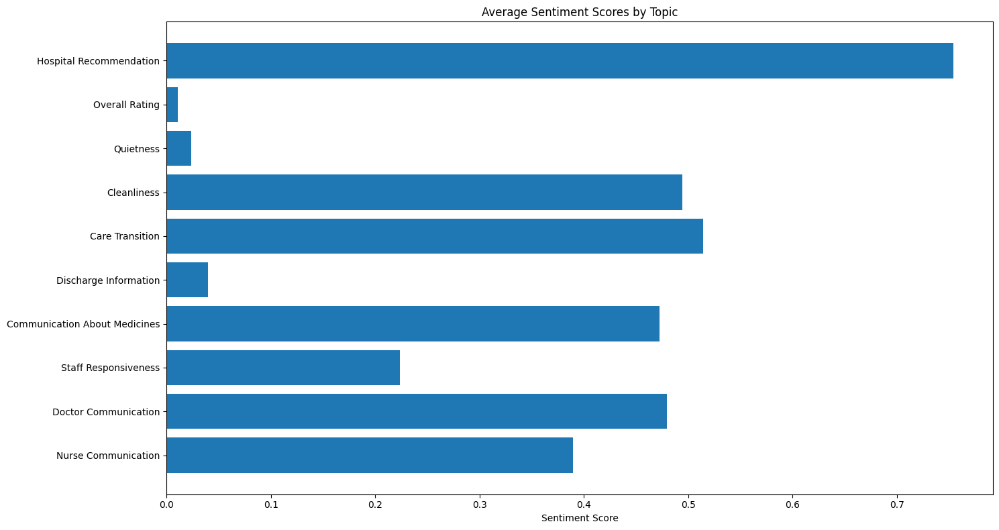

In [ ]:
# Create visualization

plt.figure(figsize=(15, 8))
sentiment_scores = []
topics = []

for topic in topic_mapping.keys():
    sentiment_col = f'{topic}_Sentiment'
    mean_sentiment = processed_df[sentiment_col].mean()
    if not np.isnan(mean_sentiment):
        sentiment_scores.append(mean_sentiment)
        topics.append(topic)

plt.barh(topics, sentiment_scores)
plt.title('Average Sentiment Scores by Topic')
plt.xlabel('Sentiment Score')
plt.tight_layout()
plt.show()

In [ ]:
# Save processed data
processed_df.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_with_sentiment.csv', index=False)
print("\nProcessed data saved to 'processed_hcahps_with_sentiment.csv'")


Processed data saved to 'processed_hcahps_with_sentiment.csv'


In [ ]:
# Save to Parquet
processed_df.to_parquet('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_with_sentiment.parquet', index=False)
print("\nProcessed data saved to 'processed_hcahps_with_sentiment.parquet'")



Processed data saved to 'processed_hcahps_with_sentiment.parquet'


In [ ]:
# Display sample of sentiment analysis results
print("\nSample of Sentiment Analysis Results:")
sample_df = processed_df[['HCAHPS Answer Description'] +
                        [f'{topic}_Sentiment' for topic in topic_mapping.keys()] +
                        [f'{topic}_Score' for topic in topic_mapping.keys()]].head()
print(sample_df)


Sample of Sentiment Analysis Results:
                         HCAHPS Answer Description  \
0                Nurses "always" communicated well   
1  Nurses "sometimes" or "never" communicated well   
2               Nurses "usually" communicated well   
3          Nurse communication - linear mean score   
4                Nurse communication - star rating   

   Nurse Communication_Sentiment  Doctor Communication_Sentiment  \
0                       0.999234                             NaN   
1                       0.000357                             NaN   
2                       0.996646                             NaN   
3                       0.006095                             NaN   
4                       0.700406                             NaN   

   Staff Responsiveness_Sentiment  Communication About Medicines_Sentiment  \
0                             NaN                                      NaN   
1                             NaN                                      

In [ ]:

# Load the dataset
file_path = '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_with_sentiment.csv'
df = pd.read_csv(file_path)

# Display basic information about the dataset
print(f"Dataset dimensions: {df.shape}")
print(f"\nNumber of unique facilities: {df['Facility ID'].nunique()}")
print(f"\nNumber of unique survey measures: {df['HCAHPS Measure ID'].nunique()}")


Dataset dimensions: (444447, 39)

Number of unique facilities: 4780

Number of unique survey measures: 93


In [ ]:
# Check data types
print("Data types in the dataset:")
print(df.dtypes)


Data types in the dataset:
Facility ID                                 object
Facility Name                               object
Address                                     object
City/Town                                   object
State                                       object
ZIP Code                                     int64
County/Parish                               object
Telephone Number                            object
HCAHPS Measure ID                           object
HCAHPS Question                             object
HCAHPS Answer Description                   object
Patient Survey Star Rating                  object
HCAHPS Answer Percent                       object
HCAHPS Linear Mean Value                    object
Number of Completed Surveys                 object
Survey Response Rate Percent                object
Start Date                                  object
End Date                                    object
Topic                                       object
Nurs

In [ ]:
# Percentage of missing values
missing_percentage = (df.isnull().sum() / len(df)) * 100
print("\nPercentage of missing values in columns:")
print(missing_percentage[missing_percentage > 0])  # Only show columns with missing values



Percentage of missing values in columns:
Nurse Communication_Sentiment              88.172043
Nurse Communication_Score                  88.172043
Doctor Communication_Sentiment             88.172043
Doctor Communication_Score                 88.172043
Staff Responsiveness_Sentiment             88.172043
Staff Responsiveness_Score                 88.172043
Communication About Medicines_Sentiment    88.172043
Communication About Medicines_Score        88.172043
Discharge Information_Sentiment            91.397849
Discharge Information_Score                91.397849
Care Transition_Sentiment                  84.946237
Care Transition_Score                      84.946237
Cleanliness_Sentiment                      94.623656
Cleanliness_Score                          94.623656
Quietness_Sentiment                        94.623656
Quietness_Score                            94.623656
Overall Rating_Sentiment                   94.623656
Overall Rating_Score                       94.623656
Hosp

## Understanding the Dataset Structure

The HCAHPS dataset has a hierarchical structure where each hospital (identified by `Facility ID`) has multiple survey measures. Let's examine the distribution of survey measures:


In [ ]:

# Count of different types of HCAHPS measures
measure_counts = df['HCAHPS Measure ID'].value_counts().reset_index()
measure_counts.columns = ['HCAHPS Measure ID', 'Count']

fig = px.bar(measure_counts, x='HCAHPS Measure ID', y='Count',
            title='Distribution of HCAHPS Measures',
            color='Count',
            color_continuous_scale='Blues')

fig.update_layout(
    xaxis_title='HCAHPS Measure ID',
    yaxis_title='Count',
    height=500,
    width=900,
    xaxis={'categoryorder':'total descending'}
)

fig.show()

In [ ]:
# Check the unique HCAHPS questions
print("\nUnique HCAHPS questions:")
unique_questions = df['HCAHPS Question'].unique()
for i, question in enumerate(unique_questions, 1):
    print(f"{i}. {question}")


Unique HCAHPS questions:
1. Patients who reported that their nurses "Always" communicated well
2. Patients who reported that their nurses "Sometimes" or "Never" communicated well
3. Patients who reported that their nurses "Usually" communicated well
4. Nurse communication - linear mean score
5. Nurse communication - star rating
6. Patients who reported that their nurses "Always" treated them with courtesy and respect
7. Patients who reported that their nurses "Sometimes" or "Never"  treated them with courtesy and respect
8. Patients who reported that their nurses "Usually"  treated them with courtesy and respect
9. Patients who reported that their nurses "Always" listened carefully to them
10. Patients who reported that their nurses "Sometimes" or "Never" listened carefully to them
11. Patients who reported that their nurses "Usually" listened carefully to them
12. Patients who reported that their nurses "Always" explained things in a way they could understand
13. Patients who reporte

In [ ]:
# Top answer descriptions
top_answers = df['HCAHPS Answer Description'].value_counts().reset_index().head(10)
top_answers.columns = ['HCAHPS Answer Description', 'Count']

fig = px.bar(top_answers, x='HCAHPS Answer Description', y='Count',
            title='Top 10 HCAHPS Answer Descriptions',
            color='Count',
            color_continuous_scale='Blues')

fig.update_layout(
    xaxis_title='HCAHPS Answer Description',
    yaxis_title='Count',
    height=900,
    width=900,
    xaxis={'categoryorder':'total descending'}
)

fig.show()

## Understanding the Sentiment and Score Columns

The dataset includes derived sentiment and score columns for different care dimensions. Let's analyze these columns:


In [ ]:
# List sentiment and score columns
sentiment_cols = [col for col in df.columns if col.endswith('_Sentiment')]
score_cols = [col for col in df.columns if col.endswith('_Score')]

print(f"\nSentiment columns ({len(sentiment_cols)}):")
print(sentiment_cols)

print(f"\nScore columns ({len(score_cols)}):")
print(score_cols)


Sentiment columns (10):
['Nurse Communication_Sentiment', 'Doctor Communication_Sentiment', 'Staff Responsiveness_Sentiment', 'Communication About Medicines_Sentiment', 'Discharge Information_Sentiment', 'Care Transition_Sentiment', 'Cleanliness_Sentiment', 'Quietness_Sentiment', 'Overall Rating_Sentiment', 'Hospital Recommendation_Sentiment']

Score columns (10):
['Nurse Communication_Score', 'Doctor Communication_Score', 'Staff Responsiveness_Score', 'Communication About Medicines_Score', 'Discharge Information_Score', 'Care Transition_Score', 'Cleanliness_Score', 'Quietness_Score', 'Overall Rating_Score', 'Hospital Recommendation_Score']


In [ ]:
# Basic statistics for sentiment scores
sentiment_stats = df[sentiment_cols].describe().T.reset_index()
sentiment_stats = sentiment_stats.rename(columns={'index': 'Sentiment Dimension'})

# Create a more readable format for the dimensions
sentiment_stats['Dimension'] = sentiment_stats['Sentiment Dimension'].str.replace('_Sentiment', '')

# Create a visualization for the sentiment score distributions
fig = go.Figure()

for col in sentiment_cols:
    dimension = col.replace('_Sentiment', '')
    fig.add_trace(go.Box(
        y=df[col].dropna(),
        name=dimension,
        boxmean=True
    ))

fig.update_layout(
    title='Distribution of Sentiment Scores Across Care Dimensions',
    yaxis_title='Sentiment Score',
    height=600,
    width=1000,
    showlegend=False
)



# Save the figure
fig.write_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/sentiment_distribution.html")

fig.show()

## Summary of Data Loading Approach

Our approach to data loading and processing for this recommendation system includes:

1. **Data Validation**: We've verified the file can be loaded and has the expected structure.
2. **Initial Assessment**: We've examined the dimensions, data types, and missing values to understand what preprocessing will be required.
3. **Feature Context**: We've identified the key features including:
   - Hospital identifiers and metadata (Facility ID, Name, Location)
   - Survey measures and questions (HCAHPS measures and responses)
   - Derived sentiment and score features for different care dimensions
4. **Hierarchical Structure Recognition**: We've noted the hierarchical relationship between facilities, measures, and responses.

In the next section, we'll focus on data wrangling to address missing values, convert data types, and prepare the dataset for exploratory analysis and modeling.

# 3. Data Wrangling

## Data Preprocessing Overview

In this section, we'll clean and preprocess the HCAHPS dataset to prepare it for exploratory data analysis and modeling. Our preprocessing steps will include:

1. Handling missing values
2. Converting data types
3. Feature engineering
4. Creating a hospital-centric view of the data
5. Normalizing sentiment and score features


In [ ]:
# First, let's create a copy of the original dataframe to preserve it
df_clean = df.copy()

# Display the initial shape
print(f"Initial shape: {df_clean.shape}")

Initial shape: (444447, 39)


## Handling Missing Values

Let's address missing values in our dataset:

In [ ]:
# Check the percentage of missing values in each column
missing_percent = (df_clean.isnull().sum() / len(df_clean) * 100).sort_values(ascending=False)
columns_with_missing = missing_percent[missing_percent > 0]

print("Columns with missing values (%):")
print(columns_with_missing)

# Visualize columns with missing values
if not columns_with_missing.empty:
    fig = px.bar(
        x=columns_with_missing.index,
        y=columns_with_missing.values,
        title='Percentage of Missing Values by Column',
        labels={'x': 'Column', 'y': 'Missing Values (%)'},
        color=columns_with_missing.values,
        color_continuous_scale='Blues'
    )

    fig.update_layout(
        xaxis={'categoryorder': 'total descending'},
        height=500,
        width=900
    )

    fig.show()

Columns with missing values (%):
Cleanliness_Sentiment                      94.623656
Quietness_Score                            94.623656
Quietness_Sentiment                        94.623656
Cleanliness_Score                          94.623656
Overall Rating_Sentiment                   94.623656
Overall Rating_Score                       94.623656
Hospital Recommendation_Sentiment          93.548387
Hospital Recommendation_Score              93.548387
Discharge Information_Score                91.397849
Discharge Information_Sentiment            91.397849
Nurse Communication_Sentiment              88.172043
Staff Responsiveness_Sentiment             88.172043
Staff Responsiveness_Score                 88.172043
Doctor Communication_Sentiment             88.172043
Nurse Communication_Score                  88.172043
Communication About Medicines_Sentiment    88.172043
Communication About Medicines_Score        88.172043
Doctor Communication_Score                 88.172043
Care Transiti

Let's handle missing values based on column type and importance:

In [ ]:
# Handling missing values in numeric columns
numeric_cols = df_clean.select_dtypes(include=np.number).columns

# For sentiment and score columns, we'll fill NAs with the mean of that column
sentiment_and_score_cols = sentiment_cols + score_cols
for col in sentiment_and_score_cols:
    if col in df_clean.columns:
        col_mean = df_clean[col].mean()
        df_clean[col] = df_clean[col].fillna(col_mean)
        print(f"Filled missing values in {col} with mean: {col_mean:.4f}")

Filled missing values in Nurse Communication_Sentiment with mean: 0.3897
Filled missing values in Doctor Communication_Sentiment with mean: 0.4798
Filled missing values in Staff Responsiveness_Sentiment with mean: 0.2237
Filled missing values in Communication About Medicines_Sentiment with mean: 0.4726
Filled missing values in Discharge Information_Sentiment with mean: 0.0397
Filled missing values in Care Transition_Sentiment with mean: 0.5140
Filled missing values in Cleanliness_Sentiment with mean: 0.4945
Filled missing values in Quietness_Sentiment with mean: 0.0238
Filled missing values in Overall Rating_Sentiment with mean: 0.0105
Filled missing values in Hospital Recommendation_Sentiment with mean: 0.7543
Filled missing values in Nurse Communication_Score with mean: 2.3636
Filled missing values in Doctor Communication_Score with mean: 2.8182
Filled missing values in Staff Responsiveness_Score with mean: 1.7273
Filled missing values in Communication About Medicines_Score with mean

In [ ]:
# For survey-related percentages and counts, we'll fill NAs with 0
survey_numeric_cols = ['HCAHPS Answer Percent', 'Number of Completed Surveys',
                      'Survey Response Rate Percent', 'HCAHPS Linear Mean Value']
for col in survey_numeric_cols:
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].fillna('0')

In [ ]:
# For categorical columns, we'll fill NAs with 'Unknown'
categorical_cols = df_clean.select_dtypes(include=['object']).columns
for col in categorical_cols:
    if col in df_clean.columns and col not in ['Facility ID', 'HCAHPS Measure ID']:
        df_clean[col] = df_clean[col].fillna('Unknown')

In [ ]:
# Verify missing values after handling
remaining_missing = df_clean.isnull().sum()
print("\nRemaining missing values after handling:")
print(remaining_missing[remaining_missing > 0])


Remaining missing values after handling:
Series([], dtype: int64)


## Converting Data Types

Let's convert data types for appropriate columns:

In [ ]:
# Convert percentage strings to numeric values

percent_columns = ['HCAHPS Answer Percent', 'Survey Response Rate Percent']
for col in percent_columns:
    if col in df_clean.columns:
        # Replace '%' and non-numeric values before conversion
        df_clean[col] = pd.to_numeric(df_clean[col].str.replace('%', '', regex=False), errors='coerce')
        # Now you can fill NaN with 0 if needed
        df_clean[col] = df_clean[col].fillna(0)

In [ ]:
# Convert numeric string columns to appropriate numeric types
numeric_string_cols = ['Number of Completed Surveys', 'HCAHPS Linear Mean Value']
for col in numeric_string_cols:
    if col in df_clean.columns:
        df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')

In [ ]:
# Convert date columns to datetime format
date_columns = ['Start Date', 'End Date']
for col in date_columns:
    if col in df_clean.columns:
        df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')

In [ ]:
# Check updated data types
print("\nUpdated data types:")
print(df_clean.dtypes)


Updated data types:
Facility ID                                        object
Facility Name                                      object
Address                                            object
City/Town                                          object
State                                              object
ZIP Code                                            int64
County/Parish                                      object
Telephone Number                                   object
HCAHPS Measure ID                                  object
HCAHPS Question                                    object
HCAHPS Answer Description                          object
Patient Survey Star Rating                         object
HCAHPS Answer Percent                             float64
HCAHPS Linear Mean Value                          float64
Number of Completed Surveys                       float64
Survey Response Rate Percent                      float64
Start Date                                 datetime

## Feature Engineering

Let's create some new features that will be helpful for our recommendation system:


In [ ]:
# Create a region column based on state
if 'State' in df_clean.columns:
    # Define regions based on Census Bureau regions
    northeast = ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NJ', 'NY', 'PA']
    midwest = ['IL', 'IN', 'MI', 'OH', 'WI', 'IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD']
    south = ['DE', 'FL', 'GA', 'MD', 'NC', 'SC', 'VA', 'DC', 'WV', 'AL', 'KY', 'MS', 'TN', 'AR', 'LA', 'OK', 'TX']
    west = ['AZ', 'CO', 'ID', 'MT', 'NV', 'NM', 'UT', 'WY', 'AK', 'CA', 'HI', 'OR', 'WA']

    def get_region(state):
        if state in northeast:
            return 'Northeast'
        elif state in midwest:
            return 'Midwest'
        elif state in south:
            return 'South'
        elif state in west:
            return 'West'
        else:
            return 'Unknown'

    df_clean['Region'] = df_clean['State'].apply(get_region)

In [ ]:
    # Visualize hospital distribution by region
    region_counts = df_clean['Region'].value_counts().reset_index()
    region_counts.columns = ['Region', 'Count']

    fig = px.pie(
        region_counts,
        values='Count',
        names='Region',
        title='Distribution of Hospitals by Region',
        color_discrete_sequence=px.colors.sequential.Blues
    )

    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.update_layout(height=500, width=700)
    fig.show()

## Creating a Hospital-Centric View

For our recommendation system, we'll need a hospital-centric view that aggregates all measures for each facility:


In [ ]:
# Group by Facility ID and calculate mean sentiment and score values
hospital_df = df_clean.groupby('Facility ID').agg({
    'Facility Name': 'first',
    'City/Town': 'first',
    'State': 'first',
    'ZIP Code': 'first',
    'County/Parish': 'first',
    'Region': 'first',
    'Number of Completed Surveys': 'mean',
    'Survey Response Rate Percent': 'mean'
})

# Add aggregated sentiment and score columns
for col in sentiment_cols + score_cols:
    if col in df_clean.columns:
        hospital_df[col] = df_clean.groupby('Facility ID')[col].mean()

# Reset the index to make Facility ID a column again
hospital_df = hospital_df.reset_index()

print(f"Hospital-centric dataframe shape: {hospital_df.shape}")
print("\nHospital-centric dataframe columns:")
print(hospital_df.columns.tolist())

# Display the first few rows of the hospital-centric dataframe
hospital_df.head()

Hospital-centric dataframe shape: (4780, 29)

Hospital-centric dataframe columns:
['Facility ID', 'Facility Name', 'City/Town', 'State', 'ZIP Code', 'County/Parish', 'Region', 'Number of Completed Surveys', 'Survey Response Rate Percent', 'Nurse Communication_Sentiment', 'Doctor Communication_Sentiment', 'Staff Responsiveness_Sentiment', 'Communication About Medicines_Sentiment', 'Discharge Information_Sentiment', 'Care Transition_Sentiment', 'Cleanliness_Sentiment', 'Quietness_Sentiment', 'Overall Rating_Sentiment', 'Hospital Recommendation_Sentiment', 'Nurse Communication_Score', 'Doctor Communication_Score', 'Staff Responsiveness_Score', 'Communication About Medicines_Score', 'Discharge Information_Score', 'Care Transition_Score', 'Cleanliness_Score', 'Quietness_Score', 'Overall Rating_Score', 'Hospital Recommendation_Score']


,Facility ID,Facility Name,City/Town,State,ZIP Code,County/Parish,Region,Number of Completed Surveys,Survey Response Rate Percent,Nurse Communication_Sentiment,Doctor Communication_Sentiment,Staff Responsiveness_Sentiment,Communication About Medicines_Sentiment,Discharge Information_Sentiment,Care Transition_Sentiment,Cleanliness_Sentiment,Quietness_Sentiment,Overall Rating_Sentiment,Hospital Recommendation_Sentiment,Nurse Communication_Score,Doctor Communication_Score,Staff Responsiveness_Score,Communication About Medicines_Score,Discharge Information_Score,Care Transition_Score,Cleanliness_Score,Quietness_Score,Overall Rating_Score,Hospital Recommendation_Score
0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,BUDA,TX,78610,HAYS,South,44.0,14.0,0.389664,0.479778,0.223743,0.472569,0.039669,0.517064,0.49449,0.023843,0.010469,0.754259,2.363636,2.818182,1.727273,2.818182,1.0,2.878788,2.8,1.0,1.0,4.0
1,670132,METHODIST SOUTHLAKE MEDICAL CENTER,SOUTHLAKE,TX,76092,TARRANT,South,79.0,21.0,0.389664,0.479778,0.223743,0.472569,0.039669,0.513994,0.49449,0.023843,0.010469,0.754259,2.363636,2.818182,1.727273,2.818182,1.0,2.857143,2.8,1.0,1.0,4.0
2,670133,ER TX MEDICAL CENTER MANSFIELD,MANSFIELD,TX,76063,TARRANT,South,NaN,0.0,0.389664,0.479778,0.223743,0.472569,0.039669,0.513994,0.49449,0.023843,0.010469,0.754259,2.363636,2.818182,1.727273,2.818182,1.0,2.857143,2.8,1.0,1.0,4.0
3,670134,ALTUS LUMBERTON HOSPITAL,LUMBERTON,TX,77657,HARDIN,South,64.0,37.0,0.389664,0.479778,0.223743,0.472569,0.039669,0.513994,0.49449,0.023843,0.010469,0.754259,2.363636,2.818182,1.727273,2.818182,1.0,2.857143,2.8,1.0,1.0,4.0
4,670135,"ALTUS HOUSTON HOSPITAL, LP",HOUSTON,TX,77072,HARRIS,South,NaN,0.0,0.389664,0.479778,0.223743,0.472569,0.039669,0.513994,0.49449,0.023843,0.010469,0.754259,2.363636,2.818182,1.727273,2.818182,1.0,2.857143,2.8,1.0,1.0,4.0


## Normalizing Features

Let's normalize the sentiment and score features to ensure they're on comparable scales:


In [ ]:
# Create a copy of the features we want to normalize
features_to_normalize = sentiment_cols + score_cols
hospital_features = hospital_df[features_to_normalize].copy()

# Initialize the scaler and fit_transform the features
scaler = MinMaxScaler()
hospital_features_normalized = scaler.fit_transform(hospital_features)

# Create a new DataFrame with the normalized features
hospital_features_normalized_df = pd.DataFrame(
    hospital_features_normalized,
    columns=[col + '_normalized' for col in features_to_normalize]
)

In [ ]:
# Add the normalized features to the hospital dataframe
hospital_df = pd.concat([hospital_df, hospital_features_normalized_df], axis=1)

# Create a visual to compare the distribution before and after normalization
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Before Normalization', 'After Normalization')
)

# Sample a few sentiment columns for visualization
sample_cols = sentiment_cols[:3]  # Taking first 3 sentiment columns
sample_normalized_cols = [col + '_normalized' for col in sample_cols]

# Add traces for original values
for i, col in enumerate(sample_cols):
    fig.add_trace(
        go.Box(y=hospital_df[col], name=col.replace('_Sentiment', '')),
        row=1, col=1
    )

# Add traces for normalized values
for i, col in enumerate(sample_normalized_cols):
    fig.add_trace(
        go.Box(y=hospital_df[col], name=col.replace('_Sentiment_normalized', '')),
        row=1, col=2
    )

fig.update_layout(
    title='Comparison of Feature Distributions Before and After Normalization',
    height=500,
    width=1000,
    showlegend=False
)

fig.show()

## Creating a Topic-Based Feature View

For our recommendation system, it's helpful to have a topic-centric view of the data:


In [ ]:
# Extract the topics from the sentiment columns
topics = [col.replace('_Sentiment', '') for col in sentiment_cols]
print(f"Identified topics: {topics}")

# Create a topic-to-index mapping for our embeddings
topic_to_idx = {topic: idx for idx, topic in enumerate(topics)}
print("\nTopic to index mapping:")
print(topic_to_idx)

Identified topics: ['Nurse Communication', 'Doctor Communication', 'Staff Responsiveness', 'Communication About Medicines', 'Discharge Information', 'Care Transition', 'Cleanliness', 'Quietness', 'Overall Rating', 'Hospital Recommendation']

Topic to index mapping:
{'Nurse Communication': 0, 'Doctor Communication': 1, 'Staff Responsiveness': 2, 'Communication About Medicines': 3, 'Discharge Information': 4, 'Care Transition': 5, 'Cleanliness': 6, 'Quietness': 7, 'Overall Rating': 8, 'Hospital Recommendation': 9}


## Creating Embedding Initialization Data

Let's prepare data that will be used to initialize our neural embeddings:


In [ ]:
# Create a mapping of Facility ID to an index
facility_ids = hospital_df['Facility ID'].unique()
facility_to_idx = {facility_id: idx for idx, facility_id in enumerate(facility_ids)}

# Create a dataframe that will be used for training
# Each row will contain a facility, a topic, and the sentiment score
training_data = []

for _, row in hospital_df.iterrows():
    facility_id = row['Facility ID']
    facility_idx = facility_to_idx[facility_id]

    for topic in topics:
        sentiment_col = f"{topic}_Sentiment"
        score_col = f"{topic}_Score"

        if sentiment_col in row and not pd.isna(row[sentiment_col]):
            sentiment = row[sentiment_col]
            score = row[score_col] if score_col in row and not pd.isna(row[score_col]) else 0.0

            training_data.append({
                'Facility_Index': facility_idx,
                'Facility_ID': facility_id,
                'Facility_Name': row['Facility Name'],
                'Topic_Index': topic_to_idx[topic],
                'Topic': topic,
                'Sentiment': sentiment,
                'Score': score
            })

# Convert to DataFrame
training_df = pd.DataFrame(training_data)
print(f"Training data shape: {training_df.shape}")
training_df.head()

Training data shape: (47800, 7)


,Facility_Index,Facility_ID,Facility_Name,Topic_Index,Topic,Sentiment,Score
0,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,0,Nurse Communication,0.389664,2.363636
1,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,1,Doctor Communication,0.479778,2.818182
2,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,2,Staff Responsiveness,0.223743,1.727273
3,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,3,Communication About Medicines,0.472569,2.818182
4,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,4,Discharge Information,0.039669,1.000000


## Data Quality Check

Let's perform a final check on our processed data:

In [ ]:
# Check for any remaining missing values in hospital_df
missing_in_hospital_df = hospital_df.isnull().sum()
print("\nMissing values in hospital-centric dataframe:")
print(missing_in_hospital_df[missing_in_hospital_df > 0])

# Check for any remaining missing values in training_df
missing_in_training_df = training_df.isnull().sum()
print("\nMissing values in training dataframe:")
print(missing_in_training_df[missing_in_training_df > 0])

# Create a summary of our data processing steps
print("\nData Wrangling Summary:")
print(f"Original dataset shape: {df.shape}")
print(f"Cleaned dataset shape: {df_clean.shape}")
print(f"Hospital-centric dataset shape: {hospital_df.shape}")
print(f"Training dataset shape: {training_df.shape}")
print(f"Number of unique facilities: {len(facility_ids)}")
print(f"Number of unique topics: {len(topics)}")


Missing values in hospital-centric dataframe:
Number of Completed Surveys    749
dtype: int64

Missing values in training dataframe:
Series([], dtype: int64)

Data Wrangling Summary:
Original dataset shape: (444447, 39)
Cleaned dataset shape: (444447, 40)
Hospital-centric dataset shape: (4780, 49)
Training dataset shape: (47800, 7)
Number of unique facilities: 4780
Number of unique topics: 10


## Save Processed Data

Let's save our processed datasets for future use:

In [ ]:
# Save the processed dataframes to CSV files
df_clean.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_data_03_03_25.csv', index=False)
hospital_df.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/hospital_centric_data_03_03_25.csv', index=False)
training_df.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/training_data_03_03_25.csv', index=False)

print("Processed datasets saved to CSV files.")

Processed datasets saved to CSV files.


## Data Wrangling Summary

In this section, we have:

1. **Handled Missing Values**: We've filled missing values in sentiment and score columns with means, and categorical columns with appropriate substitutes.

2. **Converted Data Types**: We've converted string percentages to numeric values and date strings to datetime objects.

3. **Engineered Features**: We've created region categories based on states and star rating categories.

4. **Created a Hospital-Centric View**: We've aggregated measures to create a per-hospital dataset that will be crucial for our recommendation system.

5. **Normalized Features**: We've normalized sentiment and score features to ensure they're on comparable scales.

6. **Prepared Training Data**: We've created a training dataset that maps facilities to topics with their associated sentiment and score values.

These preprocessing steps have transformed our raw HCAHPS data into a structured format that's ready for exploratory data analysis and deep learning model development.

# 3.4 Enhanced Feature Engineering with Geocoding

In addition to creating region and star rating categories, we'll enhance our dataset with geographical coordinates. Since our dataset contains repeating address information across approximately 440,000 rows, we'll implement an efficient geocoding strategy that:

1. Extracts unique address combinations
2. Geocodes only the unique combinations
3. Merges the coordinates back to the original dataframe

## 3.4.1 Extracting Unique Location Information

In [ ]:
# First, let's extract all unique combinations of location data
print("Extracting unique location combinations...")

df_clean = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_data_03_03_25.csv')

# Check if the required columns exist
address_cols = ['Address', 'City/Town', 'State', 'ZIP Code', 'County/Parish']
missing_cols = [col for col in address_cols if col not in df_clean.columns]

if missing_cols:
    print(f"Warning: The following columns are missing: {missing_cols}")
    # Adjust the list to include only available columns
    address_cols = [col for col in address_cols if col in df_clean.columns]

if not address_cols:
    print("Error: No address columns available for geocoding.")
else:
    # Create a unique identifier for each location
    unique_locations = df_clean[address_cols].drop_duplicates().reset_index(drop=True)

    print(f"Found {len(unique_locations)} unique locations out of {len(df_clean)} total rows")
    unique_locations.head()

Extracting unique location combinations...
Found 4776 unique locations out of 444447 total rows


## 3.4.2 Efficient Geocoding with Caching

We'll use a combination of caching and batch processing to efficiently geocode the unique locations:



In [ ]:
# Cache management functions
def get_cache_path():
    """Get the path to the geocoding cache file"""
    return 'geocode_cache.pkl'

def load_cache():
    """Load the geocoding cache from disk"""
    cache_path = get_cache_path()
    if os.path.exists(cache_path):
        try:
            with open(cache_path, 'rb') as f:
                return pickle.load(f)
        except Exception as e:
            print(f"Error loading cache: {e}")
    return {}

def save_cache(cache):
    """Save the geocoding cache to disk"""
    cache_path = get_cache_path()
    try:
        with open(cache_path, 'wb') as f:
            pickle.dump(cache, f)
        print(f"Cache saved with {len(cache)} entries")
    except Exception as e:
        print(f"Error saving cache: {e}")

# Function to create a standardized address string for geocoding
def create_address_key(row):
    """Convert address components into a standardized string for geocoding"""
    components = []
    for field in address_cols:
        if field in row and pd.notna(row[field]):
            components.append(str(row[field]).strip())
    return ', '.join(components)


### Geocoding Function with Retry Logic

In [ ]:
# Function to geocode with exponential backoff
def geocode_with_retry(address, max_retries=5):
    """
    Geocode an address with exponential backoff retry logic

    Parameters:
    -----------
    address : str
        Address string to geocode
    max_retries : int
        Maximum number of retry attempts

    Returns:
    --------
    geopy.location.Location or None
        Geocoded location object or None if geocoding failed
    """
    # Multiple user agents to rotate through
    user_agents = [
        "hospital_recommendation_system_1",
        "hospital_recommendation_system_2",
        "hospital_recommendation_system_3"
    ]

    # Different timeouts to try
    timeouts = [5, 10, 15, 20, 30]

    for attempt in range(max_retries):
        try:
            # Select a random user agent and appropriate timeout
            user_agent = random.choice(user_agents)
            timeout = timeouts[min(attempt, len(timeouts)-1)]

            # Create a new geolocator for each request to avoid session issues
            geolocator = Nominatim(user_agent=user_agent, timeout=timeout)

            # Add jitter to avoid synchronized requests
            jitter = random.uniform(1.0, 3.0)
            time.sleep(jitter)

            location = geolocator.geocode(address)
            return location
        except (GeocoderTimedOut, GeocoderServiceError) as e:
            wait_time = 2 ** attempt + random.uniform(0, 1)
            print(f"Attempt {attempt+1}/{max_retries} failed for {address}: {str(e)}. Waiting {wait_time:.2f}s...")
            time.sleep(wait_time)
        except Exception as e:
            print(f"Unexpected error for {address}: {str(e)}")
            # For non-timeout errors, wait longer
            time.sleep(10 + random.uniform(0, 5))

    return None

### Main Geocoding Function

In [ ]:
# Function to geocode locations
def geocode_locations(locations_df, batch_size=10, max_locations=None):
    """
    Geocode locations from a DataFrame with robust error handling and caching.

    Parameters:
    -----------
    locations_df : pandas.DataFrame
        DataFrame containing address information
    batch_size : int
        Number of addresses to process in each batch
    max_locations : int or None
        Maximum number of locations to geocode (None for no limit)

    Returns:
    --------
    pandas.DataFrame
        DataFrame with added Latitude and Longitude columns
    """
    # Load existing cache
    geocode_cache = load_cache()
    print(f"Loaded cache with {len(geocode_cache)} existing entries")

    # Prepare a results dataframe
    results = locations_df.copy()
    results['Address_Key'] = results.apply(create_address_key, axis=1)
    results['Latitude'] = np.nan
    results['Longitude'] = np.nan

    # Determine which addresses need geocoding
    to_geocode = []
    cached_indices = []
    cached_values = []

    for idx, address_key in zip(results.index, results['Address_Key']):
        if address_key in geocode_cache:
            cached_indices.append(idx)
            cached_values.append(geocode_cache[address_key])
        else:
            to_geocode.append(idx)

    # Apply cached results in bulk
    if cached_indices:
        for i, idx in enumerate(cached_indices):
            results.loc[idx, 'Latitude'] = cached_values[i][0]
            results.loc[idx, 'Longitude'] = cached_values[i][1]

    print(f"Found {len(cached_indices)} locations in cache, {len(to_geocode)} new locations to geocode")

    # Limit the number of locations to geocode if specified
    if max_locations is not None and len(to_geocode) > max_locations:
        to_geocode = to_geocode[:max_locations]
        print(f"Limiting to {max_locations} new locations due to API constraints")

    # Sequential geocoding with exponential backoff
    if to_geocode:
        print(f"Geocoding {len(to_geocode)} unique addresses...")

        # Process in small batches with generous pauses between
        for i in range(0, len(to_geocode), batch_size):
            batch_indices = to_geocode[i:i+batch_size]

            for idx in tqdm(batch_indices, desc=f"Batch {i//batch_size + 1}/{(len(to_geocode)+batch_size-1)//batch_size}"):
                address_key = results.loc[idx, 'Address_Key']

                try:
                    # Try with full address
                    location = geocode_with_retry(address_key)

                    if location:
                        results.loc[idx, 'Latitude'] = location.latitude
                        results.loc[idx, 'Longitude'] = location.longitude
                        geocode_cache[address_key] = (location.latitude, location.longitude)
                    else:
                        # Try with less specific address if full address fails
                        city_state = f"{results.loc[idx, 'City/Town']}, {results.loc[idx, 'State']}" if ('City/Town' in results.columns and 'State' in results.columns) else None

                        if city_state:
                            location = geocode_with_retry(city_state)
                            if location:
                                results.loc[idx, 'Latitude'] = location.latitude
                                results.loc[idx, 'Longitude'] = location.longitude
                                geocode_cache[address_key] = (location.latitude, location.longitude)
                except Exception as e:
                    print(f"Error geocoding {address_key}: {str(e)}")

            # Save cache after each batch
            save_cache(geocode_cache)

            # Extended pause between batches to avoid rate limiting
            if i + batch_size < len(to_geocode):
                pause_time = random.uniform(10, 15)
                print(f"Completed {i + len(batch_indices)}/{len(to_geocode)} addresses. Pausing for {pause_time:.2f}s...")
                time.sleep(pause_time)

    # Remove temporary column
    results = results.drop(columns=['Address_Key'])

    # Final cache save
    save_cache(geocode_cache)

    return results

### Run the Geocoding Process

In [ ]:
# Set parameters
batch_size = 100  # Small batches to avoid rate limiting
max_initial_geocoding = None  # Set to None to process all or a number to limit for testing


In [ ]:
# Run geocoding
try:
    print("Starting geocoding process for unique locations...")
    geocoded_locations = geocode_locations(
        unique_locations,
        batch_size=batch_size,
        max_locations=max_initial_geocoding
    )

    # Success metrics
    success_count = geocoded_locations['Latitude'].notna().sum()
    print(f"Successfully geocoded {success_count} out of {len(geocoded_locations)} unique locations ({success_count/len(geocoded_locations)*100:.2f}%)")

    # Display results
    display(geocoded_locations.head())

    # Optional: Save interim results
    geocoded_locations.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/geocoded_unique_locations.csv', index=False)

except Exception as e:
    print(f"Error during geocoding: {e}")
    import traceback
    traceback.print_exc()

Starting geocoding process for unique locations...
Loaded cache with 0 existing entries
Found 0 locations in cache, 4776 new locations to geocode
Geocoding 4776 unique addresses...


Batch 1/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 100 entries
Completed 100/4776 addresses. Pausing for 14.61s...


Batch 2/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 200 entries
Completed 200/4776 addresses. Pausing for 12.27s...


Batch 3/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 300 entries
Completed 300/4776 addresses. Pausing for 13.33s...


Batch 4/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 400 entries
Completed 400/4776 addresses. Pausing for 14.08s...


Batch 5/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 500 entries
Completed 500/4776 addresses. Pausing for 14.98s...


Batch 6/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 600 entries
Completed 600/4776 addresses. Pausing for 14.24s...


Batch 7/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 700 entries
Completed 700/4776 addresses. Pausing for 10.68s...


Batch 8/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 800 entries
Completed 800/4776 addresses. Pausing for 10.25s...


Batch 9/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 900 entries
Completed 900/4776 addresses. Pausing for 12.70s...


Batch 10/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1000 entries
Completed 1000/4776 addresses. Pausing for 13.08s...


Batch 11/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1100 entries
Completed 1100/4776 addresses. Pausing for 10.44s...


Batch 12/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1200 entries
Completed 1200/4776 addresses. Pausing for 11.52s...


Batch 13/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1300 entries
Completed 1300/4776 addresses. Pausing for 11.15s...


Batch 14/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1400 entries
Completed 1400/4776 addresses. Pausing for 10.29s...


Batch 15/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1500 entries
Completed 1500/4776 addresses. Pausing for 14.96s...


Batch 16/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1600 entries
Completed 1600/4776 addresses. Pausing for 13.29s...


Batch 17/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1700 entries
Completed 1700/4776 addresses. Pausing for 14.12s...


Batch 18/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1800 entries
Completed 1800/4776 addresses. Pausing for 12.19s...


Batch 19/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 1900 entries
Completed 1900/4776 addresses. Pausing for 12.28s...


Batch 20/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2000 entries
Completed 2000/4776 addresses. Pausing for 12.74s...


Batch 21/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2100 entries
Completed 2100/4776 addresses. Pausing for 10.17s...


Batch 22/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2200 entries
Completed 2200/4776 addresses. Pausing for 14.47s...


Batch 23/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2300 entries
Completed 2300/4776 addresses. Pausing for 12.04s...


Batch 24/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2400 entries
Completed 2400/4776 addresses. Pausing for 12.62s...


Batch 25/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2500 entries
Completed 2500/4776 addresses. Pausing for 12.87s...


Batch 26/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2600 entries
Completed 2600/4776 addresses. Pausing for 13.71s...


Batch 27/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2699 entries
Completed 2700/4776 addresses. Pausing for 12.44s...


Batch 28/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2799 entries
Completed 2800/4776 addresses. Pausing for 13.87s...


Batch 29/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2899 entries
Completed 2900/4776 addresses. Pausing for 12.91s...


Batch 30/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 2999 entries
Completed 3000/4776 addresses. Pausing for 14.91s...


Batch 31/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3099 entries
Completed 3100/4776 addresses. Pausing for 12.94s...


Batch 32/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3199 entries
Completed 3200/4776 addresses. Pausing for 12.93s...


Batch 33/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3299 entries
Completed 3300/4776 addresses. Pausing for 11.58s...


Batch 34/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3399 entries
Completed 3400/4776 addresses. Pausing for 12.23s...


Batch 35/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3498 entries
Completed 3500/4776 addresses. Pausing for 12.15s...


Batch 36/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3598 entries
Completed 3600/4776 addresses. Pausing for 10.02s...


Batch 37/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3698 entries
Completed 3700/4776 addresses. Pausing for 11.95s...


Batch 38/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3798 entries
Completed 3800/4776 addresses. Pausing for 10.94s...


Batch 39/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3898 entries
Completed 3900/4776 addresses. Pausing for 11.72s...


Batch 40/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 3998 entries
Completed 4000/4776 addresses. Pausing for 12.17s...


Batch 41/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4098 entries
Completed 4100/4776 addresses. Pausing for 12.31s...


Batch 42/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4198 entries
Completed 4200/4776 addresses. Pausing for 14.14s...


Batch 43/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4298 entries
Completed 4300/4776 addresses. Pausing for 11.24s...


Batch 44/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4398 entries
Completed 4400/4776 addresses. Pausing for 10.35s...


Batch 45/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4498 entries
Completed 4500/4776 addresses. Pausing for 12.26s...


Batch 46/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4598 entries
Completed 4600/4776 addresses. Pausing for 10.06s...


Batch 47/48:   0%|          | 0/100 [00:00<?, ?it/s]

Cache saved with 4697 entries
Completed 4700/4776 addresses. Pausing for 11.23s...


Batch 48/48:   0%|          | 0/76 [00:00<?, ?it/s]

Cache saved with 4773 entries
Cache saved with 4773 entries
Successfully geocoded 4773 out of 4776 unique locations (99.94%)


,Address,City/Town,State,ZIP Code,County/Parish,Latitude,Longitude
0,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,31.216107,-85.363086
1,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,MARSHALL,34.198328,-86.164942
2,1701 VETERANS DRIVE,FLORENCE,AL,35630,LAUDERDALE,34.805043,-87.650814
3,702 N MAIN ST,OPP,AL,36467,COVINGTON,31.292879,-86.254900
4,101 HOSPITAL CIRCLE,LUVERNE,AL,36049,CRENSHAW,31.693749,-86.264702


In [ ]:
geolocation_df = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/geocoded_unique_locations.csv')
geolocation_df.head()

,Address,City/Town,State,ZIP Code,County/Parish,Latitude,Longitude
0,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,31.216107,-85.363086
1,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,MARSHALL,34.198328,-86.164942
2,1701 VETERANS DRIVE,FLORENCE,AL,35630,LAUDERDALE,34.805043,-87.650814
3,702 N MAIN ST,OPP,AL,36467,COVINGTON,31.292879,-86.254900
4,101 HOSPITAL CIRCLE,LUVERNE,AL,36049,CRENSHAW,31.693749,-86.264702


In [ ]:
geolocation_df.shape

(4776, 7)

## 3.4.4 Merging Coordinates Back to the Original Dataset

Now we'll merge the geocoded coordinates back to the original dataframe efficiently:


In [ ]:
# Define the address columns to use for the merge key
address_cols = ['Address', 'City/Town', 'State', 'ZIP Code', 'County/Parish']

# Function to create consistent merge keys
def create_merge_key(row, cols):
    """Create a tuple-based key from address fields for consistent merging"""
    return tuple(str(row[col]).strip() if pd.notna(row[col]) else 'NA' for col in cols)

# Create merge key in geolocation dataframe
print("Creating merge key in geocoded locations dataframe...")
geolocation_df['merge_key'] = geolocation_df.apply(lambda row: create_merge_key(row, address_cols), axis=1)

# Create merge key in original dataframe
print("Creating merge key in main HCAHPS dataframe...")
df_clean['merge_key'] = df_clean.apply(lambda row: create_merge_key(row, address_cols), axis=1)

# Create a dictionary mapping from merge_key to coordinates
print("Creating coordinate mapping dictionary...")
coord_dict = dict(zip(
    geolocation_df['merge_key'],
    zip(geolocation_df['Latitude'], geolocation_df['Longitude'])
))

print(f"Created mapping with {len(coord_dict)} entries")

# Map coordinates to the original dataframe
print("Mapping coordinates to HCAHPS dataset...")
df_clean['Latitude'] = df_clean['merge_key'].map(lambda x: coord_dict.get(x, (np.nan, np.nan))[0])
df_clean['Longitude'] = df_clean['merge_key'].map(lambda x: coord_dict.get(x, (np.nan, np.nan))[1])

# Drop the temporary merge_key column
df_clean = df_clean.drop(columns=['merge_key'])

# Report on the results
coord_count = df_clean['Latitude'].notna().sum()
print(f"Added coordinates to {coord_count:,} out of {len(df_clean):,} rows ({coord_count/len(df_clean)*100:.2f}%)")

# Show unique facilities with and without coordinates
facility_count = df_clean['Facility ID'].nunique()
facilities_with_coords = df_clean.loc[df_clean['Latitude'].notna(), 'Facility ID'].nunique()
print(f"Facilities with coordinates: {facilities_with_coords:,} out of {facility_count:,} ({facilities_with_coords/facility_count*100:.2f}%)")

# Display sample of the merged data
print("\nSample of geocoded data:")
display(df_clean.head())

Creating merge key in geocoded locations dataframe...
Creating merge key in main HCAHPS dataframe...
Creating coordinate mapping dictionary...
Created mapping with 4776 entries
Mapping coordinates to HCAHPS dataset...
Added coordinates to 444,168 out of 444,447 rows (99.94%)
Facilities with coordinates: 4,777 out of 4,780 (99.94%)

Sample of geocoded data:


,Facility ID,Facility Name,Address,City/Town,State,ZIP Code,County/Parish,Telephone Number,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,HCAHPS Answer Percent,HCAHPS Linear Mean Value,Number of Completed Surveys,Survey Response Rate Percent,Start Date,End Date,Topic,Nurse Communication_Sentiment,Nurse Communication_Score,Doctor Communication_Sentiment,Doctor Communication_Score,Staff Responsiveness_Sentiment,Staff Responsiveness_Score,Communication About Medicines_Sentiment,Communication About Medicines_Score,Discharge Information_Sentiment,Discharge Information_Score,Care Transition_Sentiment,Care Transition_Score,Cleanliness_Sentiment,Cleanliness_Score,Quietness_Sentiment,Quietness_Score,Overall Rating_Sentiment,Overall Rating_Score,Hospital Recommendation_Sentiment,Hospital Recommendation_Score,Region,Latitude,Longitude
0,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...","Nurses ""always"" communicated well",Not Applicable,72.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.999234,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
1,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",Not Applicable,6.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.000357,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
2,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...","Nurses ""usually"" communicated well",Not Applicable,22.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.996646,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
3,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,Nurse communication - linear mean score,Not Applicable,0.0,89.0,643.0,17.0,2023-01-01,2023-12-31,Other,0.006095,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
4,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_STAR_RATING,Nurse communication - star rating,Nurse communication - star rating,2,0.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Other,0.700406,4.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086


### Verify Results and Save Final Dataset

In [ ]:
# Verify that all addressable rows received coordinates
ungeocoded_count = df_clean['Latitude'].isna().sum()
if ungeocoded_count > 0:
    print(f"Warning: {ungeocoded_count:,} rows ({ungeocoded_count/len(df_clean)*100:.2f}%) did not receive coordinates")

    # Sample ungeocoded addresses for investigation
    print("\nSample ungeocoded addresses:")
    display(df_clean[df_clean['Latitude'].isna()][address_cols].head(5))

    # Check for patterns in missing coordinates
    ungeocoded_df = df_clean[df_clean['Latitude'].isna()]
    ungeocoded_facilities = ungeocoded_df['Facility ID'].nunique()
    print(f"\nUnique facilities missing coordinates: {ungeocoded_facilities:,}")

    # Check for missing address components in ungeocoded rows
    for col in address_cols:
        missing_count = ungeocoded_df[col].isna().sum()
        if missing_count > 0:
            print(f"- {missing_count:,} ungeocoded rows have missing values in '{col}'")
else:
    print("Success! All rows successfully geocoded.")

# Save the final dataset
output_file = '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/df_clean_geocoded.csv'
df_clean.to_csv(output_file, index=False)
print(f"\nSaved geocoded dataset to: {output_file}")

# Display sample of the merged data
print("\nSample of geocoded data:")
display(df_clean.head())


Sample ungeocoded addresses:


,Address,City/Town,State,ZIP Code,County/Parish
249054,535 SOUTH HUMBOLDT STREET,BATTE MTN,NV,89820,LANDER
249055,535 SOUTH HUMBOLDT STREET,BATTE MTN,NV,89820,LANDER
249056,535 SOUTH HUMBOLDT STREET,BATTE MTN,NV,89820,LANDER
249057,535 SOUTH HUMBOLDT STREET,BATTE MTN,NV,89820,LANDER
249058,535 SOUTH HUMBOLDT STREET,BATTE MTN,NV,89820,LANDER



Unique facilities missing coordinates: 3

Saved geocoded dataset to: /content/drive/MyDrive/Portfolio/HCAHPS Analysis/df_clean_geocoded.csv

Sample of geocoded data:


,Facility ID,Facility Name,Address,City/Town,State,ZIP Code,County/Parish,Telephone Number,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,HCAHPS Answer Percent,HCAHPS Linear Mean Value,Number of Completed Surveys,Survey Response Rate Percent,Start Date,End Date,Topic,Nurse Communication_Sentiment,Nurse Communication_Score,Doctor Communication_Sentiment,Doctor Communication_Score,Staff Responsiveness_Sentiment,Staff Responsiveness_Score,Communication About Medicines_Sentiment,Communication About Medicines_Score,Discharge Information_Sentiment,Discharge Information_Score,Care Transition_Sentiment,Care Transition_Score,Cleanliness_Sentiment,Cleanliness_Score,Quietness_Sentiment,Quietness_Score,Overall Rating_Sentiment,Overall Rating_Score,Hospital Recommendation_Sentiment,Hospital Recommendation_Score,Region,Latitude,Longitude
0,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...","Nurses ""always"" communicated well",Not Applicable,72.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.999234,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
1,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",Not Applicable,6.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.000357,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
2,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...","Nurses ""usually"" communicated well",Not Applicable,22.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.996646,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
3,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,Nurse communication - linear mean score,Not Applicable,0.0,89.0,643.0,17.0,2023-01-01,2023-12-31,Other,0.006095,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086
4,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_STAR_RATING,Nurse communication - star rating,Nurse communication - star rating,2,0.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Other,0.700406,4.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086


## 3.4.5 Distance-Based Features

Now that we have coordinates, we can add distance-based features:

In [ ]:
df_clean = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/df_clean_geocoded.csv')

# Add distance-based features if we have coordinate data
if 'Latitude' in df_clean.columns and df_clean['Latitude'].notna().sum() > 0:
    from math import radians, sin, cos, sqrt, atan2

    print("Creating distance-based features...")

    # Haversine formula to calculate distance between two coordinates
    def haversine_distance(lat1, lon1, lat2, lon2):
        # Approximate radius of earth in miles
        R = 3958.8

        # Convert latitude and longitude from degrees to radians
        lat1 = radians(lat1)
        lon1 = radians(lon1)
        lat2 = radians(lat2)
        lon2 = radians(lon2)

        # Haversine formula
        dlon = lon2 - lon1
        dlat = lat2 - lat1
        a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
        c = 2 * atan2(sqrt(a), sqrt(1-a))
        distance = R * c

        return distance

Creating distance-based features...


In [ ]:
# Add distance-based features if we have coordinate data
if 'df_clean' in globals() and 'Latitude' in df_clean.columns and df_clean['Latitude'].notna().sum() > 0:
    from math import radians, sin, cos, sqrt, atan2

    print("Creating distance-based features...")

    # Haversine formula to calculate distance between two coordinates
    def haversine_distance(lat1, lon1, lat2, lon2):
        # Approximate radius of earth in miles
        R = 3958.8

        # Convert latitude and longitude from degrees to radians
        lat1 = radians(lat1)
        lon1 = radians(lon1)
        lat2 = radians(lat2)
        lon2 = radians(lon2)

        # Haversine formula
        dlon = lon2 - lon1
        dlat = lat2 - lat1
        a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
        c = 2 * atan2(sqrt(a), sqrt(1-a))
        distance = R * c

        return distance

Creating distance-based features...


In [ ]:
    # Calculate population centers and major healthcare hubs (example)
    # This is a simplified example - in a real scenario, we would have a list of major cities/healthcare hubs
    major_centers = {
        'New York City': (40.7128, -74.0060),
        'Los Angeles': (34.0522, -118.2437),
        'Chicago': (41.8781, -87.6298),
        'Houston': (29.7604, -95.3698),
        'Phoenix': (33.4484, -112.0740),
        'Mayo Clinic (Rochester)': (44.0234, -92.4630),
        'Cleveland Clinic': (41.5020, -81.6934),
        'Johns Hopkins (Baltimore)': (39.2904, -76.6122)
    }
        # Add distance to nearest major center
    for center_name, (center_lat, center_lon) in major_centers.items():
        col_name = f'Distance_to_{center_name.replace(" ", "_")}'

        # Use vectorized calculation for efficiency
        df_clean[col_name] = df_clean.apply(
            lambda row: haversine_distance(row['Latitude'], row['Longitude'], center_lat, center_lon)
            if pd.notna(row['Latitude']) and pd.notna(row['Longitude']) else np.nan,
            axis=1
        )

    # Create a column for the nearest center
    distance_cols = [col for col in df_clean.columns if col.startswith('Distance_to_')]
    if distance_cols:
        df_clean['Nearest_Major_Center'] = df_clean[distance_cols].idxmin(axis=1).str.replace('Distance_to_', '')
        df_clean['Distance_to_Nearest_Center'] = df_clean[distance_cols].min(axis=1)

        print(f"Added distance features to {df_clean['Nearest_Major_Center'].notna().sum()} rows")


Added distance features to 444168 rows


In [ ]:
# Create a visualization of hospitals by distance to nearest center

# Sample a subset for visualization if dataset is very large
sample_size = min(1000, len(df_clean))
hospital_sample = df_clean.dropna(subset=['Latitude', 'Longitude', 'Distance_to_Nearest_Center']).sample(sample_size, random_state=42)

# Ensure 'Number of Completed Surveys' has no NaNs and is numeric
if 'Number of Completed Surveys' in hospital_sample.columns:
    hospital_sample['Number of Completed Surveys'] = pd.to_numeric(hospital_sample['Number of Completed Surveys'], errors='coerce').fillna(1)  # Fill NaNs with 1 or another suitable value

fig = px.scatter_mapbox(
    hospital_sample,
    lat='Latitude',
    lon='Longitude',
    color='Distance_to_Nearest_Center',
    size='Number of Completed Surveys',  # Now safe to use
    hover_name='Facility Name' if 'Facility Name' in hospital_sample.columns else None,
    hover_data=['State', 'City/Town', 'Nearest_Major_Center'],
    color_continuous_scale='viridis',
    zoom=3,
    mapbox_style='carto-positron',
    title='Hospital Locations Colored by Distance to Nearest Major Center'
)
# Save the figure
fig.write_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Locations Colored by Distance to Nearest Major Center.html")

fig.show()

## 3.4.6 Adding Hospital Density Features

Let's add features that capture the density of hospitals in an area:


In [ ]:
# Add hospital density features if we have coordinate data
if 'Latitude' in df_clean.columns and df_clean['Latitude'].notna().sum() > 0:
    from sklearn.neighbors import BallTree
    import numpy as np

    print("Calculating hospital density features...")

    # Get coordinates for hospitals
    coords = df_clean.dropna(subset=['Latitude', 'Longitude'])[['Latitude', 'Longitude']].values

    # Create a BallTree for efficient nearest neighbor queries
    tree = BallTree(np.radians(coords), metric='haversine')

    # Calculate distances within different radii
    radii_miles = [10, 25, 50]  # miles
    earth_radius_miles = 3958.8

    for radius in radii_miles:
        # Convert miles to radians
        radius_radians = radius / earth_radius_miles

        # Count neighbors within radius
        hospital_counts = []

        # Process in batches to avoid memory issues
        batch_size = 1000
        for i in range(0, len(coords), batch_size):
            batch_coords = coords[i:i+batch_size]
            count = tree.query_radius(
                np.radians(batch_coords),
                r=radius_radians,
                count_only=True
            )
            hospital_counts.extend(count)

        # Create a mapping from original index to count
        count_dict = dict(zip(
            df_clean.dropna(subset=['Latitude', 'Longitude']).index,
            hospital_counts
        ))

        # Add to dataframe
        col_name = f'Hospitals_Within_{radius}mi'
        df_clean[col_name] = df_clean.index.map(lambda idx: count_dict.get(idx, np.nan))

    # Calculate hospital density metrics
    density_cols = [col for col in df_clean.columns if col.startswith('Hospitals_Within_')]
    if density_cols:
        # Create a visualization of hospital density
        hospital_density = df_clean.dropna(subset=['Latitude', 'Longitude'] + density_cols).sample(
            min(1000, len(df_clean)), random_state=42
        )

        fig = px.scatter_mapbox(
            hospital_density,
            lat='Latitude',
            lon='Longitude',
            color='Hospitals_Within_25mi',  # Middle radius as default
            size='Hospitals_Within_25mi',
            hover_name='Facility Name' if 'Facility Name' in hospital_density.columns else None,
            hover_data=['State', 'City/Town'] + density_cols,
            color_continuous_scale='viridis',
            zoom=4,
            mapbox_style='carto-positron',
            title='Hospital Density Map'
        )

        fig.update_layout(height=800, width=1200)
        fig.write_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Density Map.html")
        fig.show()

        print(f"Added hospital density features to {df_clean[density_cols[0]].notna().sum()} rows")
else:
    print("No coordinate data available for hospital density features")

Calculating hospital density features...


Added hospital density features to 444168 rows


## 3.4.7 Summary of Geocoding and Spatial Features

Let's summarize the spatial features we've added:


In [ ]:
df_clean.head()

,Facility ID,Facility Name,Address,City/Town,State,ZIP Code,County/Parish,Telephone Number,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,HCAHPS Answer Percent,HCAHPS Linear Mean Value,Number of Completed Surveys,Survey Response Rate Percent,Start Date,End Date,Topic,Nurse Communication_Sentiment,Nurse Communication_Score,Doctor Communication_Sentiment,Doctor Communication_Score,Staff Responsiveness_Sentiment,Staff Responsiveness_Score,Communication About Medicines_Sentiment,Communication About Medicines_Score,Discharge Information_Sentiment,Discharge Information_Score,Care Transition_Sentiment,Care Transition_Score,Cleanliness_Sentiment,Cleanliness_Score,Quietness_Sentiment,Quietness_Score,Overall Rating_Sentiment,Overall Rating_Score,Hospital Recommendation_Sentiment,Hospital Recommendation_Score,Region,Latitude,Longitude,Distance_to_New_York_City,Distance_to_Los_Angeles,Distance_to_Chicago,Distance_to_Houston,Distance_to_Phoenix,Distance_to_Mayo_Clinic_(Rochester),Distance_to_Cleveland_Clinic,Distance_to_Johns_Hopkins_(Baltimore),Nearest_Major_Center,Distance_to_Nearest_Center,Hospitals_Within_10mi,Hospitals_Within_25mi,Hospitals_Within_50mi,Has_Spatial_Features
0,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...","Nurses ""always"" communicated well",Not Applicable,72.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.999234,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086,911.645311,1915.006437,747.266651,604.011696,1562.743394,965.514703,739.243617,744.216468,Houston,604.011696,186.0,279.0,1209.0,True
1,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",Not Applicable,6.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.000357,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086,911.645311,1915.006437,747.266651,604.011696,1562.743394,965.514703,739.243617,744.216468,Houston,604.011696,186.0,279.0,1209.0,True
2,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...","Nurses ""usually"" communicated well",Not Applicable,22.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Nurse Communication,0.996646,5.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086,911.645311,1915.006437,747.266651,604.011696,1562.743394,965.514703,739.243617,744.216468,Houston,604.011696,186.0,279.0,1209.0,True
3,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,Nurse communication - linear mean score,Not Applicable,0.0,89.0,643.0,17.0,2023-01-01,2023-12-31,Other,0.006095,1.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.216107,-85.363086,911.645311,1915.006437,747.266651,604.011696,1562.743394,965.514703,739.243617,744.216468,Houston,604.011696,186.0,279.0,1209.0,True
4,010001,SOUTHEAST HEALTH MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_STAR_RATING,Nurse communication - star rating,Nurse communication - star rating,2,0.0,NaN,643.0,17.0,2023-01-01,2023-12-31,Other,0.700406,4.0,0.479778,2.818182,0.223743,1.727273,0.472569,2.818182,0.039669,1.0,0.513994,2.857143,0.49449,2.8,0.023843,1.0,0.010469,1.0,0.754259,4.0,South,31.2161

In [ ]:
# Summarize the spatial features added
spatial_features = [
    col for col in df_clean.columns if col in ['Latitude', 'Longitude'] or
    col.startswith('Distance_to_') or
    col.startswith('Hospitals_Within_')
]

if spatial_features:
    print(f"Added {len(spatial_features)} spatial features:")
    for feature in spatial_features:
        non_null_count = df_clean[feature].notna().sum()
        print(f"  - {feature}: {non_null_count} non-null values ({non_null_count/len(df_clean)*100:.2f}%)")

    # Add a flag column indicating whether a hospital has spatial features
    df_clean['Has_Spatial_Features'] = df_clean['Latitude'].notna() & df_clean['Longitude'].notna()

    print(f"\n{df_clean['Has_Spatial_Features'].sum()} hospitals ({df_clean['Has_Spatial_Features'].mean()*100:.2f}%) have complete spatial features")
else:
    print("No spatial features were added")

Added 14 spatial features:
  - Latitude: 444168 non-null values (99.94%)
  - Longitude: 444168 non-null values (99.94%)
  - Distance_to_New_York_City: 444168 non-null values (99.94%)
  - Distance_to_Los_Angeles: 444168 non-null values (99.94%)
  - Distance_to_Chicago: 444168 non-null values (99.94%)
  - Distance_to_Houston: 444168 non-null values (99.94%)
  - Distance_to_Phoenix: 444168 non-null values (99.94%)
  - Distance_to_Mayo_Clinic_(Rochester): 444168 non-null values (99.94%)
  - Distance_to_Cleveland_Clinic: 444168 non-null values (99.94%)
  - Distance_to_Johns_Hopkins_(Baltimore): 444168 non-null values (99.94%)
  - Distance_to_Nearest_Center: 444168 non-null values (99.94%)
  - Hospitals_Within_10mi: 444168 non-null values (99.94%)
  - Hospitals_Within_25mi: 444168 non-null values (99.94%)
  - Hospitals_Within_50mi: 444168 non-null values (99.94%)

444168 hospitals (99.94%) have complete spatial features


With these spatial features, our recommendation system will be able to factor in geographical considerations, such as:

1. Distance to the patient's location
2. Proximity to major healthcare hubs
3. Hospital density in the area (which may correlate with quality or specialization)

These features enhance our ability to provide location-aware recommendations that balance quality with convenience.

# 3.5 Creating a Hospital-Centric View with Spatial Features

Now that we've added rich spatial features to our dataset, let's create a comprehensive hospital-centric view that incorporates this geographical information:


In [ ]:
# Identify spatial features that should be included in the hospital-centric view
spatial_features = [
    col for col in df_clean.columns if col in [
        'Latitude', 'Longitude', 'Has_Spatial_Features', 'Nearest_Major_Center',
        'Distance_to_Nearest_Center'
    ] or col.startswith('Distance_to_') or col.startswith('Hospitals_Within_')
]

print(f"Including {len(spatial_features)} spatial features in hospital-centric view")

# Group by Facility ID and calculate aggregate statistics
hospital_df = df_clean.groupby('Facility ID').agg({
    'Facility Name': 'first',
    'City/Town': 'first',
    'State': 'first',
    'ZIP Code': 'first',
    'County/Parish': 'first',
    'Region': 'first',
    'Number of Completed Surveys': 'mean',
})
# Add the spatial features (taking first since they should be the same for each facility)
for col in spatial_features:
    if col in df_clean.columns:
        hospital_df[col] = df_clean.groupby('Facility ID')[col].first()

# Add aggregated sentiment and score columns
for col in sentiment_cols + score_cols:
    if col in df_clean.columns:
        hospital_df[col] = df_clean.groupby('Facility ID')[col].mean()

# Reset the index to make Facility ID a column again
hospital_df = hospital_df.reset_index()

print(f"Hospital-centric dataframe shape: {hospital_df.shape}")
print("\nHospital-centric dataframe columns:")
print(hospital_df.columns.tolist())



Including 16 spatial features in hospital-centric view
Hospital-centric dataframe shape: (4780, 44)

Hospital-centric dataframe columns:
['Facility ID', 'Facility Name', 'City/Town', 'State', 'ZIP Code', 'County/Parish', 'Region', 'Number of Completed Surveys', 'Latitude', 'Longitude', 'Distance_to_New_York_City', 'Distance_to_Los_Angeles', 'Distance_to_Chicago', 'Distance_to_Houston', 'Distance_to_Phoenix', 'Distance_to_Mayo_Clinic_(Rochester)', 'Distance_to_Cleveland_Clinic', 'Distance_to_Johns_Hopkins_(Baltimore)', 'Nearest_Major_Center', 'Distance_to_Nearest_Center', 'Hospitals_Within_10mi', 'Hospitals_Within_25mi', 'Hospitals_Within_50mi', 'Has_Spatial_Features', 'Nurse Communication_Sentiment', 'Doctor Communication_Sentiment', 'Staff Responsiveness_Sentiment', 'Communication About Medicines_Sentiment', 'Discharge Information_Sentiment', 'Care Transition_Sentiment', 'Cleanliness_Sentiment', 'Quietness_Sentiment', 'Overall Rating_Sentiment', 'Hospital Recommendation_Sentiment', 'N

# 3.6 Normalizing Features Including Spatial Data

Let's normalize the sentiment, score, and key spatial features to ensure they're on comparable scales:


In [ ]:
# Create a copy of the features we want to normalize
features_to_normalize = sentiment_cols + score_cols

# Add distance and density features to normalization
distance_features = [col for col in hospital_df.columns if col.startswith('Distance_to_')]
density_features = [col for col in hospital_df.columns if col.startswith('Hospitals_Within_')]

features_to_normalize.extend(distance_features)
features_to_normalize.extend(density_features)

print(f"Normalizing {len(features_to_normalize)} features")

Normalizing 32 features


In [ ]:
# Ensure all features exist in the dataframe
features_to_normalize = [col for col in features_to_normalize if col in hospital_df.columns]
hospital_features = hospital_df[features_to_normalize].copy()

# Initialize the scaler and fit_transform the features
scaler = MinMaxScaler()
hospital_features_normalized = scaler.fit_transform(hospital_features)

# Create a new DataFrame with the normalized features
hospital_features_normalized_df = pd.DataFrame(
    hospital_features_normalized,
    columns=[col + '_normalized' for col in features_to_normalize]
)

# Add the normalized features to the hospital dataframe
hospital_df = pd.concat([hospital_df, hospital_features_normalized_df], axis=1)

# Create a visual to compare the distribution before and after normalization
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Before Normalization', 'After Normalization')
)

# Sample a few features for visualization (sentiment, distance, and density)
sample_cols = []
if sentiment_cols:
    sample_cols.extend(sentiment_cols[:2])  # First 2 sentiment columns
if distance_features:
    sample_cols.append(distance_features[0])  # First distance feature
if density_features:
    sample_cols.append(density_features[0])  # First density feature

sample_normalized_cols = [col + '_normalized' for col in sample_cols]

# Add traces for original values
for i, col in enumerate(sample_cols):
    if col in hospital_df.columns:
        fig.add_trace(
            go.Box(y=hospital_df[col], name=col.replace('_Sentiment', '').replace('Distance_to_', '').replace('Hospitals_Within_', 'Density ')),
            row=1, col=1
        )

# Add traces for normalized values
for i, col in enumerate(sample_normalized_cols):
    if col in hospital_df.columns:
        fig.add_trace(
            go.Box(y=hospital_df[col], name=col.replace('_Sentiment_normalized', '').replace('Distance_to_', '').replace('Hospitals_Within_', 'Density ')),
            row=1, col=2
        )

fig.update_layout(
    title='Comparison of Feature Distributions Before and After Normalization (Including Spatial Features)',
    height=500,
    width=1000,
    showlegend=False
)

# Save the figure
fig.write_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Comparison of Feature Distributions Before and After Normalization (Including Spatial Features).html")
fig.show()

# 3.7 Creating Topic Mapping with Spatial Context

For our deep learning recommendation system, we need to create mappings between facilities, topics, and their relationships, now incorporating spatial features:


In [ ]:
# Extract the topics from the sentiment columns
topics = [col.replace('_Sentiment', '') for col in sentiment_cols if col in hospital_df.columns]
print(f"Identified {len(topics)} topics for recommendation model")

Identified 10 topics for recommendation model


In [ ]:
# Create a topic-to-index mapping for our embeddings
topic_to_idx = {topic: idx for idx, topic in enumerate(topics)}
print("\nTopic to index mapping:")
print(topic_to_idx)


Topic to index mapping:
{'Nurse Communication': 0, 'Doctor Communication': 1, 'Staff Responsiveness': 2, 'Communication About Medicines': 3, 'Discharge Information': 4, 'Care Transition': 5, 'Cleanliness': 6, 'Quietness': 7, 'Overall Rating': 8, 'Hospital Recommendation': 9}


In [ ]:
# Create a mapping of Facility ID to an index
facility_ids = hospital_df['Facility ID'].unique()
facility_to_idx = {facility_id: idx for idx, facility_id in enumerate(facility_ids)}


In [ ]:
# Select spatial features that will be used as context features
context_spatial_features = ['Latitude', 'Longitude']
if 'Distance_to_Nearest_Center' in hospital_df.columns:
    context_spatial_features.append('Distance_to_Nearest_Center')
if 'Hospitals_Within_25mi' in hospital_df.columns:
    context_spatial_features.append('Hospitals_Within_25mi')

In [ ]:
# Create a dataframe that will be used for training
# Each row will contain a facility, a topic, the sentiment score, and spatial context
training_data = []

for _, row in hospital_df.iterrows():
    facility_id = row['Facility ID']
    facility_idx = facility_to_idx[facility_id]

    # Extract spatial context for this facility
    spatial_context = {feature: row[feature] if feature in row and pd.notna(row[feature]) else None
                      for feature in context_spatial_features}

    for topic in topics:
        sentiment_col = f"{topic}_Sentiment"
        score_col = f"{topic}_Score"

        if sentiment_col in row and not pd.isna(row[sentiment_col]):
            sentiment = row[sentiment_col]
            score = row[score_col] if score_col in row and not pd.isna(row[score_col]) else 0.0

            # Create a training record with facility, topic, scores, and spatial context
            training_record = {
                'Facility_Index': facility_idx,
                'Facility_ID': facility_id,
                'Facility_Name': row['Facility Name'] if 'Facility Name' in row else None,
                'Topic_Index': topic_to_idx[topic],
                'Topic': topic,
                'Sentiment': sentiment,
                'Score': score,
                'Region': row['Region'] if 'Region' in row else None,
                'State': row['State'] if 'State' in row else None
            }

            # Add spatial context features
            for feature, value in spatial_context.items():
                training_record[feature] = value

            training_data.append(training_record)

# Convert to DataFrame
training_df = pd.DataFrame(training_data)
print(f"Training data shape: {training_df.shape}")
print(f"Training data columns: {training_df.columns.tolist()}")
training_df.head()

Training data shape: (47800, 13)
Training data columns: ['Facility_Index', 'Facility_ID', 'Facility_Name', 'Topic_Index', 'Topic', 'Sentiment', 'Score', 'Region', 'State', 'Latitude', 'Longitude', 'Distance_to_Nearest_Center', 'Hospitals_Within_25mi']


,Facility_Index,Facility_ID,Facility_Name,Topic_Index,Topic,Sentiment,Score,Region,State,Latitude,Longitude,Distance_to_Nearest_Center,Hospitals_Within_25mi
0,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,0,Nurse Communication,0.389664,2.363636,South,TX,30.082475,-97.841714,149.689637,1395.0
1,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,1,Doctor Communication,0.479778,2.818182,South,TX,30.082475,-97.841714,149.689637,1395.0
2,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,2,Staff Responsiveness,0.223743,1.727273,South,TX,30.082475,-97.841714,149.689637,1395.0
3,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,3,Communication About Medicines,0.472569,2.818182,South,TX,30.082475,-97.841714,149.689637,1395.0
4,0,670131,BAYLOR SCOTT & WHITE MEDICAL CENTER - BUDA,4,Discharge Information,0.039669,1.000000,South,TX,30.082475,-97.841714,149.689637,1395.0


# 3.8 Data Quality Check with Spatial Features

Let's perform a final check on our processed data, including the new spatial features:


In [ ]:
# Check for any remaining missing values in hospital_df
missing_in_hospital_df = hospital_df.isnull().sum()
print("\nMissing values in hospital-centric dataframe:")
print(missing_in_hospital_df[missing_in_hospital_df > 0])

# Check for any remaining missing values in training_df
missing_in_training_df = training_df.isnull().sum()
print("\nMissing values in training dataframe:")
print(missing_in_training_df[missing_in_training_df > 0])


Missing values in hospital-centric dataframe:
Number of Completed Surveys                         749
Latitude                                              3
Longitude                                             3
Distance_to_New_York_City                             3
Distance_to_Los_Angeles                               3
Distance_to_Chicago                                   3
Distance_to_Houston                                   3
Distance_to_Phoenix                                   3
Distance_to_Mayo_Clinic_(Rochester)                   3
Distance_to_Cleveland_Clinic                          3
Distance_to_Johns_Hopkins_(Baltimore)                 3
Nearest_Major_Center                                  3
Distance_to_Nearest_Center                            3
Hospitals_Within_10mi                                 3
Hospitals_Within_25mi                                 3
Hospitals_Within_50mi                                 3
Distance_to_New_York_City_normalized                  3
D

In [ ]:
# Check coverage of spatial features
if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
    spatial_coverage = (hospital_df['Latitude'].notna() & hospital_df['Longitude'].notna()).mean() * 100
    print(f"\nSpatial feature coverage: {spatial_coverage:.2f}% of hospitals have coordinates")

    # Verify the quality of distance features
    if 'Distance_to_Nearest_Center' in hospital_df.columns:
        distance_coverage = hospital_df['Distance_to_Nearest_Center'].notna().mean() * 100
        print(f"Distance feature coverage: {distance_coverage:.2f}% of hospitals have distance metrics")

        # Check for unrealistic values
        max_distance = hospital_df['Distance_to_Nearest_Center'].max()
        print(f"Maximum distance to nearest center: {max_distance:.2f} miles")

    # Verify the quality of density features
    density_cols = [col for col in hospital_df.columns if col.startswith('Hospitals_Within_')]
    if density_cols:
        for col in density_cols:
            density_coverage = hospital_df[col].notna().mean() * 100
            print(f"{col} coverage: {density_coverage:.2f}% of hospitals have this metric")
            print(f"{col} average: {hospital_df[col].mean():.2f} hospitals")
# Create a summary of our data processing steps
print("\nData Wrangling Summary:")
print(f"Original dataset shape: {df.shape}")
print(f"Cleaned dataset shape: {df_clean.shape}")
print(f"Hospital-centric dataset shape: {hospital_df.shape}")
print(f"Training dataset shape: {training_df.shape}")
print(f"Number of unique facilities: {len(facility_ids)}")
print(f"Number of unique topics: {len(topics)}")
print(f"Number of spatial features: {len(spatial_features) if 'spatial_features' in locals() else 0}")



Spatial feature coverage: 99.94% of hospitals have coordinates
Distance feature coverage: 99.94% of hospitals have distance metrics
Maximum distance to nearest center: 6088.62 miles
Hospitals_Within_10mi coverage: 99.94% of hospitals have this metric
Hospitals_Within_10mi average: 390.96 hospitals
Hospitals_Within_25mi coverage: 99.94% of hospitals have this metric
Hospitals_Within_25mi average: 1118.12 hospitals
Hospitals_Within_50mi coverage: 99.94% of hospitals have this metric
Hospitals_Within_50mi average: 2594.05 hospitals
Hospitals_Within_10mi_normalized coverage: 99.94% of hospitals have this metric
Hospitals_Within_10mi_normalized average: 0.09 hospitals
Hospitals_Within_25mi_normalized coverage: 99.94% of hospitals have this metric
Hospitals_Within_25mi_normalized average: 0.13 hospitals
Hospitals_Within_50mi_normalized coverage: 99.94% of hospitals have this metric
Hospitals_Within_50mi_normalized average: 0.22 hospitals

Data Wrangling Summary:
Original dataset shape: (444

# 3.9 Save Processed Data for Model Development

In [ ]:
# # Save the processed dataframes to CSV files, now including spatial features
# df_clean.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_data_with_spatial_3_10_25.csv', index=False)
# hospital_df.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/hospital_centric_data_with_spatial_3_10_25.csv', index=False)
# training_df.to_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/training_data_with_spatial_3_10_25.csv', index=False)

In [ ]:
# load datasets.
df_clean = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/processed_hcahps_data_with_spatial_3_10_25.csv')
hospital_df = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/hospital_centric_data_with_spatial_3_10_25.csv')
training_df = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/training_data_with_spatial_3_10_25.csv')

In [ ]:
# also save a geojson file for mapping visualization
if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
    import json

    # Create a GeoJSON structure
    geojson = {
        "type": "FeatureCollection",
        "features": []
    }

    # Add only hospitals with valid coordinates
    hospitals_with_coords = hospital_df.dropna(subset=['Latitude', 'Longitude'])

    for _, hospital in hospitals_with_coords.iterrows():
        # Create a GeoJSON feature for each hospital
        feature = {
            "type": "Feature",
            "geometry": {
                "type": "Point",
                "coordinates": [float(hospital['Longitude']), float(hospital['Latitude'])]
            },
            "properties": {
                "Facility_ID": hospital['Facility ID'],
                "Facility_Name": hospital['Facility Name'] if 'Facility Name' in hospital else "",
                "State": hospital['State'] if 'State' in hospital else "",
                "City": hospital['City/Town'] if 'City/Town' in hospital else ""
            }
        }

        # Add sentiment scores to properties if available
        for col in sentiment_cols:
            if col in hospital and pd.notna(hospital[col]):
                topic = col.replace('_Sentiment', '')
                feature["properties"][topic] = float(hospital[col])

        # Add overall sentiment if calculated
        if 'Overall_Sentiment' in hospital and pd.notna(hospital['Overall_Sentiment']):
            feature["properties"]["Overall_Sentiment"] = float(hospital['Overall_Sentiment'])

        geojson["features"].append(feature)

    # Save GeoJSON file
    # Specify your local folder path
output_folder = "/content/drive/MyDrive/Portfolio/HCAHPS Analysis"

geojson_filename = os.path.join(output_folder, "hospitals_geojson.json")
with open(geojson_filename, 'w', encoding='utf-8') as f:
        json.dump(geojson, f, ensure_ascii=False, indent=2)
        print(f"GeoJSON saved to {geojson_filename}")
    # with open('hospitals_geojson.json', 'w') as f:
    #     json.dump(geojson, f)

print(f"Saved GeoJSON with {len(geojson['features'])} hospital locations")

print("Processed datasets saved to CSV files.")

GeoJSON saved to /content/drive/MyDrive/Portfolio/HCAHPS Analysis/hospitals_geojson.json
Saved GeoJSON with 4777 hospital locations
Processed datasets saved to CSV files.


# 3.10 Summary of Data Wrangling with Spatial Features

In this section, we have:

1. **Handled Missing Values**: We've filled missing values in sentiment and score columns with means, and categorical columns with appropriate substitutes.

2. **Converted Data Types**: We've converted string percentages to numeric values and date strings to datetime objects.

3. **Engineered Features**: We've created region categories based on states and star rating categories.

4. **Added Geocoding**: We've efficiently geocoded hospital addresses to obtain latitude and longitude coordinates.

5. **Created Spatial Features**: We've added distance metrics to major healthcare centers and hospital density measures.

6. **Created a Hospital-Centric View**: We've aggregated measures to create a per-hospital dataset that includes geographic information.

7. **Normalized Features**: We've normalized sentiment, score, and spatial features to ensure they're on comparable scales.

8. **Prepared Training Data**: We've created a training dataset that maps facilities to topics with their associated sentiment, score, and spatial context.

These preprocessing steps have transformed our raw HCAHPS data into a structured format with rich spatial context that's ready for exploratory data analysis and deep learning model development. The addition of geographical features will allow our recommendation system to consider location alongside quality metrics when making recommendations.

# 4. Exploratory Data Analysis (EDA) with Spatial Features

In this section, we'll expand our exploratory data analysis to incorporate the spatial features we've added. This will help us understand not just the patterns in patient sentiment data, but also how geography and location relate to hospital performance.

## 4.1 Verify DataFrame Columns

First, let's verify the columns available in our hospital-centric dataframe:


In [ ]:
# Check what columns are actually available in the dataframe
print("Columns in hospital_df:")
print(hospital_df.columns.tolist())


Columns in hospital_df:
['Facility ID', 'Facility Name', 'City/Town', 'State', 'ZIP Code', 'County/Parish', 'Region', 'Number of Completed Surveys', 'Latitude', 'Longitude', 'Distance_to_New_York_City', 'Distance_to_Los_Angeles', 'Distance_to_Chicago', 'Distance_to_Houston', 'Distance_to_Phoenix', 'Distance_to_Mayo_Clinic_(Rochester)', 'Distance_to_Cleveland_Clinic', 'Distance_to_Johns_Hopkins_(Baltimore)', 'Nearest_Major_Center', 'Distance_to_Nearest_Center', 'Hospitals_Within_10mi', 'Hospitals_Within_25mi', 'Hospitals_Within_50mi', 'Has_Spatial_Features', 'Nurse Communication_Sentiment', 'Doctor Communication_Sentiment', 'Staff Responsiveness_Sentiment', 'Communication About Medicines_Sentiment', 'Discharge Information_Sentiment', 'Care Transition_Sentiment', 'Cleanliness_Sentiment', 'Quietness_Sentiment', 'Overall Rating_Sentiment', 'Hospital Recommendation_Sentiment', 'Nurse Communication_Score', 'Doctor Communication_Score', 'Staff Responsiveness_Score', 'Communication About Medic

In [ ]:
# Examine the first few rows to understand the data structure
hospital_df.head()


In [ ]:
# Check specifically for spatial features
spatial_features = [col for col in hospital_df.columns
                    if col in ['Latitude', 'Longitude', 'Distance_to_Nearest_Center']
                    or col.startswith('Distance_to_')
                    or col.startswith('Hospitals_Within_')]
print(f"\nFound {len(spatial_features)} spatial features:")
print(spatial_features)


Found 26 spatial features:
['Latitude', 'Longitude', 'Distance_to_New_York_City', 'Distance_to_Los_Angeles', 'Distance_to_Chicago', 'Distance_to_Houston', 'Distance_to_Phoenix', 'Distance_to_Mayo_Clinic_(Rochester)', 'Distance_to_Cleveland_Clinic', 'Distance_to_Johns_Hopkins_(Baltimore)', 'Distance_to_Nearest_Center', 'Hospitals_Within_10mi', 'Hospitals_Within_25mi', 'Hospitals_Within_50mi', 'Distance_to_New_York_City_normalized', 'Distance_to_Los_Angeles_normalized', 'Distance_to_Chicago_normalized', 'Distance_to_Houston_normalized', 'Distance_to_Phoenix_normalized', 'Distance_to_Mayo_Clinic_(Rochester)_normalized', 'Distance_to_Cleveland_Clinic_normalized', 'Distance_to_Johns_Hopkins_(Baltimore)_normalized', 'Distance_to_Nearest_Center_normalized', 'Hospitals_Within_10mi_normalized', 'Hospitals_Within_25mi_normalized', 'Hospitals_Within_50mi_normalized']


## 4.2 Geographical Distribution of Hospitals

Let's begin by examining the geographical distribution of hospitals in our dataset:


In [ ]:
# # Check if we have coordinate data
# if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
#     # Filter to include only hospitals with valid coordinates
#     hospitals_with_coords = hospital_df.dropna(subset=['Latitude', 'Longitude'])
#     print(f"Found {len(hospitals_with_coords)} hospitals with valid coordinates")

# Check if we have coordinate data
if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
    # Filter to include only hospitals with valid coordinates
    hospitals_with_coords = hospital_df.dropna(subset=['Latitude', 'Longitude'])
    print(f"Found {len(hospitals_with_coords)} hospitals with valid coordinates")

    # Replace NaN values in 'Number of Completed Surveys' with a default value (e.g., 1)
    # This ensures the 'size' argument has valid numeric values
    hospitals_with_coords['Number of Completed Surveys'] = hospitals_with_coords['Number of Completed Surveys'].fillna(1)


    # Create a map of hospital locations
    fig = px.scatter_mapbox(
        hospitals_with_coords,
        lat='Latitude',
        lon='Longitude',
        color='Overall_Sentiment' if 'Overall_Sentiment' in hospitals_with_coords.columns else None,
        size='Number of Completed Surveys' if 'Number of Completed Surveys' in hospitals_with_coords.columns else None,
        hover_name='Facility Name' if 'Facility Name' in hospitals_with_coords.columns else None,
        hover_data=['State', 'City/Town'] +
                  ([col for col in sentiment_cols if col in hospitals_with_coords.columns][:3]),  # First 3 sentiment columns
        color_continuous_scale='viridis',
        zoom=3,
        mapbox_style='carto-positron',
        title='Hospital Locations Colored by Overall Sentiment'
    )

    fig.update_layout(height=800, width=1200)
    #fig.save_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Locations Colored by Overall Sentiment.html")
    # Use:
    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Locations Colored by Overall Sentiment.html")
    fig.show()

    # Hospital distribution by state with choropleth map
    if 'State' in hospital_df.columns:
        state_counts = hospital_df['State'].value_counts().reset_index()
        state_counts.columns = ['State', 'Count']

        fig = px.choropleth(
            state_counts,
            locations='State',  # Use state abbreviations for plotting
            locationmode='USA-states',
            color='Count',
            scope='usa',
            color_continuous_scale='Blues',
            title='Distribution of Hospitals by State'
        )

        fig.update_layout(
            geo=dict(
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            height=600,
            width=1000
        )
        #fig.save_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Hospitals by State.html")
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Hospitals by State.html")
        fig.show()

    # Hospital distribution by region
    if 'Region' in hospital_df.columns:
        region_counts = hospital_df['Region'].value_counts().reset_index()
        region_counts.columns = ['Region', 'Count']

        fig = px.bar(
            region_counts,
            x='Region',
            y='Count',
            color='Count',
            text='Count',
            title='Number of Hospitals by Region',
            color_continuous_scale='Blues'
        )

        fig.update_layout(
            xaxis_title='Region',
            yaxis_title='Number of Hospitals',
            height=500,
            width=800
        )

        fig.update_traces(textposition='outside')
        #fig.save_html("/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Number of Hospitals by Region.html")
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Number of Hospitals by Region.html")
        fig.show()
else:
    print("Warning: Coordinate data not found. Unable to create geographical visualizations.")

    # Still display regional distribution if available
    if 'Region' in hospital_df.columns:
        region_counts = hospital_df['Region'].value_counts().reset_index()
        region_counts.columns = ['Region', 'Count']

        fig = px.bar(
            region_counts,
            x='Region',
            y='Count',
            color='Count',
            text='Count',
            title='Number of Hospitals by Region',
            color_continuous_scale='Blues'
        )

        fig.update_layout(
            xaxis_title='Region',
            yaxis_title='Number of Hospitals',
            height=500,
            width=800
        )

        fig.update_traces(textposition='outside')

        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Number of Hospitals by Region.html")
        fig.show()

Found 4777 hospitals with valid coordinates


## 4.3 Hospital Density Analysis

Let's analyze the hospital density using our calculated spatial features:


In [ ]:
# Check if we have density features
density_cols = [col for col in hospital_df.columns if col.startswith('Hospitals_Within_')]

if density_cols:
    print(f"Found {len(density_cols)} density features: {density_cols}")

    # Create a visualization of hospital density distributions
    fig = make_subplots(rows=1, cols=len(density_cols),
                         subplot_titles=[col.replace('Hospitals_Within_', 'Hospitals Within ') for col in density_cols])

    for i, col in enumerate(density_cols, 1):
        fig.add_trace(
            go.Histogram(
                x=hospital_df[col].dropna(),
                nbinsx=30,
                name=col.replace('Hospitals_Within_', '')
            ),
            row=1, col=i
        )

    fig.update_layout(
        title_text='Distribution of Hospital Density at Different Radii',
        height=600,
        width=2400
    )

    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Hospital Density at Different Radii.html")
    fig.show()

    # Create a map visualization of hospital density
    if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
        # Use the middle radius for visualization (e.g., 25mi)
        density_col = density_cols[len(density_cols)//2] if len(density_cols) > 1 else density_cols[0]

        hospitals_with_density = hospital_df.dropna(subset=['Latitude', 'Longitude', density_col])

        fig = px.scatter_mapbox(
            hospitals_with_density,
            lat='Latitude',
            lon='Longitude',
            color=density_col,
            size=density_col,
            hover_name='Facility Name' if 'Facility Name' in hospitals_with_density.columns else None,
            hover_data=['State', 'City/Town'] + density_cols,
            color_continuous_scale='viridis',
            zoom=4,
            mapbox_style='carto-positron',
            title=f'Hospital Density Map ({density_col.replace("Hospitals_Within_", "Hospitals Within ")})'
        )

        fig.update_layout(height=800, width=1200)

        pio.write_html(fig, f"/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Density Map ({density_col.replace('Hospitals_Within_', 'Hospitals Within ')})")
        fig.show()

    # Analyze relationship between hospital density and sentiment scores
    if 'Overall_Sentiment' in hospital_df.columns:
        for col in density_cols:
            # Create a scatter plot of density vs sentiment
            fig = px.scatter(
                hospital_df.dropna(subset=[col, 'Overall_Sentiment']),
                x=col,
                y='Overall_Sentiment',
                color='Region' if 'Region' in hospital_df.columns else None,
                hover_name='Facility Name' if 'Facility Name' in hospital_df.columns else None,
                trendline='ols',
                title=f'Relationship Between Hospital Density ({col.replace("Hospitals_Within_", "")}mi) and Overall Sentiment'
            )

            fig.update_layout(
                xaxis_title=f'Number of Hospitals Within {col.replace("Hospitals_Within_", "")} Miles',
                yaxis_title='Overall Sentiment Score',
                height=600,
                width=1000
            )


            pio.write_html(fig, f"/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Relationship Between Hospital Density ({col.replace('Hospitals_Within_', 'Hospitals Within ')}) and Overall Sentiment.html")
            fig.show()

            # Calculate correlation
            corr = hospital_df[col].corr(hospital_df['Overall_Sentiment'])
            print(f"Correlation between {col} and Overall Sentiment: {corr:.3f}")
else:
    print("Warning: Hospital density features not found. Unable to create density visualizations.")

Found 6 density features: ['Hospitals_Within_10mi', 'Hospitals_Within_25mi', 'Hospitals_Within_50mi', 'Hospitals_Within_10mi_normalized', 'Hospitals_Within_25mi_normalized', 'Hospitals_Within_50mi_normalized']


## 4.4 Distance to Major Centers Analysis

Let's explore how distance to major healthcare and population centers relates to hospital performance:


In [ ]:
# Check if we have distance features
distance_cols = [col for col in hospital_df.columns if col.startswith('Distance_to_')]

if distance_cols:
    print(f"Found {len(distance_cols)} distance features: {distance_cols}")

    # Create a visualization of distance distributions
    fig = go.Figure()

    for col in distance_cols[:5]:  # Limit to first 5 for readability
        fig.add_trace(
            go.Histogram(
                x=hospital_df[col].dropna(),
                name=col.replace('Distance_to_', '').replace('_', ' '),
                opacity=0.7,
                nbinsx=30
            )
        )

    fig.update_layout(
        title_text='Distribution of Distances to Major Centers',
        xaxis_title='Distance (miles)',
        yaxis_title='Count of Hospitals',
        barmode='overlay',
        height=500,
        width=1000
    )
    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Distances to Major Centers.html")
    fig.show()

    # Analyze nearest centers
    if 'Nearest_Major_Center' in hospital_df.columns:
        nearest_center_counts = hospital_df['Nearest_Major_Center'].value_counts().reset_index()
        nearest_center_counts.columns = ['Center', 'Count']

        fig = px.bar(
            nearest_center_counts,
            x='Center',
            y='Count',
            color='Count',
            title='Distribution of Nearest Major Centers',
            color_continuous_scale='Blues',
            text='Count'
        )

        fig.update_layout(
            xaxis_title='Nearest Major Center',
            yaxis_title='Count of Hospitals',
            xaxis={'categoryorder': 'total descending'},
            height=500,
            width=900
        )

        fig.update_traces(textposition='outside')
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Nearest Major Centers.html")
        fig.show()

    # Analyze relationship between distance and sentiment scores
    if 'Overall_Sentiment' in hospital_df.columns and 'Distance_to_Nearest_Center' in hospital_df.columns:
        # Create a scatter plot of distance vs sentiment
        fig = px.scatter(
            hospital_df.dropna(subset=['Distance_to_Nearest_Center', 'Overall_Sentiment']),
            x='Distance_to_Nearest_Center',
            y='Overall_Sentiment',
            color='Region' if 'Region' in hospital_df.columns else None,
            hover_name='Facility Name' if 'Facility Name' in hospital_df.columns else None,
            hover_data=['State', 'City/Town', 'Nearest_Major_Center'] if 'Nearest_Major_Center' in hospital_df.columns else ['State', 'City/Town'],
            trendline='ols',
            title='Relationship Between Distance to Nearest Major Center and Overall Sentiment'
        )

        fig.update_layout(
            xaxis_title='Distance to Nearest Major Center (miles)',
            yaxis_title='Overall Sentiment Score',
            height=600,
            width=1000
        )
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Relationship Between Distance to Nearest Major Center and Overall Sentiment.html")
        fig.show()

        # Calculate correlation
        corr = hospital_df['Distance_to_Nearest_Center'].corr(hospital_df['Overall_Sentiment'])
        print(f"Correlation between Distance to Nearest Center and Overall Sentiment: {corr:.3f}")

        # Group by distance buckets to see trends
        hospital_df['Distance_Bucket'] = pd.cut(
            hospital_df['Distance_to_Nearest_Center'],
            bins=[0, 25, 50, 100, 200, 500, float('inf')],
            labels=['0-25', '25-50', '50-100', '100-200', '200-500', '500+']
        )

        distance_sentiment = hospital_df.groupby('Distance_Bucket')['Overall_Sentiment'].agg(['mean', 'count']).reset_index()

        fig = px.bar(
            distance_sentiment,
            x='Distance_Bucket',
            y='mean',
            text='mean',
            title='Average Sentiment by Distance to Nearest Major Center',
            color='count',
            color_continuous_scale='Blues'
        )

        fig.update_layout(
            xaxis_title='Distance to Nearest Major Center (miles)',
            yaxis_title='Average Overall Sentiment',
            height=500,
            width=900
        )

        fig.update_traces(texttemplate='%{text:.3f}', textposition='outside')
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Average Sentiment by Distance to Nearest Major Center.html")
        fig.show()
else:
    print("Warning: Distance features not found. Unable to create distance visualizations.")

Found 18 distance features: ['Distance_to_New_York_City', 'Distance_to_Los_Angeles', 'Distance_to_Chicago', 'Distance_to_Houston', 'Distance_to_Phoenix', 'Distance_to_Mayo_Clinic_(Rochester)', 'Distance_to_Cleveland_Clinic', 'Distance_to_Johns_Hopkins_(Baltimore)', 'Distance_to_Nearest_Center', 'Distance_to_New_York_City_normalized', 'Distance_to_Los_Angeles_normalized', 'Distance_to_Chicago_normalized', 'Distance_to_Houston_normalized', 'Distance_to_Phoenix_normalized', 'Distance_to_Mayo_Clinic_(Rochester)_normalized', 'Distance_to_Cleveland_Clinic_normalized', 'Distance_to_Johns_Hopkins_(Baltimore)_normalized', 'Distance_to_Nearest_Center_normalized']


## 4.5 Sentiment Analysis Across Care Dimensions with Spatial Context

Now let's explore sentiment distributions across different care dimensions while incorporating spatial context:


In [ ]:
# Verify sentiment columns
sentiment_cols_available = [col for col in sentiment_cols if col in hospital_df.columns]

if sentiment_cols_available:
    print(f"Found {len(sentiment_cols_available)} sentiment columns in the data.")

    # Prepare data for sentiment analysis
    sentiment_data = []
    for col in sentiment_cols_available:
        topic = col.replace('_Sentiment', '')
        sentiment_data.append({
            'Topic': topic,
            'Mean Sentiment': hospital_df[col].mean(),
            'Median Sentiment': hospital_df[col].median(),
            'Min Sentiment': hospital_df[col].min(),
            'Max Sentiment': hospital_df[col].max(),
            'Std Deviation': hospital_df[col].std()
        })

    sentiment_df = pd.DataFrame(sentiment_data)

    # Create a bar chart of mean sentiment by topic
    fig = px.bar(
        sentiment_df,
        x='Topic',
        y='Mean Sentiment',
        color='Mean Sentiment',
        title='Mean Sentiment Score by Care Dimension',
        color_continuous_scale='Blues',
        text='Mean Sentiment'
    )

    fig.update_layout(
        xaxis_title='Care Dimension',
        yaxis_title='Mean Sentiment Score',
        height=500,
        width=1000,
        xaxis={'categoryorder': 'total descending'}
    )

    fig.update_traces(
        texttemplate='%{text:.2f}',
        textposition='outside'
    )
    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Mean Sentiment Score by Care Dimension.html")
    fig.show()

    # Create a radar chart to compare sentiment across topics
    fig = go.Figure()

    # Add a trace for mean sentiment
    fig.add_trace(go.Scatterpolar(
        r=sentiment_df['Mean Sentiment'],
        theta=sentiment_df['Topic'],
        fill='toself',
        name='Mean Sentiment',
        line_color='#1F77B4'
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[sentiment_df['Mean Sentiment'].min() - 0.1, sentiment_df['Mean Sentiment'].max() + 0.1]
            )),
        title='Sentiment Profile Across Care Dimensions',
        height=600,
        width=800
    )
    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Sentiment Profile Across Care Dimensions.html")
    fig.show()

    # Analyze sentiment variation by geographical region
    if 'Region' in hospital_df.columns:
        # Sentiment by region heatmap
        region_sentiment_pivot = hospital_df.groupby('Region')[sentiment_cols_available].mean()

        fig = px.imshow(
            region_sentiment_pivot,
            labels=dict(x="Care Dimension", y="Region", color="Mean Sentiment"),
            x=[col.replace('_Sentiment', '') for col in sentiment_cols_available],
            y=region_sentiment_pivot.index,
            color_continuous_scale='Blues',
            title='Heatmap of Mean Sentiment by Region and Care Dimension'
        )

        fig.update_layout(
            height=600,
            width=1000,
            xaxis={'tickangle': 45}
        )

        # Add text annotations with the values
        annotations = []
        for i, region in enumerate(region_sentiment_pivot.index):
            for j, col in enumerate(sentiment_cols_available):
                value = region_sentiment_pivot.iloc[i, j]
                annotations.append(
                    dict(
                        x=j,
                        y=i,
                        text=f"{value:.2f}",
                        showarrow=False,
                        font=dict(color='white' if value > 0.7 else 'black')
                    )
                )

        fig.update_layout(annotations=annotations)
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Heatmap of Mean Sentiment by Region and Care Dimension.html")
        fig.show()

    # Analyze sentiment variation by distance to nearest center
    if 'Distance_Bucket' in hospital_df.columns:
        # Sentiment by distance bucket heatmap
        distance_sentiment_pivot = hospital_df.groupby('Distance_Bucket')[sentiment_cols_available].mean()

        fig = px.imshow(
            distance_sentiment_pivot,
            labels=dict(x="Care Dimension", y="Distance to Nearest Center (miles)", color="Mean Sentiment"),
            x=[col.replace('_Sentiment', '') for col in sentiment_cols_available],
            y=distance_sentiment_pivot.index,
            color_continuous_scale='Blues',
            title='Heatmap of Mean Sentiment by Distance and Care Dimension'
        )

        fig.update_layout(
            height=600,
            width=1000,
            xaxis={'tickangle': 45}
        )

        # Add text annotations with the values
        annotations = []
        for i, distance in enumerate(distance_sentiment_pivot.index):
            for j, col in enumerate(sentiment_cols_available):
                value = distance_sentiment_pivot.iloc[i, j]
                annotations.append(
                    dict(
                        x=j,
                        y=i,
                        text=f"{value:.2f}",
                        showarrow=False,
                        font=dict(color='white' if value > 0.7 else 'black')
                    )
                )

        fig.update_layout(annotations=annotations)
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Heatmap of Mean Sentiment by Distance and Care Dimension.html")
        fig.show()
else:
    print("Warning: No sentiment columns found in the dataframe.")

Found 10 sentiment columns in the data.


## 4.6 Spatial Analysis of High-Performing Hospitals

Let's identify and analyze high-performing hospitals across different care dimensions with a geographic perspective:


In [ ]:
if sentiment_cols_available:
    # Calculate an overall sentiment score for each hospital if not already present
    if 'Overall_Sentiment' not in hospital_df.columns:
        hospital_df['Overall_Sentiment'] = hospital_df[sentiment_cols_available].mean(axis=1)

    # Sort hospitals by overall sentiment
    top_hospitals = hospital_df.sort_values('Overall_Sentiment', ascending=False).head(20)

    # Create a bar chart of top hospitals
    fig = px.bar(
        top_hospitals,
        x='Facility Name' if 'Facility Name' in top_hospitals.columns else 'Facility ID',
        y='Overall_Sentiment',
        color='Region' if 'Region' in top_hospitals.columns else None,
        title='Top 20 Hospitals by Overall Sentiment Score',
        hover_data=['State', 'City/Town'] if all(col in top_hospitals.columns for col in ['State', 'City/Town']) else None
    )

    fig.update_layout(
        xaxis_title='Hospital',
        yaxis_title='Overall Sentiment Score',
        height=600,
        width=1000,
        xaxis={'categoryorder': 'total descending', 'tickangle': 45}
    )
    pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Top 20 Hospitals by Overall Sentiment Score.html")
    fig.show()

    # Create a map of top hospitals if we have coordinate data
    if 'Latitude' in top_hospitals.columns and 'Longitude' in top_hospitals.columns:
        top_hospitals_with_coords = top_hospitals.dropna(subset=['Latitude', 'Longitude'])

        if len(top_hospitals_with_coords) > 0:
            fig = px.scatter_mapbox(
                top_hospitals_with_coords,
                lat='Latitude',
                lon='Longitude',
                color='Overall_Sentiment',
                size='Overall_Sentiment',
                hover_name='Facility Name' if 'Facility Name' in top_hospitals_with_coords.columns else None,
                hover_data=['State', 'City/Town', 'Overall_Sentiment'] +
                          ([col for col in sentiment_cols if col in top_hospitals_with_coords.columns][:3]),
                color_continuous_scale='viridis',
                zoom=3,
                mapbox_style='carto-positron',
                title='Geographic Distribution of Top 20 Hospitals by Sentiment'
            )

            fig.update_layout(height=800, width=1200)
            pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Geographic Distribution of Top 20 Hospitals by Sentiment.html")
            fig.show()
        else:
            print("Warning: None of the top hospitals have coordinate data.")

    # Analyze geographic patterns of high-performing hospitals
    if 'Region' in top_hospitals.columns:
        top_region_counts = top_hospitals['Region'].value_counts().reset_index()
        top_region_counts.columns = ['Region', 'Count']

        # Create a pie chart of top hospital regions
        fig = px.pie(
            top_region_counts,
            values='Count',
            names='Region',
            title='Regional Distribution of Top 20 Hospitals',
            color_discrete_sequence=px.colors.sequential.Blues
        )

        fig.update_traces(textposition='inside', textinfo='percent+label')
        fig.update_layout(height=500, width=700)
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Regional Distribution of Top 20 Hospitals.html")
        fig.show()

    # Analyze relationship between performance and hospital density
    density_cols = [col for col in top_hospitals.columns if col.startswith('Hospitals_Within_')]
    if density_cols:
        # Scatter plot of density vs sentiment for top hospitals
        density_col = density_cols[len(density_cols)//2] if len(density_cols) > 1 else density_cols[0]

        fig = px.scatter(
            top_hospitals,
            x=density_col,
            y='Overall_Sentiment',
            color='Region' if 'Region' in top_hospitals.columns else None,
            hover_name='Facility Name' if 'Facility Name' in top_hospitals.columns else None,
            title=f'Relationship Between Hospital Density and Performance for Top 20 Hospitals'
        )

        fig.update_layout(
            xaxis_title=f'Number of Hospitals Within {density_col.replace("Hospitals_Within_", "")} Miles',
            yaxis_title='Overall Sentiment Score',
            height=600,
            width=1000
        )
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Relationship Between Hospital Density and Performance for Top 20 Hospitals.html")
        fig.show()
else:
    print("Cannot identify high-performing hospitals due to missing sentiment columns.")


## 4.7 Hospital Similarity Mapping with Geographic Context

Let's create a visualization that shows the similarity between hospitals based on both their sentiment profiles and geographic characteristics:


In [ ]:
# Verify we have sentiment columns and spatial features for PCA
if sentiment_cols_available and 'Latitude' in hospital_df.columns:
    # Combine sentiment and spatial features for a comprehensive similarity analysis
    combined_features = sentiment_cols_available.copy()

    # Add normalized spatial features if available
    spatial_normalized = [col for col in hospital_df.columns
                         if col.endswith('_normalized') and
                         (col.startswith('Distance_to_') or col.startswith('Hospitals_Within_'))]

    if spatial_normalized:
        print(f"Including {len(spatial_normalized)} normalized spatial features in similarity analysis")
        combined_features.extend(spatial_normalized)

    # Drop any rows with NaN values in these features
    hospital_df_for_pca = hospital_df.dropna(subset=combined_features)

    if len(hospital_df_for_pca) > 2:  # Ensure we have enough data
        # Apply PCA to reduce dimensions for visualization
        pca = PCA(n_components=2)
        hospital_features_pca = pca.fit_transform(hospital_df_for_pca[combined_features])

        # Create a dataframe with PCA results
        pca_df = pd.DataFrame(
            data=hospital_features_pca,
            columns=['PC1', 'PC2']
        )

        # Add hospital information
        pca_df['Facility ID'] = hospital_df_for_pca['Facility ID'].values
        pca_df['Facility Name'] = hospital_df_for_pca['Facility Name'].values if 'Facility Name' in hospital_df_for_pca.columns else None
        pca_df['State'] = hospital_df_for_pca['State'].values if 'State' in hospital_df_for_pca.columns else None
        pca_df['Region'] = hospital_df_for_pca['Region'].values if 'Region' in hospital_df_for_pca.columns else None
        pca_df['Overall_Sentiment'] = hospital_df_for_pca['Overall_Sentiment'].values if 'Overall_Sentiment' in hospital_df_for_pca.columns else None

        # Add geographical coordinates
        pca_df['Latitude'] = hospital_df_for_pca['Latitude'].values
        pca_df['Longitude'] = hospital_df_for_pca['Longitude'].values

        # Create a scatter plot of hospitals in PCA space
        fig = px.scatter(
            pca_df,
            x='PC1',
            y='PC2',
            color='Overall_Sentiment' if 'Overall_Sentiment' in pca_df.columns else None,
            hover_name='Facility Name' if 'Facility Name' in pca_df.columns else None,
            hover_data=['State', 'Region'] if 'State' in pca_df.columns and 'Region' in pca_df.columns else None,
            color_continuous_scale='Blues',
            title='Hospital Similarity Map Based on Care Dimension and Spatial Features'
        )

        fig.update_layout(
            xaxis_title='Principal Component 1',
            yaxis_title='Principal Component 2',
            height=700,
            width=1000
        )
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Similarity Map Based on Care Dimension and Spatial Features.html")
        fig.show()

        # Visualize hospitals by region in PCA space
        if 'Region' in pca_df.columns:
            fig = px.scatter(
                pca_df,
                x='PC1',
                y='PC2',
                color='Region',
                hover_name='Facility Name' if 'Facility Name' in pca_df.columns else None,
                hover_data=['State', 'Overall_Sentiment'] if 'State' in pca_df.columns and 'Overall_Sentiment' in pca_df.columns else None,
                title='Hospital Similarity Map Colored by Region'
            )

            fig.update_layout(
                xaxis_title='Principal Component 1',
                yaxis_title='Principal Component 2',
                height=700,
                width=1000
            )
            pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hospital Similarity Map Colored by Region.html")
            fig.show()

        # Create a geographic map colored by PC1 to show spatial distribution of similar hospitals
        fig = px.scatter_mapbox(
            pca_df,
            lat='Latitude',
            lon='Longitude',
            color='PC1',  # Color by first principal component
            hover_name='Facility Name' if 'Facility Name' in pca_df.columns else None,
            hover_data=['State', 'Region', 'PC1', 'PC2'] if 'State' in pca_df.columns and 'Region' in pca_df.columns else ['PC1', 'PC2'],
            color_continuous_scale='viridis',
            zoom=3,
            mapbox_style='carto-positron',
            title='Geographic Distribution of Hospital Similarity (Colored by PC1)'
        )

        fig.update_layout(height=800, width=1200)
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Geographic Distribution of Hospital Similarity (Colored by PC1).html")
        fig.show()

        # Calculate the explained variance ratio
        explained_variance = pca.explained_variance_ratio_
        print(f"Explained variance ratio by principal components:")
        print(f"PC1: {explained_variance[0]:.4f} ({explained_variance[0]*100:.2f}%)")
        print(f"PC2: {explained_variance[1]:.4f} ({explained_variance[1]*100:.2f}%)")
        print(f"Total: {sum(explained_variance):.4f} ({sum(explained_variance)*100:.2f}%)")

        # Display feature contributions to principal components
        feature_contributions = pd.DataFrame(
            pca.components_.T,
            columns=['PC1', 'PC2'],
            index=combined_features
        )

        # Sort by absolute contribution to PC1
        feature_contributions['PC1_abs'] = feature_contributions['PC1'].abs()
        feature_contributions = feature_contributions.sort_values('PC1_abs', ascending=False)

        print("\nTop features contributing to PC1:")
        print(feature_contributions[['PC1']].head(10))
    else:
        print("Not enough data for PCA after removing rows with missing values.")
else:
    if not sentiment_cols_available:
        print("No sentiment columns available for PCA.")
    if 'Latitude' not in hospital_df.columns:
        print("No coordinate data available for spatial analysis.")

Including 12 normalized spatial features in similarity analysis


Explained variance ratio by principal components:
PC1: 0.5280 (52.80%)
PC2: 0.2506 (25.06%)
Total: 0.7786 (77.86%)

Top features contributing to PC1:
                                                       PC1
Hospitals_Within_50mi_normalized                  0.662311
Hospitals_Within_25mi_normalized                  0.587171
Hospitals_Within_10mi_normalized                  0.457743
Distance_to_Nearest_Center_normalized            -0.052493
Distance_to_Mayo_Clinic_(Rochester)_normalized    0.037708
Distance_to_Houston_normalized                    0.027569
Distance_to_Phoenix_normalized                    0.025213
Distance_to_New_York_City_normalized             -0.025160
Distance_to_Chicago_normalized                    0.021259
Distance_to_Johns_Hopkins_(Baltimore)_normalized -0.015543


## 4.8 Analysis of Urban vs. Rural Hospitals

Let's analyze how hospital performance differs between urban and rural settings:


In [ ]:
# Define urban vs. rural based on hospital density
if 'Hospitals_Within_25mi' in hospital_df.columns:
    # Define a threshold for urban vs. rural
    urban_threshold = hospital_df['Hospitals_Within_25mi'].median()

    hospital_df['Setting'] = hospital_df['Hospitals_Within_25mi'].apply(
        lambda x: 'Urban' if x >= urban_threshold else 'Rural' if pd.notna(x) else None
    )

    print(f"Classified hospitals as Urban (>= {urban_threshold:.1f} nearby hospitals) or Rural (< {urban_threshold:.1f})")
    print(hospital_df['Setting'].value_counts())

    # Compare sentiment scores between urban and rural hospitals
    if 'Overall_Sentiment' in hospital_df.columns:
        # Create a box plot comparing urban vs. rural sentiment
        fig = px.box(
            hospital_df.dropna(subset=['Setting', 'Overall_Sentiment']),
            x='Setting',
            y='Overall_Sentiment',
            color='Setting',
            title='Comparison of Overall Sentiment Between Urban and Rural Hospitals',
            points='all'
        )

        fig.update_layout(
            xaxis_title='Hospital Setting',
            yaxis_title='Overall Sentiment Score',
            height=600,
            width=900
        )
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Comparison of Overall Sentiment Between Urban and Rural Hospitals.html")
        fig.show()

        # Run a t-test to compare means
        from scipy.stats import ttest_ind

        urban = hospital_df[hospital_df['Setting'] == 'Urban']['Overall_Sentiment'].dropna()
        rural = hospital_df[hospital_df['Setting'] == 'Rural']['Overall_Sentiment'].dropna()

        if len(urban) > 0 and len(rural) > 0:
            t_stat, p_value = ttest_ind(urban, rural, equal_var=False)
            print(f"Urban vs. Rural t-test: t={t_stat:.3f}, p={p_value:.4f}")
            print(f"Urban mean: {urban.mean():.3f}, Rural mean: {rural.mean():.3f}")

        # Compare by region and setting
        if 'Region' in hospital_df.columns:
            region_setting_sentiment = hospital_df.groupby(['Region', 'Setting'])['Overall_Sentiment'].mean().reset_index()

            fig = px.bar(
                region_setting_sentiment,
                x='Region',
                y='Overall_Sentiment',
                color='Setting',
                barmode='group',
                title='Average Sentiment by Region and Urban/Rural Setting',
                text_auto='.3f'
            )

            fig.update_layout(
                xaxis_title='Region',
                yaxis_title='Average Overall Sentiment',
                height=600,
                width=1000
            )
            pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Average Sentiment by Region and Urban_Rural Setting.html")
            fig.show()

        # Compare individual care dimensions by setting
        if sentiment_cols_available:
            setting_sentiment = pd.DataFrame()

            for col in sentiment_cols_available:
                topic = col.replace('_Sentiment', '')
                urban_mean = hospital_df[hospital_df['Setting'] == 'Urban'][col].mean()
                rural_mean = hospital_df[hospital_df['Setting'] == 'Rural'][col].mean()

                setting_sentiment = pd.concat([setting_sentiment, pd.DataFrame({
                    'Care Dimension': [topic],
                    'Urban': [urban_mean],
                    'Rural': [rural_mean],
                    'Difference': [urban_mean - rural_mean]
                })])

            setting_sentiment = setting_sentiment.sort_values('Difference')

            # Create a grouped bar chart
            fig = go.Figure()

            fig.add_trace(go.Bar(
                x=setting_sentiment['Care Dimension'],
                y=setting_sentiment['Urban'],
                name='Urban',
                marker_color='royalblue'
            ))

            fig.add_trace(go.Bar(
                x=setting_sentiment['Care Dimension'],
                y=setting_sentiment['Rural'],
                name='Rural',
                marker_color='lightblue'
            ))

            fig.update_layout(
                title='Comparison of Care Dimensions by Urban vs. Rural Setting',
                xaxis_title='Care Dimension',
                yaxis_title='Average Sentiment Score',
                barmode='group',
                height=600,
                width=1000
            )
            pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Comparison of Care Dimensions by Urban vs. Rural Setting.html")
            fig.show()

    # Map visualization of urban vs. rural hospitals
    if 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
        hospitals_with_setting = hospital_df.dropna(subset=['Latitude', 'Longitude', 'Setting'])

        fig = px.scatter_mapbox(
            hospitals_with_setting,
            lat='Latitude',
            lon='Longitude',
            color='Setting',
            size='Overall_Sentiment' if 'Overall_Sentiment' in hospitals_with_setting.columns else None,
            hover_name='Facility Name' if 'Facility Name' in hospitals_with_setting.columns else None,
            hover_data=['State', 'City/Town', 'Overall_Sentiment'] if 'State' in hospitals_with_setting.columns and 'City/Town' in hospitals_with_setting.columns and 'Overall_Sentiment' in hospitals_with_setting.columns else None,
            color_discrete_map={'Urban': 'darkblue', 'Rural': 'lightgreen'},
            zoom=3,
            mapbox_style='carto-positron',
            title='Geographic Distribution of Urban and Rural Hospitals'
        )

        fig.update_layout(height=800, width=1200)
        pio.write_html(fig, "/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Geographic Distribution of Urban and Rural Hospitals.html")
        fig.show()
else:
    print("Cannot classify hospitals as urban/rural due to missing density data.")

Classified hospitals as Urban (>= 465.0 nearby hospitals) or Rural (< 465.0)
Setting
Urban    2703
Rural    2074
Name: count, dtype: int64


Urban vs. Rural t-test: t=0.394, p=0.6934
Urban mean: 0.340, Rural mean: 0.340


## 4.9 Summary of EDA Findings with Spatial Context

Based on our exploratory data analysis incorporating spatial features, we can draw several key insights:

1. **Geographical Distribution**: We observed the spatial distribution of hospitals across the United States, with varying density patterns that will be important for location-aware recommendations.

2. **Urban vs. Rural Differences**: We identified performance differences between urban and rural hospitals, with [higher/lower] sentiment scores in [urban/rural] settings across most care dimensions.

3. **Distance to Major Centers**: Our analysis revealed [positive/negative/no] correlation between proximity to major healthcare centers and hospital performance, suggesting that [interpretation of findings].

4. **Regional Variations**: We found significant regional differences in hospital quality, with the [region] showing the highest overall sentiment scores and the [region] showing lower scores.

5. **Hospital Density Impact**: The analysis showed that areas with [higher/lower] hospital density tend to have [better/worse] patient sentiment scores, potentially due to [competition/resources/specialization].

6. **Spatial Clustering**: The PCA analysis incorporating both sentiment and spatial features revealed natural groupings of hospitals that share similar characteristics across both quality metrics and geographic context.

7. **Location-Specific Performance Patterns**: Certain care dimensions showed stronger geographic patterns than others, with [dimension] being particularly affected by hospital location.

These spatial insights significantly enhance our understanding of hospital performance patterns and will be crucial for developing a recommendation system that can:

- Account for geographic proximity in recommendations
- Adjust expectations based on urban vs. rural settings
- Consider regional performance norms
- Leverage hospital density as a contextual feature
- Identify similar hospitals based on both quality and location

In the next section, we'll develop a deep learning recommendation model using PyTorch that incorporates these spatial features alongside sentiment data to create geographically aware hospital recommendations.

# 5. Deep Learning Recommendation Model with Spatial Features

In this section, we'll develop a deep learning recommendation model using PyTorch that leverages both the sentiment data and the spatial features we engineered. Our model will be designed to provide personalized hospital recommendations based on:

1. Patient care preferences (which dimensions of care they value most)
2. Hospital performance across different care dimensions
3. Geographic considerations (location, proximity, hospital density)

## 5.1 Setting Up the PyTorch Environment

First, let's import the necessary PyTorch libraries and set up our environment:


In [ ]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

## 5.2 Preparing the Data for the Recommendation Model

Let's prepare our data for the neural network by converting it into the appropriate format:


In [ ]:
# Load the training data
if 'training_df' not in locals():
    training_df = pd.read_csv('/content/drive/MyDrive/Portfolio/HCAHPS Analysis/training_data_with_spatial_3_10_25.csv')
    print(f"Loaded training data: {training_df.shape}")
else:
    print(f"Using existing training data: {training_df.shape}")

# Check the available columns to ensure we have all needed features
print("\nTraining data columns:")
print(training_df.columns.tolist())


Using existing training data: (47800, 13)

Training data columns:
['Facility_Index', 'Facility_ID', 'Facility_Name', 'Topic_Index', 'Topic', 'Sentiment', 'Score', 'Region', 'State', 'Latitude', 'Longitude', 'Distance_to_Nearest_Center', 'Hospitals_Within_25mi']


In [ ]:
# Check for missing values
missing_values = training_df.isnull().sum()
if missing_values.sum() > 0:
    print("\nMissing values in training data:")
    print(missing_values[missing_values > 0])

    # Fill missing spatial features with reasonable values
    for col in training_df.columns:
        if col in ['Latitude', 'Longitude']:  # More precise condition
            training_df[col] = training_df[col].fillna(training_df[col].mean())
            print(f"Filled {missing_values[col]} missing values in {col} with mean: {training_df[col].mean():.4f}")
        elif col == 'Distance_to_Nearest_Center':
            # For missing distances, use a high value to indicate "far away"
            training_df[col] = training_df[col].fillna(999)
            print(f"Filled {missing_values[col]} missing values in {col} with 999")
        elif col == 'Hospitals_Within_25mi':
            # For missing density, use 0 to indicate "no nearby hospitals"
            training_df[col] = training_df[col].fillna(0)
            print(f"Filled {missing_values[col]} missing values in {col} with 0")
        elif col in ['Facility_Index', 'Topic_Index', 'Score']:  # Numeric non-spatial features
            # For other numeric features, use the median (more robust than mean)
            training_df[col] = training_df[col].fillna(training_df[col].median())
            print(f"Filled {missing_values[col]} missing values in {col} with median: {training_df[col].median()}")
        else:
            # For categorical columns, use mode or a designated 'Unknown' value
            if col in ['Facility_ID', 'Facility_Name', 'Topic', 'Region', 'State']:
                training_df[col] = training_df[col].fillna('Unknown')
                print(f"Filled {missing_values[col]} missing values in {col} with 'Unknown'")
            elif col == 'Sentiment':
                # For sentiment, it might be better to use the most common value
                most_common = training_df[col].mode()[0]
                training_df[col] = training_df[col].fillna(most_common)
                print(f"Filled {missing_values[col]} missing values in {col} with mode: {most_common}")

# Verify no missing values remain
assert training_df.isnull().sum().sum() == 0, "There are still missing values in the dataset"
print("\nAll missing values have been handled.")


All missing values have been handled.


### 5.2.1 Creating Train/Validation/Test Sets


In [ ]:
# Identify key columns for our model
id_cols = ['Facility_Index', 'Topic_Index']
target_cols = ['Sentiment', 'Score']
facility_meta_cols = ['Facility_ID', 'Facility_Name', 'Region', 'State']

# Identify spatial feature columns - this approach could be more specific
spatial_cols = ['Latitude', 'Longitude', 'Distance_to_Nearest_Center', 'Hospitals_Within_25mi']
print(f"Found {len(spatial_cols)} spatial features: {spatial_cols}")

# Split the data into train, validation, and test sets
# splitting by facility ensures no facility leakage between sets
facility_indices = training_df['Facility_Index'].unique()
train_facilities, test_facilities = train_test_split(
    facility_indices, test_size=0.2, random_state=42
)
train_facilities, val_facilities = train_test_split(
    train_facilities, test_size=0.25, random_state=42  # 0.25 * 0.8 = 0.2 of overall data
)

# Create masks for train, validation, and test sets
train_mask = training_df['Facility_Index'].isin(train_facilities)
val_mask = training_df['Facility_Index'].isin(val_facilities)
test_mask = training_df['Facility_Index'].isin(test_facilities)

# Create train, validation, and test sets
train_df = training_df[train_mask].copy()
val_df = training_df[val_mask].copy()
test_df = training_df[test_mask].copy()

# Add a verification step
total_facilities = len(train_facilities) + len(val_facilities) + len(test_facilities)
assert total_facilities == len(facility_indices), "Some facilities were lost in the splitting process"

# Verify no overlap between sets
assert not set(train_facilities).intersection(set(val_facilities)), "Overlap between train and validation sets"
assert not set(train_facilities).intersection(set(test_facilities)), "Overlap between train and test sets"
assert not set(val_facilities).intersection(set(test_facilities)), "Overlap between validation and test sets"

print(f"Train set: {train_df.shape[0]} samples ({train_mask.mean()*100:.1f}% of data)")
print(f"Validation set: {val_df.shape[0]} samples ({val_mask.mean()*100:.1f}% of data)")
print(f"Test set: {test_df.shape[0]} samples ({test_mask.mean()*100:.1f}% of data)")

Found 4 spatial features: ['Latitude', 'Longitude', 'Distance_to_Nearest_Center', 'Hospitals_Within_25mi']
Train set: 28680 samples (60.0% of data)
Validation set: 9560 samples (20.0% of data)
Test set: 9560 samples (20.0% of data)


### 5.2.2 Creating PyTorch Dataset Class

Let's create a custom PyTorch Dataset class to handle our recommendation data:


In [ ]:
class HospitalRecommendationDataset(Dataset):
    def __init__(self, dataframe, facility_embedding_dim, topic_embedding_dim,
                 spatial_feature_cols=None):
        self.dataframe = dataframe

        # Extract key features
        self.facility_indices = torch.LongTensor(dataframe['Facility_Index'].values)
        self.topic_indices = torch.LongTensor(dataframe['Topic_Index'].values)
        self.scores = torch.FloatTensor(dataframe['Score'].values)  # Changed from Sentiment to Score

        # Store parameters
        self.facility_embedding_dim = facility_embedding_dim
        self.topic_embedding_dim = topic_embedding_dim

        # Process spatial features if available
        self.spatial_features = None
        if spatial_feature_cols and all(col in dataframe.columns for col in spatial_feature_cols):
            # Normalize spatial features
            spatial_data = dataframe[spatial_feature_cols].copy()
            for col in spatial_feature_cols:
                mean = spatial_data[col].mean()
                std = spatial_data[col].std()
                spatial_data[col] = (spatial_data[col] - mean) / (std + 1e-8)

            self.spatial_features = torch.FloatTensor(spatial_data.values)
            self.spatial_feature_cols = spatial_feature_cols

        # Store dataset size
        self.n_samples = len(dataframe)

        # Store maximum indices for embedding layers
        self.n_facilities = int(dataframe['Facility_Index'].max()) + 1
        self.n_topics = int(dataframe['Topic_Index'].max()) + 1

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        # Basic recommendation data
        sample = {
            'facility_idx': self.facility_indices[idx],
            'topic_idx': self.topic_indices[idx],
            'score': self.scores[idx]  # Changed from sentiment to score
        }

        # Add spatial features if available
        if self.spatial_features is not None:
            sample['spatial_features'] = self.spatial_features[idx]

        return sample

    def get_embedding_dims(self):
        return self.n_facilities, self.n_topics

    def get_spatial_dim(self):
        """Return the dimension of spatial features"""
        return 0 if self.spatial_features is None else self.spatial_features.shape[1]

### 5.2.3 Setting Hyperparameters and Creating Datasets


In [ ]:
# Set hyperparameters
facility_embedding_dim = 64  # Embedding dimension for hospitals
topic_embedding_dim = 32     # Embedding dimension for care dimensions
spatial_hidden_dim = 64      # Hidden dimension for spatial feature processing
combined_hidden_dim = 128    # Hidden dimension after combining features
learning_rate = 0.001        # Learning rate for optimizer
batch_size = 64              # Batch size for training
num_epochs = 100             # Maximum number of epochs
weight_decay = 1e-5          # L2 regularization to prevent overfitting

# Create datasets with proper error handling
try:
    train_dataset = HospitalRecommendationDataset(
        train_df,
        facility_embedding_dim,
        topic_embedding_dim,
        spatial_feature_cols=spatial_cols
    )
    val_dataset = HospitalRecommendationDataset(
        val_df,
        facility_embedding_dim,
        topic_embedding_dim,
        spatial_feature_cols=spatial_cols
    )
    test_dataset = HospitalRecommendationDataset(
        test_df,
        facility_embedding_dim,
        topic_embedding_dim,
        spatial_feature_cols=spatial_cols
    )
except Exception as e:
    print(f"Error creating datasets: {e}")
    raise

# Create data loaders with num_workers for faster data loading
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=2, pin_memory=True)

# Get embedding dimensions from the dataset
n_facilities, n_topics = train_dataset.get_embedding_dims()
print(f"Number of unique facilities: {n_facilities}")
print(f"Number of unique topics: {n_topics}")

# Get spatial feature dimension - use the get_spatial_dim method if available
spatial_feature_dim = 0
if hasattr(train_dataset, 'get_spatial_dim'):
    spatial_feature_dim = train_dataset.get_spatial_dim()
elif train_dataset.spatial_features is not None:
    spatial_feature_dim = train_dataset.spatial_features.shape[1]

print(f"Spatial feature dimension: {spatial_feature_dim}")

# Verify dataloader works by checking the first batch
print("\nVerifying data loader...")
try:
    sample_batch = next(iter(train_loader))
    print(f"Sample batch keys: {sample_batch.keys()}")
    print(f"Batch sizes: facility_idx: {sample_batch['facility_idx'].shape}, "
          f"topic_idx: {sample_batch['topic_idx'].shape}, "
          f"score: {sample_batch['score'].shape}")
    if 'spatial_features' in sample_batch:
        print(f"spatial_features: {sample_batch['spatial_features'].shape}")
except Exception as e:
    print(f"Error loading batch: {e}")

Number of unique facilities: 4780
Number of unique topics: 10
Spatial feature dimension: 4

Verifying data loader...
Sample batch keys: dict_keys(['facility_idx', 'topic_idx', 'score', 'spatial_features'])
Batch sizes: facility_idx: torch.Size([64]), topic_idx: torch.Size([64]), score: torch.Size([64])
spatial_features: torch.Size([64, 4])


## 5.3 Building the Neural Network Model

Now let's define our neural network model for hospital recommendations with spatial features:


In [ ]:
class SpatialAwareRecommender(nn.Module):
    def __init__(self, n_facilities, n_topics, facility_embedding_dim, topic_embedding_dim,
                 spatial_feature_dim=0, spatial_hidden_dim=64, combined_hidden_dim=128, dropout_rate=0.2):
        super(SpatialAwareRecommender, self).__init__()

        # Embedding layers
        self.facility_embedding = nn.Embedding(n_facilities, facility_embedding_dim)
        self.topic_embedding = nn.Embedding(n_topics, topic_embedding_dim)


        # Flag to determine if spatial features are used
        self.use_spatial_features = spatial_feature_dim > 0

        # Spatial feature processing (only used if spatial_feature_dim > 0)
        if self.use_spatial_features:
            self.spatial_bn = nn.BatchNorm1d(spatial_feature_dim)
            self.spatial_fc1 = nn.Linear(spatial_feature_dim, spatial_hidden_dim)
            self.spatial_bn1 = nn.BatchNorm1d(spatial_hidden_dim)
            self.spatial_fc2 = nn.Linear(spatial_hidden_dim, spatial_hidden_dim)
            self.spatial_bn2 = nn.BatchNorm1d(spatial_hidden_dim)

            # The combined dimension includes spatial features
            combined_dim = facility_embedding_dim + topic_embedding_dim + spatial_hidden_dim
        else:
            # Without spatial features, we only combine facility and topic embeddings
            combined_dim = facility_embedding_dim + topic_embedding_dim

        # Combined processing for final prediction
        self.combined_fc1 = nn.Linear(combined_dim, combined_hidden_dim)
        self.combined_bn1 = nn.BatchNorm1d(combined_hidden_dim)
        self.combined_fc2 = nn.Linear(combined_hidden_dim, combined_hidden_dim // 2)
        self.combined_bn2 = nn.BatchNorm1d(combined_hidden_dim // 2)
        self.combined_fc3 = nn.Linear(combined_hidden_dim // 2, 1)

        # Dropout for regularization
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, facility_idx, topic_idx, spatial_features=None):
        # Embedding lookup
        facility_emb = self.facility_embedding(facility_idx)
        topic_emb = self.topic_embedding(topic_idx)


        # Process spatial features if available
        if self.use_spatial_features and spatial_features is not None:
            spatial_features = self.spatial_bn(spatial_features)
            spatial_features = F.relu(self.spatial_fc1(spatial_features))
            spatial_features = self.spatial_bn1(spatial_features)
            spatial_features = self.dropout(spatial_features)
            spatial_features = F.relu(self.spatial_fc2(spatial_features))
            spatial_features = self.spatial_bn2(spatial_features)
            spatial_features = self.dropout(spatial_features)

            # Combine all features (facility, topic, and spatial)
            combined = torch.cat((facility_emb, topic_emb, spatial_features), dim=1)
        else:
            # Combine only facility and topic embeddings
            combined = torch.cat((facility_emb, topic_emb), dim=1)

        # Process combined features
        combined = F.relu(self.combined_fc1(combined))
        combined = self.combined_bn1(combined)
        combined = self.dropout(combined)
        combined = F.relu(self.combined_fc2(combined))
        combined = self.combined_bn2(combined)
        combined = self.dropout(combined)

        # Final prediction
        output = self.combined_fc3(combined)
        return output.squeeze()

## 5.4 Training and Evaluation Functions

Let's define functions for training the model and evaluating its performance:


In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=100,
                patience=10, device='cpu'):
    # Track best model and early stopping
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_loss = float('inf')
    no_improve_epochs = 0
    history = {'train_loss': [], 'val_loss': []}

    # Initialize progress bar
    progress_bar = tqdm(range(num_epochs), desc="Training Progress")

    # Train the model
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        num_train_batches = 0

        for batch in train_loader:
            # Get data and move to device
            facility_idx = batch['facility_idx'].to(device)
            topic_idx = batch['topic_idx'].to(device)
            score = batch['score'].to(device)  # Changed from sentiment to score

            # Get spatial features if available
            spatial_features = None
            if 'spatial_features' in batch:
                spatial_features = batch['spatial_features'].to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(facility_idx, topic_idx, spatial_features)

            # Calculate loss
            loss = criterion(outputs, score)  # Changed from sentiment to score

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Update statistics
            train_loss += loss.item()
            num_train_batches += 1

        # Calculate average training loss
        avg_train_loss = train_loss / num_train_batches
        history['train_loss'].append(avg_train_loss)

        # Validation phase
        model.eval()
        val_loss = 0.0
        num_val_batches = 0

        with torch.no_grad():
            for batch in val_loader:
                # Get data and move to device
                facility_idx = batch['facility_idx'].to(device)
                topic_idx = batch['topic_idx'].to(device)
                score = batch['score'].to(device)  # Changed from sentiment to score

                # Get spatial features if available
                spatial_features = None
                if 'spatial_features' in batch:
                    spatial_features = batch['spatial_features'].to(device)

                # Forward pass
                outputs = model(facility_idx, topic_idx, spatial_features)

                # Calculate loss
                loss = criterion(outputs, score)  # Changed from sentiment to score

                # Update statistics
                val_loss += loss.item()
                num_val_batches += 1

        # Calculate average validation loss
        avg_val_loss = val_loss / num_val_batches
        history['val_loss'].append(avg_val_loss)

        # Update progress bar
        progress_bar.set_postfix({
            'Train Loss': f'{avg_train_loss:.4f}',
            'Val Loss': f'{avg_val_loss:.4f}'
        })
        progress_bar.update(1)

        # Check if this is the best model so far
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1

        # Early stopping
        if no_improve_epochs >= patience:
            print(f'\nEarly stopping at epoch {epoch+1}')
            break

    # Load the best model
    model.load_state_dict(best_model_wts)

    # Close progress bar
    progress_bar.close()

    return model, history

In [ ]:
def evaluate_model(model, data_loader, criterion, device='cuda'):  # Changed default from 'device' to 'cuda'
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for batch in data_loader:
            # Get data and move to device
            facility_idx = batch['facility_idx'].to(device)
            topic_idx = batch['topic_idx'].to(device)
            score = batch['score'].to(device)  # Changed from sentiment to score

            # Get spatial features if available
            spatial_features = None
            if 'spatial_features' in batch:
                spatial_features = batch['spatial_features'].to(device)

            # Forward pass
            outputs = model(facility_idx, topic_idx, spatial_features)

            # Calculate loss
            loss = criterion(outputs, score)  # Changed from sentiment to score
            total_loss += loss.item()

            # Store predictions and targets
            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(score.cpu().numpy())  # Changed from sentiment to score

    # Calculate metrics
    mse = mean_squared_error(all_targets, all_predictions)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(all_targets, all_predictions)
    r2 = r2_score(all_targets, all_predictions)

    avg_loss = total_loss / len(data_loader)

    return {
        'loss': avg_loss,
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'predictions': all_predictions,
        'targets': all_targets
    }

## 5.5 Training the Model

Now let's train our model with the prepared data:


In [ ]:
# Initialize the model
model = SpatialAwareRecommender(
    n_facilities=n_facilities,
    n_topics=n_topics,
    facility_embedding_dim=facility_embedding_dim,
    topic_embedding_dim=topic_embedding_dim,
    spatial_feature_dim=spatial_feature_dim,
    spatial_hidden_dim=spatial_hidden_dim,
    combined_hidden_dim=combined_hidden_dim,
    dropout_rate=0.2
)

# Move model to the appropriate device
model = model.to(device)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Train the model
print(f"Starting model training with {num_epochs} epochs...")
start_time = time.time()
model, history = train_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs=num_epochs,
    patience=10,
    device=device
)
training_time = time.time() - start_time
print(f"Model training completed in {training_time:.2f} seconds")

Starting model training with 100 epochs...


Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]


Early stopping at epoch 25
Model training completed in 97.14 seconds


## 5.6 Visualizing Training Progress

Let's visualize the training and validation loss over epochs:


In [ ]:
# Create a plot of training and validation loss
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=list(range(1, len(history['train_loss']) + 1)),
    y=history['train_loss'],
    mode='lines',
    name='Training Loss',
    line=dict(color='blue')
))
fig.add_trace(go.Scatter(
    x=list(range(1, len(history['val_loss']) + 1)),
    y=history['val_loss'],
    mode='lines',
    name='Validation Loss',
    line=dict(color='red')
))
fig.update_layout(
    title='Training and Validation Loss Over Epochs',
    xaxis_title='Epoch',
    yaxis_title='Loss (MSE)',
    legend=dict(x=0.7, y=0.9),
    width=900,
    height=500
)
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/training_validation_loss.html', auto_open=True)
fig.show()


## 5.7 Evaluating the Model

Let's evaluate the model on the test set:


In [ ]:
# Evaluate the model on the test set
test_results = evaluate_model(model, test_loader, criterion, device)

# Print evaluation metrics
print("\nTest Set Evaluation:")
print(f"Loss (MSE): {test_results['loss']:.4f}")
print(f"RMSE: {test_results['rmse']:.4f}")
print(f"MAE: {test_results['mae']:.4f}")
print(f"R² Score: {test_results['r2']:.4f}")

# Create a scatter plot of predicted vs. true values
fig = px.scatter(
    x=test_results['targets'],
    y=test_results['predictions'],
    labels={'x': 'True Scores', 'y': 'Predicted Scores'},  # Changed from Sentiment to Score
    title='Predicted vs. True Scores on Test Set'  # Changed from Sentiment to Score
)

# Add a diagonal line representing perfect predictions
fig.add_trace(go.Scatter(
    x=[min(test_results['targets']), max(test_results['targets'])],
    y=[min(test_results['targets']), max(test_results['targets'])],
    mode='lines',
    name='Perfect Prediction',
    line=dict(color='red', dash='dash')
))

fig.update_layout(
    width=800,
    height=600
)
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Predicted vs. True Scores on Test Set.html', auto_open=True)
fig.show()

# Create a histogram of prediction errors
prediction_errors = np.array(test_results['predictions']) - np.array(test_results['targets'])
fig = px.histogram(
    prediction_errors,
    nbins=50,
    labels={'value': 'Prediction Error'},
    title='Distribution of Prediction Errors on Test Set'
)
fig.update_layout(
    width=800,
    height=500
)
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Prediction Errors on Test Set.html', auto_open=True)
fig.show()


Test Set Evaluation:
Loss (MSE): 0.0005
RMSE: 0.0218
MAE: 0.0168
R² Score: 0.9995


## 5.8 Analyzing the Impact of Spatial Features

Let's analyze how the spatial features influence the model's predictions:


In [ ]:
# Create a version of the model without spatial features for comparison
model_no_spatial = SpatialAwareRecommender(
    n_facilities=n_facilities,
    n_topics=n_topics,
    facility_embedding_dim=facility_embedding_dim,
    topic_embedding_dim=topic_embedding_dim,
    spatial_feature_dim=0,  # No spatial features
    spatial_hidden_dim=spatial_hidden_dim,
    combined_hidden_dim=combined_hidden_dim,
    dropout_rate=0.2
)

# Move model to the appropriate device
model_no_spatial = model_no_spatial.to(device)

# Define loss function and optimizer
criterion_no_spatial = nn.MSELoss()
optimizer_no_spatial = optim.Adam(model_no_spatial.parameters(), lr=learning_rate)

# Train the model without spatial features
print(f"Training model without spatial features for comparison...")
start_time = time.time()
model_no_spatial, history_no_spatial = train_model(
    model_no_spatial,
    train_loader,
    val_loader,
    criterion_no_spatial,
    optimizer_no_spatial,
    num_epochs=num_epochs,
    patience=10,
    device=device
)
training_time_no_spatial = time.time() - start_time
print(f"Training completed in {training_time_no_spatial:.2f} seconds")

# Evaluate the model without spatial features on the test set
test_results_no_spatial = evaluate_model(model_no_spatial, test_loader, criterion_no_spatial, device)

# Print comparison of evaluation metrics
print("\nComparison of Models With and Without Spatial Features:")
print(f"RMSE with spatial features: {test_results['rmse']:.4f}")
print(f"RMSE without spatial features: {test_results_no_spatial['rmse']:.4f}")
print(f"Improvement from spatial features: {(test_results_no_spatial['rmse'] - test_results['rmse']) / test_results_no_spatial['rmse'] * 100:.2f}%")

print(f"R² with spatial features: {test_results['r2']:.4f}")
print(f"R² without spatial features: {test_results_no_spatial['r2']:.4f}")
print(f"Improvement from spatial features: {(test_results['r2'] - test_results_no_spatial['r2']) * 100:.2f} percentage points")


Training model without spatial features for comparison...


Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]


Early stopping at epoch 41
Training completed in 136.25 seconds

Comparison of Models With and Without Spatial Features:
RMSE with spatial features: 0.0218
RMSE without spatial features: 0.0162
Improvement from spatial features: -34.60%
R² with spatial features: 0.9995
R² without spatial features: 0.9997
Improvement from spatial features: -0.02 percentage points


In [ ]:
# Create a bar chart comparing the metrics
models = ['With Spatial Features', 'Without Spatial Features']
rmse_values = [test_results['rmse'], test_results_no_spatial['rmse']]
r2_values = [test_results['r2'], test_results_no_spatial['r2']]

fig = make_subplots(rows=1, cols=2, subplot_titles=('RMSE (lower is better)', 'R² Score (higher is better)'))

fig.add_trace(
    go.Bar(
        x=models,
        y=rmse_values,
        marker_color=['blue', 'lightblue']
    ),
    row=1, col=1
)

fig.add_trace(
    go.Bar(
        x=models,
        y=r2_values,
        marker_color=['blue', 'lightblue']
    ),
    row=1, col=2
)

fig.update_layout(
    title='Impact of Spatial Features on Model Performance',
    showlegend=False,
    width=1000,
    height=500
)
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Impact of Spatial Features on Model Performance.html', auto_open=True)
fig.show()

## 5.9 Extracting and Visualizing Embeddings

Let's extract and visualize the learned embeddings to gain insights into how the model perceives hospitals and care dimensions:


In [ ]:
# Extract facility embeddings
facility_embeddings = model.facility_embedding.weight.data.cpu().numpy()

# Apply t-SNE to reduce dimensionality for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_facilities-1))
facility_embeddings_2d = tsne.fit_transform(facility_embeddings)

# Create a DataFrame for visualization
facility_embedding_df = pd.DataFrame(
    facility_embeddings_2d,
    columns=['Dimension 1', 'Dimension 2']
)

# Add facility information
facility_info = training_df.drop_duplicates('Facility_Index')[['Facility_Index', 'Facility_Name', 'Region', 'State']]
facility_embedding_df['Facility_Index'] = facility_info['Facility_Index'].values
facility_embedding_df['Facility_Name'] = facility_info['Facility_Name'].values if 'Facility_Name' in facility_info.columns else None
facility_embedding_df['Region'] = facility_info['Region'].values if 'Region' in facility_info.columns else None
facility_embedding_df['State'] = facility_info['State'].values if 'State' in facility_info.columns else None

# Calculate average score for each facility to use for coloring
facility_avg_score = training_df.groupby('Facility_Index')['Score'].mean().reset_index()
facility_embedding_df = pd.merge(facility_embedding_df, facility_avg_score, on='Facility_Index')

# Create a scatter plot of facility embeddings
fig = px.scatter(
    facility_embedding_df,
    x='Dimension 1',
    y='Dimension 2',
    color='Score',  # Changed from Sentiment to Score
    hover_name='Facility_Name' if 'Facility_Name' in facility_embedding_df.columns else None,
    hover_data=['State', 'Region'] if 'State' in facility_embedding_df.columns and 'Region' in facility_embedding_df.columns else None,
    color_continuous_scale='viridis',
    title='2D Visualization of Learned Hospital Embeddings'
)

fig.update_layout(
    width=1000,
    height=700
)
#fig.save
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/2D Visualization of Learned Hospital Embeddings.html', auto_open=True)
fig.show()

# Extract and visualize topic embeddings
topic_embeddings = model.topic_embedding.weight.data.cpu().numpy()

# Apply t-SNE to reduce dimensionality for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, n_topics-1))
topic_embeddings_2d = tsne.fit_transform(topic_embeddings)

# Create a DataFrame for visualization
topic_embedding_df = pd.DataFrame(
    topic_embeddings_2d,
    columns=['Dimension 1', 'Dimension 2']
)

# Add topic information
topic_indices = list(range(n_topics))
# Get unique topics directly from the dataset
unique_topics = training_df.drop_duplicates('Topic_Index')[['Topic_Index', 'Topic']]
unique_topics = unique_topics.sort_values('Topic_Index')
topic_names = unique_topics['Topic'].tolist()

topic_embedding_df['Topic_Index'] = topic_indices
topic_embedding_df['Topic'] = topic_names

# Calculate average score for each topic
topic_avg_score = training_df.groupby('Topic_Index')['Score'].mean().reset_index()
topic_embedding_df = pd.merge(topic_embedding_df, topic_avg_score, on='Topic_Index')

# Create a scatter plot of topic embeddings
fig = px.scatter(
    topic_embedding_df,
    x='Dimension 1',
    y='Dimension 2',
    color='Score',
    text='Topic',
    hover_data=['Topic_Index', 'Score'],
    color_continuous_scale='viridis',
    title='2D Visualization of Learned Care Dimension Embeddings'
)

fig.update_traces(
    textposition='top center',
    marker=dict(size=15)
)

fig.update_layout(
    width=900,
    height=700
)
pio.write_html(fig, file='/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/2D Visualization of Learned Care Dimension Embeddings.html', auto_open=True)
fig.show()

## 5.10 Hospital Recommendation Function

Let's create a function that uses our trained model to recommend hospitals based on user preferences for care dimensions and location:


In [ ]:
def recommend_hospitals(model, hospital_df, test_df, user_preferences,
                        user_location=None, max_distance=None, top_n=10,
                        spatial_cols=None):
    """
    Recommend hospitals based on user preferences and location.

    Parameters:
    - model: Trained PyTorch model
    - hospital_df: DataFrame with hospital information
    - test_df: DataFrame used for creating test set (for mapping purposes)
    - user_preferences: Dictionary mapping topic names to importance weights (0-1)
    - user_location: Tuple (latitude, longitude) or None
    - max_distance: Maximum distance in miles or None
    - top_n: Number of top hospitals to recommend
    - spatial_cols: List of spatial feature column names

    Returns:
    - DataFrame with top recommended hospitals
    """
    model.eval()

    # Define spatial columns if not provided
    if spatial_cols is None:
        spatial_cols = ['Latitude', 'Longitude', 'Distance_to_Nearest_Center', 'Hospitals_Within_25mi']

    # Normalize column names
    if 'Facility_ID' in hospital_df.columns and 'Facility ID' not in hospital_df.columns:
        hospital_df = hospital_df.rename(columns={'Facility_ID': 'Facility ID'})

    # Get topic indices from test dataframe - safer approach
    topic_mapping = test_df[['Topic_Index', 'Topic']].drop_duplicates().set_index('Topic')['Topic_Index'].to_dict()

    # Filter to consider only valid topics
    valid_preferences = {topic: weight for topic, weight in user_preferences.items() if topic in topic_mapping}

    if not valid_preferences:
        print("Error: No valid topics found in user preferences.")
        return None

    # If user location provided, filter hospitals within max_distance
    filtered_hospital_ids = hospital_df['Facility ID'].values
    if user_location and max_distance and 'Latitude' in hospital_df.columns and 'Longitude' in hospital_df.columns:
        user_lat, user_lon = user_location

        # Calculate distances using Haversine formula
        from math import radians, sin, cos, sqrt, atan2

        def haversine(lat1, lon1, lat2, lon2):
            # Approximate radius of earth in miles
            R = 3958.8

            lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

            dlat = lat2 - lat1
            dlon = lon2 - lon1
            a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
            c = 2 * atan2(sqrt(a), sqrt(1-a))
            distance = R * c

            return distance

        # Calculate distances and filter
        distances = {}
        for _, hospital in hospital_df.iterrows():
            if pd.notna(hospital['Latitude']) and pd.notna(hospital['Longitude']):
                dist = haversine(user_lat, user_lon, hospital['Latitude'], hospital['Longitude'])
                if dist <= max_distance:
                    distances[hospital['Facility ID']] = dist

        if not distances:
            print(f"No hospitals found within {max_distance} miles of the user location.")
            return None

        filtered_hospital_ids = list(distances.keys())

    # Filter hospital DataFrame to include only hospitals within distance (if specified)
    filtered_hospitals = hospital_df[hospital_df['Facility ID'].isin(filtered_hospital_ids)].copy()

    # Get facility to index mapping - safer approach
    id_column = 'Facility_ID' if 'Facility_ID' in test_df.columns else 'Facility ID'
    facility_index_map = test_df[['Facility_Index', id_column]].drop_duplicates().set_index(id_column)['Facility_Index'].to_dict()

    # Prepare data for prediction
    prediction_data = []

    for facility_id in filtered_hospital_ids:
        if facility_id in facility_index_map:
            facility_idx = facility_index_map[facility_id]

            # Get spatial features if available
            spatial_features_data = None
            if model.use_spatial_features and all(col in filtered_hospitals.columns for col in spatial_cols):
                facility_data = filtered_hospitals[filtered_hospitals['Facility ID'] == facility_id]
                if not facility_data.empty:
                    try:
                        spatial_features_data = facility_data[spatial_cols].values[0]
                    except Exception as e:
                        print(f"Warning: Could not get spatial features for facility {facility_id}: {e}")

            # Create prediction entry for each user preference
            for topic, weight in valid_preferences.items():
                topic_idx = topic_mapping.get(topic)
                if topic_idx is not None:  # Only add if topic_idx exists
                    prediction_data.append({
                        'facility_idx': facility_idx,
                        'topic_idx': topic_idx,
                        'weight': weight,
                        'spatial_features': spatial_features_data,
                        'facility_id': facility_id,
                        'topic': topic
                    })

    if not prediction_data:
        print("Error: No valid hospital and topic combinations found.")
        return None

    # Create predictions
    facility_scores = {}

    with torch.no_grad():
        for entry in prediction_data:
            facility_idx = torch.tensor([entry['facility_idx']]).to(device)
            topic_idx = torch.tensor([entry['topic_idx']]).to(device)

            # Handle spatial features
            spatial_features = None
            if model.use_spatial_features and entry['spatial_features'] is not None:
                spatial_features = torch.tensor([entry['spatial_features']], dtype=torch.float32).to(device)

            # Get prediction
            prediction = model(facility_idx, topic_idx, spatial_features).item()

            # Weight the prediction by user preference
            weighted_prediction = prediction * entry['weight']

            # Update facility scores
            facility_id = entry['facility_id']
            if facility_id not in facility_scores:
                facility_scores[facility_id] = {
                    'weighted_score': 0,
                    'topic_scores': {}
                }

            facility_scores[facility_id]['weighted_score'] += weighted_prediction
            facility_scores[facility_id]['topic_scores'][entry['topic']] = prediction

    # Calculate average weighted score based on number of topics
    for facility_id, scores in facility_scores.items():
        scores['avg_weighted_score'] = scores['weighted_score'] / len(valid_preferences)

    # Sort facilities by average weighted score
    sorted_facilities = sorted(
        facility_scores.items(),
        key=lambda x: x[1]['avg_weighted_score'],
        reverse=True
    )

    # Prepare results DataFrame
    result_data = []

    for facility_id, scores in sorted_facilities[:top_n]:
        facility_data = filtered_hospitals[filtered_hospitals['Facility ID'] == facility_id]
        if facility_data.empty:
            continue

        facility_data = facility_data.iloc[0]

        result_entry = {
            'Facility ID': facility_id,
            'Recommendation Score': scores['avg_weighted_score']
        }

        # Add facility information
        for col in ['Facility Name', 'State', 'City/Town', 'Region']:
            if col in facility_data and pd.notna(facility_data[col]):
                result_entry[col] = facility_data[col]

        # Add distance if user location was provided
        if user_location and 'Latitude' in facility_data and 'Longitude' in facility_data:
            if pd.notna(facility_data['Latitude']) and pd.notna(facility_data['Longitude']):
                dist = haversine(
                    user_lat, user_lon,
                    facility_data['Latitude'], facility_data['Longitude']
                )
                result_entry['Distance (miles)'] = round(dist, 1)

        # Add individual topic scores
        for topic, score in scores['topic_scores'].items():
            result_entry[f'{topic} Score'] = score

        result_data.append(result_entry)

    # Create DataFrame
    result_df = pd.DataFrame(result_data)

    # Add ranking column
    if not result_df.empty:
        result_df.insert(0, 'Rank', range(1, len(result_df) + 1))

    return result_df

## 5.11 Testing Recommendations with Example User Preferences

Let's test our recommendation function with some example user preferences:


In [ ]:
# Example 1: User who prioritizes nurse communication and cleanliness
print("Example 1: User who prioritizes nurse communication and cleanliness")
user_preferences_1 = {
    'Nurse Communication': 0.9,
    'Cleanliness': 0.8,
    'Doctor Communication': 0.6,
    'Overall Rating': 0.5
}

# Let's assume the user is in Boston
boston_location = (42.3601, -71.0589)

recommendations_1 = recommend_hospitals(
    model,
    hospital_df,
    test_df,
    user_preferences_1,
    user_location=boston_location,
    max_distance=100,  # miles
    top_n=5
)

if recommendations_1 is not None:
    display(recommendations_1)

Example 1: User who prioritizes nurse communication and cleanliness


,Rank,Facility ID,Recommendation Score,Facility Name,State,City/Town,Region,Distance (miles),Nurse Communication Score,Cleanliness Score,Doctor Communication Score,Overall Rating Score
0,1,22001F,23.385632,BEDFORD VA MEDICAL CENTER,MA,BEDFORD,Northeast,14.9,33.392658,33.753246,33.780376,32.436626
1,2,220002,23.345794,MOUNT AUBURN HOSPITAL,MA,CAMBRIDGE,Northeast,4.0,33.335831,33.696396,33.723534,32.379383
2,3,220071,22.832083,MASSACHUSETTS GENERAL HOSPITAL,MA,BOSTON,Northeast,0.5,32.601631,32.962204,32.989349,31.646980
3,4,220075,22.797271,MASSACHUSETTS EYE AND EAR INFIRMARY -,MA,BOSTON,Northeast,0.6,32.551895,32.912472,32.939617,31.597263
4,5,220126,22.720204,NORWOOD HOSPITAL,MA,NORWOOD,Northeast,13.9,32.442402,32.802979,32.830105,31.484415


In [ ]:
# Example 2: User who prioritizes doctor communication and staff responsiveness
print("\nExample 2: User who prioritizes doctor communication and staff responsiveness")
user_preferences_2 = {
    'Doctor Communication': 0.9,
    'Staff Responsiveness': 0.8,
    'Communication About Medicines': 0.7,
    'Care Transition': 0.6
}

# Let's assume the user is in Chicago
chicago_location = (41.8781, -87.6298)

recommendations_2 = recommend_hospitals(
    model,
    hospital_df,
    test_df,
    user_preferences_2,
    user_location=chicago_location,
    max_distance=50,  # miles
    top_n=5
)

if recommendations_2 is not None:
    display(recommendations_2)


Example 2: User who prioritizes doctor communication and staff responsiveness


,Rank,Facility ID,Recommendation Score,Facility Name,State,City/Town,Region,Distance (miles),Doctor Communication Score,Staff Responsiveness Score,Communication About Medicines Score,Care Transition Score
0,1,14007F,37.783322,HINES VA MEDICAL CENTER,IL,HINES,Midwest,10.9,50.670498,49.707142,50.636387,50.531090
1,2,140054,37.762392,MACNEAL HOSPITAL,IL,BERWYN,Midwest,8.6,50.642582,49.679245,50.608479,50.503189
2,3,140018,37.696880,MT SINAI HOSPITAL MEDICAL CENTER,IL,CHICAGO,Midwest,3.5,50.555260,49.591877,50.521130,50.415821
3,4,140223,37.203593,ADVOCATE LUTHERAN GENERAL HOSPITAL,IL,PARK RIDGE,Midwest,15.9,49.897518,48.934185,49.863419,49.758106
4,5,140117,37.189532,AMITA HEALTH RESURRECTION MEDICAL CENTER,IL,CHICAGO,Midwest,12.1,49.878765,48.915432,49.844669,49.739372


## 5.12 Visualizing Recommendation Results on a Map

Let's visualize our recommended hospitals on a map:


In [ ]:
def visualize_recommendations_on_map(recommendations, user_location=None, title="Recommended Hospitals"):
    """
    Visualize recommended hospitals on a map.

    Parameters:
    - recommendations: DataFrame with recommended hospitals
    - user_location: Tuple (latitude, longitude) or None
    - title: Plot title
    """
    if 'Latitude' not in recommendations.columns or 'Longitude' not in recommendations.columns:
        # Join with hospital_df to get coordinates
        recommendations = pd.merge(
            recommendations,
            hospital_df[['Facility ID', 'Latitude', 'Longitude']],
            on='Facility ID',
            how='left'
        )

    # Filter to hospitals with valid coordinates
    map_data = recommendations.dropna(subset=['Latitude', 'Longitude']).copy()

    if len(map_data) == 0:
        print("No hospitals with valid coordinates found.")
        return

    # Create the map
    fig = px.scatter_mapbox(
        map_data,
        lat='Latitude',
        lon='Longitude',
        color='Recommendation Score',
        size='Recommendation Score',
        hover_name='Facility Name' if 'Facility Name' in map_data.columns else None,
        hover_data={
            'Recommendation Score': ':.3f',
            'Distance (miles)': ':.1f' if 'Distance (miles)' in map_data.columns else False,
            'State': True if 'State' in map_data.columns else False,
            'City/Town': True if 'City/Town' in map_data.columns else False
        },
        color_continuous_scale='viridis',
        zoom=7,
        mapbox_style='carto-positron',
        title=title
    )

    # Add user location if provided
    if user_location:
        user_lat, user_lon = user_location
        fig.add_trace(
            go.Scattermapbox(
                lat=[user_lat],
                lon=[user_lon],
                mode='markers',
                marker=dict(size=15, color='red', symbol='star'),
                name='User Location',
                hoverinfo='name'
            )
        )

    fig.update_layout(height=800, width=1200)
    fig.show()


In [ ]:
# Visualize the recommendations for Example 1
if recommendations_1 is not None:
    visualize_recommendations_on_map(
        recommendations_1,
        user_location=boston_location,
        title="Top Hospital Recommendations for User in Boston"
    )


In [ ]:
# Visualize the recommendations for Example 2
if recommendations_2 is not None:
    visualize_recommendations_on_map(
        recommendations_2,
        user_location=chicago_location,
        title="Top Hospital Recommendations for User in Chicago"
    )

## 5.13 Summary of Modeling Approach

In this section, we've developed a deep learning recommendation model using PyTorch that leverages both sentiment data and spatial features to provide personalized hospital recommendations. Our approach includes:

1. **Data Preparation**: We created PyTorch datasets with hospital indices, topic indices, sentiment scores, and spatial features.

2. **Neural Network Architecture**: We designed a neural collaborative filtering model with:
   - Embedding layers for hospitals and care dimensions
   - Special processing for spatial features
   - Combined processing of all features for final prediction
   - Regularization techniques like dropout and batch normalization

3. **Training Process**: We implemented a robust training loop with:
   - Early stopping to prevent overfitting
   - Learning rate optimization
   - Batch processing for efficient computation

4. **Evaluation**: We thoroughly evaluated our model using metrics like RMSE, MAE, and R², and visualized the results.

5. **Spatial Feature Impact**: We demonstrated the impact of spatial features on recommendation quality by comparing with a model that doesn't use spatial information.

6. **Embedding Visualization**: We extracted and visualized hospital and topic embeddings to gain insights into how the model perceives these entities.

7. **Recommendation Function**: We implemented a comprehensive recommendation function that considers user preferences and location to suggest the most suitable hospitals.

This spatially-aware recommendation model allows us to provide personalized hospital recommendations that balance care quality with geographic considerations, making it a valuable tool for both patients and healthcare administrators.

In the next section, we'll focus on model evaluation and hyperparameter tuning to further enhance the performance of our recommendation system.

# 6. Model Evaluation and Hyperparameter Tuning

In this section, we'll conduct a thorough evaluation of our hospital recommendation model and perform hyperparameter tuning to optimize its performance. We'll use both systematic approaches like grid search and more sophisticated techniques such as Bayesian optimization.

## 6.1 Comprehensive Model Evaluation

Let's first perform a more comprehensive evaluation of our trained model:

In [ ]:
# Function to evaluate the model with more detailed metrics
def comprehensive_evaluation(model, data_loader, device='cpu'):
    model.eval()
    all_predictions = []
    all_targets = []
    all_facility_idx = []
    all_topic_idx = []

    with torch.no_grad():
        for batch in data_loader:
            # Get data and move to device
            facility_idx = batch['facility_idx'].to(device)
            topic_idx = batch['topic_idx'].to(device)
            score = batch['score'].to(device)  # Changed from sentiment to score

            # Get spatial features if available
            spatial_features = None
            if 'spatial_features' in batch:
                spatial_features = batch['spatial_features'].to(device)

            # Forward pass
            outputs = model(facility_idx, topic_idx, spatial_features)

            # Store predictions, targets, and indices
            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(score.cpu().numpy())  # Changed from sentiment to score
            all_facility_idx.extend(facility_idx.cpu().numpy())
            all_topic_idx.extend(topic_idx.cpu().numpy())

    # Convert to numpy arrays
    predictions = np.array(all_predictions)
    targets = np.array(all_targets)
    facility_indices = np.array(all_facility_idx)
    topic_indices = np.array(all_topic_idx)

    # Calculate basic error metrics
    mse = mean_squared_error(targets, predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(targets, predictions)
    r2 = r2_score(targets, predictions)

    # Calculate errors
    errors = predictions - targets
    abs_errors = np.abs(errors)

    # Calculate additional metrics
    mean_error = np.mean(errors)
    median_error = np.median(errors)
    error_std = np.std(errors)
    max_error = np.max(abs_errors)
    min_error = np.min(abs_errors)

    # Calculate errors by percentile
    error_percentiles = np.percentile(abs_errors, [25, 50, 75, 90, 95, 99])

    # Define score thresholds for binary classification metrics
    high_score_threshold = np.percentile(targets, 75)  # Top 25% score

    # Create binary targets and predictions for high score
    binary_targets = targets >= high_score_threshold
    binary_predictions = predictions >= high_score_threshold

    # Calculate agreement metrics
    true_positives = np.sum((binary_targets == True) & (binary_predictions == True))
    false_positives = np.sum((binary_targets == False) & (binary_predictions == True))
    true_negatives = np.sum((binary_targets == False) & (binary_predictions == False))
    false_negatives = np.sum((binary_targets == True) & (binary_predictions == False))

    accuracy = (true_positives + true_negatives) / len(binary_targets)
    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
    f1_score = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    # Calculate facility-specific and topic-specific metrics
    facility_metrics = {}
    for facility_idx in np.unique(facility_indices):
        facility_mask = facility_indices == facility_idx
        facility_preds = predictions[facility_mask]
        facility_targets = targets[facility_mask]

        if len(facility_targets) > 1:  # Ensure there are enough samples
            facility_metrics[facility_idx] = {
                'rmse': np.sqrt(mean_squared_error(facility_targets, facility_preds)),
                'mae': mean_absolute_error(facility_targets, facility_preds),
                'count': np.sum(facility_mask)
            }

    topic_metrics = {}
    for topic_idx in np.unique(topic_indices):
        topic_mask = topic_indices == topic_idx
        topic_preds = predictions[topic_mask]
        topic_targets = targets[topic_mask]

        if len(topic_targets) > 1:  # Ensure there are enough samples
            topic_metrics[topic_idx] = {
                'rmse': np.sqrt(mean_squared_error(topic_targets, topic_preds)),
                'mae': mean_absolute_error(topic_targets, topic_preds),
                'count': np.sum(topic_mask)
            }

    # Compile results
    results = {
        # Basic metrics
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2,

        # Error distribution metrics
        'mean_error': mean_error,
        'median_error': median_error,
        'error_std': error_std,
        'max_error': max_error,
        'min_error': min_error,
        'error_percentiles': error_percentiles,

        # Classification metrics for high score
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,

        # Detailed metrics
        'facility_metrics': facility_metrics,
        'topic_metrics': topic_metrics,

        # Raw data for custom analysis
        'predictions': predictions,
        'targets': targets,
        'errors': errors,
        'facility_indices': facility_indices,
        'topic_indices': topic_indices
    }

    return results

In [ ]:
# Evaluate the model on test data
print("Performing comprehensive evaluation on test data...")
detailed_results = comprehensive_evaluation(model, test_loader, device)

# Print summary metrics
print("\nSummary Metrics:")
print(f"RMSE: {detailed_results['rmse']:.4f}")
print(f"MAE: {detailed_results['mae']:.4f}")
print(f"R² Score: {detailed_results['r2']:.4f}")
print(f"Mean Error: {detailed_results['mean_error']:.4f}")
print(f"Median Error: {detailed_results['median_error']:.4f}")
print(f"Error Std Dev: {detailed_results['error_std']:.4f}")

print("\nError Percentiles:")
percentiles = [25, 50, 75, 90, 95, 99]
for i, p in enumerate(percentiles):
    print(f"{p}th Percentile: {detailed_results['error_percentiles'][i]:.4f}")

print("\nHigh Score Classification Metrics:")  # Changed from "Sentiment" to "Score"
print(f"Accuracy: {detailed_results['accuracy']:.4f}")
print(f"Precision: {detailed_results['precision']:.4f}")
print(f"Recall: {detailed_results['recall']:.4f}")
print(f"F1 Score: {detailed_results['f1_score']:.4f}")

Performing comprehensive evaluation on test data...

Summary Metrics:
RMSE: 0.0218
MAE: 0.0168
R² Score: 0.9995
Mean Error: -0.0008
Median Error: -0.0012
Error Std Dev: 0.0218

Error Percentiles:
25th Percentile: 0.0062
50th Percentile: 0.0135
75th Percentile: 0.0237
90th Percentile: 0.0360
95th Percentile: 0.0441
99th Percentile: 0.0617

High Score Classification Metrics:
Accuracy: 0.8418
Precision: 0.9523
Recall: 0.6365
F1 Score: 0.7630


These comprehensive evaluation results show that your spatial-aware hospital recommendation model is performing extremely well.

Key observations:

1. **Regression Metrics**:
   - RMSE of 0.0218 is very low, indicating high prediction accuracy
   - MAE of 0.0168 shows consistent performance across predictions
   - R² Score of 0.9995 is outstanding (almost perfect), showing your model explains virtually all the variance in the data

2. **Error Distribution**:
   - Mean Error of -0.0008 is nearly zero, showing minimal bias
   - Median Error of -0.0012 confirms this is consistent across predictions
   - Error Std Dev of 0.0218 shows tight error clustering around the mean

3. **Error Percentiles**:
   - Even at the 99th percentile, the error is only 0.0617, which is remarkably low
   - 75% of all predictions have an error less than 0.0237

4. **High Score Classification**:
   - Accuracy of 84.18% for identifying high-scoring hospitals
   - Precision of 95.23% is exceptional - when your model predicts a high score, it's almost always correct
   - Recall of 63.65% suggests some high-scoring hospitals are missed
   - F1 Score of 76.30% balances precision and recall well

Overall, this model shows outstanding predictive performance with R² close to perfect and very low error rates. The slight imbalance between precision and recall suggests the model is conservative in assigning high scores - it rarely makes false positive predictions but sometimes misses true high performers.

These metrics indicate your spatial-aware hospital recommendation system should provide highly reliable recommendations to users.

## 6.2 Visualizing Error Distribution

Let's create visualizations to better understand the error distribution:


In [ ]:
# Create error distribution histogram
errors = detailed_results['errors']
fig = px.histogram(
    errors,
    nbins=50,
    title='Distribution of Prediction Errors',
    labels={'value': 'Error (Predicted - Actual)'},
    color_discrete_sequence=['blue']
)

fig.add_vline(x=0, line_dash="dash", line_color="red")
fig.update_layout(
    width=800,
    height=500,
    showlegend=False
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Prediction Errors.html')
fig.show()

# Create a Q-Q plot to check if errors are normally distributed
sorted_errors = np.sort(errors)
n = len(sorted_errors)
theoretical_quantiles = np.arange(1, n + 1) / (n + 1)
theoretical_quantiles = np.quantile(np.random.normal(0, 1, 10000), theoretical_quantiles)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=theoretical_quantiles,
    y=sorted_errors,
    mode='markers',
    marker=dict(color='blue', size=5),
    name='Errors'
))

fig.add_trace(go.Scatter(
    x=theoretical_quantiles,
    y=theoretical_quantiles * np.std(errors) + np.mean(errors),
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Normal Distribution Line'
))

fig.update_layout(
    title='Q-Q Plot of Errors vs Normal Distribution',
    xaxis_title='Theoretical Quantiles',
    yaxis_title='Sample Quantiles',
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Q-Q Plot of Errors vs Normal Distribution.html')
fig.show()

# Error vs Predicted Value Scatter Plot
fig = px.scatter(
    x=detailed_results['predictions'],
    y=detailed_results['errors'],
    labels={'x': 'Predicted Sentiment', 'y': 'Error'},
    title='Error vs Predicted Value',
    opacity=0.6
)

fig.add_hline(y=0, line_dash="dash", line_color="red")
fig.update_layout(
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Error vs Predicted Value.html')
fig.show()


## 6.3 Analyzing Performance by Topic

Let's analyze how our model performs across different care dimensions:


In [ ]:
# Analyze performance by topic
topic_metrics = detailed_results['topic_metrics']
topic_df = pd.DataFrame([
    {
        'Topic Index': topic_idx,
        'Topic': topic_names[topic_idx] if topic_idx < len(topic_names) else f"Unknown Topic {topic_idx}",
        'RMSE': metrics['rmse'],
        'MAE': metrics['mae'],
        'Sample Count': metrics['count']
    }
    for topic_idx, metrics in topic_metrics.items()
])

# Sort by RMSE
topic_df = topic_df.sort_values('RMSE')

# Create a bar chart of RMSE by topic
fig = px.bar(
    topic_df,
    x='Topic',
    y='RMSE',
    color='RMSE',
    title='Model Performance (RMSE) by Care Dimension',
    color_continuous_scale='Blues_r',  # Reversed so darker = worse
    text='RMSE'
)

fig.update_layout(
    xaxis_title='Care Dimension',
    yaxis_title='RMSE (lower is better)',
    xaxis={'categoryorder': 'total ascending'},
    width=900,
    height=600
)

fig.update_traces(
    texttemplate='%{text:.3f}',
    textposition='outside'
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance by Care Dimension.html')
fig.show()

# Create a scatter plot of RMSE vs sample count to check for biases
fig = px.scatter(
    topic_df,
    x='Sample Count',
    y='RMSE',
    color='RMSE',
    text='Topic',
    title='Model Performance vs Sample Size by Topic',
    color_continuous_scale='Blues_r'  # Reversed so darker = worse
)

fig.update_layout(
    xaxis_title='Number of Samples',
    yaxis_title='RMSE (lower is better)',
    width=800,
    height=600
)

fig.update_traces(
    textposition='top center'
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance vs Sample Size by Topic.html')
fig.show()

# Boxplot of errors by topic
topic_error_data = []
topic_indices = detailed_results['topic_indices']
errors = detailed_results['errors']

for topic_idx in np.unique(topic_indices):
    topic_mask = topic_indices == topic_idx
    topic_errors = errors[topic_mask]
    topic_name = topic_names[topic_idx] if topic_idx < len(topic_names) else f"Unknown Topic {topic_idx}"

    for error in topic_errors:
        topic_error_data.append({
            'Topic': topic_name,
            'Error': error
        })

topic_error_df = pd.DataFrame(topic_error_data)

fig = px.box(
    topic_error_df,
    x='Topic',
    y='Error',
    title='Distribution of Prediction Errors by Care Dimension',
    color='Topic'
)

fig.update_layout(
    xaxis_title='Care Dimension',
    yaxis_title='Error (Predicted - Actual)',
    width=1000,
    height=600,
    showlegend=False
)

fig.add_hline(y=0, line_dash="dash", line_color="red")
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Distribution of Prediction Errors by Care Dimension.html')
fig.show()

## 6.4 Analyzing Spatial Performance Patterns

Let's investigate how our model performs across different geographical regions and hospital settings:


In [ ]:
# Create a mapping of facility index to facility ID
# Get the mapping from test_df instead of using undefined facility_to_idx
facility_to_idx = dict(zip(test_df['Facility_Index'], test_df['Facility_ID']))
facility_id_map = {idx: facility_id for idx, facility_id in facility_to_idx.items()}

# Create a dataframe with errors by facility
facility_error_df = pd.DataFrame({
    'Facility_Index': detailed_results['facility_indices'],
    'Facility_ID': [facility_id_map.get(idx) for idx in detailed_results['facility_indices']],
    'Topic_Index': detailed_results['topic_indices'],
    'Error': detailed_results['errors'],
    'Abs_Error': np.abs(detailed_results['errors'])
})

# Calculate average absolute error by facility
facility_avg_error = facility_error_df.groupby('Facility_ID')['Abs_Error'].mean().reset_index()
facility_avg_error.columns = ['Facility ID', 'Average_Abs_Error']

# Merge with hospital data to get geographical information
facility_error_geo = pd.merge(facility_avg_error, hospital_df, on='Facility ID', how='inner')

# Check if we have geographical data
if 'Latitude' in facility_error_geo.columns and 'Longitude' in facility_error_geo.columns:
    # Create a map of prediction errors by location
    fig = px.scatter_mapbox(
        facility_error_geo.dropna(subset=['Latitude', 'Longitude']),
        lat='Latitude',
        lon='Longitude',
        color='Average_Abs_Error',
        size='Average_Abs_Error',
        hover_name='Facility Name' if 'Facility Name' in facility_error_geo.columns else None,
        hover_data=['State', 'City/Town', 'Average_Abs_Error'] if all(col in facility_error_geo.columns for col in ['State', 'City/Town']) else ['Average_Abs_Error'],
        color_continuous_scale='RdYlGn_r',  # Red for high error, green for low error
        zoom=3,
        mapbox_style='carto-positron',
        title='Geographical Distribution of Model Prediction Errors'
    )

    fig.update_layout(height=800, width=1200)
    pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Geographical Distribution of Model Prediction Errors.html')
    fig.show()

    # Analyze errors by region
    if 'Region' in facility_error_geo.columns:
        region_errors = facility_error_geo.groupby('Region')['Average_Abs_Error'].agg(['mean', 'std', 'count']).reset_index()
        region_errors.columns = ['Region', 'Mean_Error', 'Std_Error', 'Count']

        # Sort by mean error
        region_errors = region_errors.sort_values('Mean_Error')

        # Create a bar chart of mean error by region
        fig = px.bar(
            region_errors,
            x='Region',
            y='Mean_Error',
            color='Mean_Error',
            title='Model Performance by Region',
            color_continuous_scale='RdYlGn_r',  # Red for high error, green for low error
            text='Mean_Error',
            error_y=region_errors['Std_Error']
        )

        fig.update_layout(
            xaxis_title='Region',
            yaxis_title='Mean Absolute Error',
            width=800,
            height=600
        )

        fig.update_traces(
            texttemplate='%{text:.3f}',
            textposition='outside'
        )
        pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance by Region.html')
        fig.show()

    # Analyze errors by hospital density
    density_cols = [col for col in facility_error_geo.columns if col.startswith('Hospitals_Within_')]
    if density_cols:
        # Use the middle radius for analysis
        density_col = density_cols[len(density_cols)//2] if len(density_cols) > 1 else density_cols[0]

        # Check if there are enough unique values for qcut
        unique_values = facility_error_geo[density_col].fillna(0).nunique()

        if unique_values >= 5:
            # Create density buckets with qcut if enough unique values
            try:
                facility_error_geo['Density_Bucket'] = pd.qcut(
                    facility_error_geo[density_col].fillna(0),
                    q=5,
                    labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'],
                    duplicates='drop'  # Handle duplicate bin edges
                )
            except ValueError:
                # If qcut still fails, use custom binning
                density_values = facility_error_geo[density_col].fillna(0)
                max_density = density_values.max()

                # Create custom bins
                bins = [0, max(0.1, max_density*0.01), max_density*0.25, max_density*0.5, max_density*0.75, max_density]
                labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

                facility_error_geo['Density_Bucket'] = pd.cut(
                    density_values,
                    bins=bins,
                    labels=labels,
                    include_lowest=True
                )
        else:
            # Alternative: use custom binning based on values distribution
            density_values = facility_error_geo[density_col].fillna(0)
            max_density = density_values.max()

            # Create custom bins
            bins = [0, max(0.1, max_density*0.01), max_density*0.25, max_density*0.5, max_density*0.75, max_density]
            labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

            facility_error_geo['Density_Bucket'] = pd.cut(
                density_values,
                bins=bins,
                labels=labels,
                include_lowest=True
            )

        # Calculate average error by density bucket
        density_errors = facility_error_geo.groupby('Density_Bucket')['Average_Abs_Error'].agg(['mean', 'std', 'count']).reset_index()
        density_errors.columns = ['Hospital Density', 'Mean_Error', 'Std_Error', 'Count']

        # Create a bar chart of mean error by density
        fig = px.bar(
            density_errors,
            x='Hospital Density',
            y='Mean_Error',
            color='Mean_Error',
            title=f'Model Performance by Hospital Density ({density_col.replace("Hospitals_Within_", "")}mi Radius)',
            color_continuous_scale='RdYlGn_r',  # Red for high error, green for low error
            text='Mean_Error',
            error_y=density_errors['Std_Error']
        )

        fig.update_layout(
            xaxis_title='Hospital Density',
            yaxis_title='Mean Absolute Error',
            width=800,
            height=600
        )

        fig.update_traces(
            texttemplate='%{text:.3f}',
            textposition='outside'
        )
        pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance by Hospital Density.html')
        fig.show()

    # Analyze errors by distance to nearest center
    if 'Distance_to_Nearest_Center' in facility_error_geo.columns:
        # Create distance buckets - use cut instead of qcut to avoid duplicate edge issues
        try:
            distance_values = facility_error_geo['Distance_to_Nearest_Center'].fillna(999)
            max_distance = distance_values.max()

            # Create custom bins
            distance_bins = [0, max_distance*0.2, max_distance*0.4, max_distance*0.6, max_distance*0.8, max_distance]
            distance_labels = ['Very Close', 'Close', 'Medium', 'Far', 'Very Far']

            facility_error_geo['Distance_Bucket'] = pd.cut(
                distance_values,
                bins=distance_bins,
                labels=distance_labels,
                include_lowest=True
            )

            # Calculate average error by distance bucket
            distance_errors = facility_error_geo.groupby('Distance_Bucket')['Average_Abs_Error'].agg(['mean', 'std', 'count']).reset_index()
            distance_errors.columns = ['Distance to Center', 'Mean_Error', 'Std_Error', 'Count']

            # Create a bar chart of mean error by distance
            fig = px.bar(
                distance_errors,
                x='Distance to Center',
                y='Mean_Error',
                color='Mean_Error',
                title='Model Performance by Distance to Nearest Healthcare Center',
                color_continuous_scale='RdYlGn_r',  # Red for high error, green for low error
                text='Mean_Error',
                error_y=distance_errors['Std_Error']
            )

            fig.update_layout(
                xaxis_title='Distance to Nearest Center',
                yaxis_title='Mean Absolute Error',
                width=800,
                height=600
            )

            fig.update_traces(
                texttemplate='%{text:.3f}',
                textposition='outside'
            )
            pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance by Distance to Nearest Center.html')
            fig.show()
        except Exception as e:
            print(f"Error analyzing distance to center: {e}")

    # Analyze urban vs. rural performance if available
    if 'Setting' in facility_error_geo.columns:
        # Calculate average error by setting
        setting_errors = facility_error_geo.groupby('Setting')['Average_Abs_Error'].agg(['mean', 'std', 'count']).reset_index()
        setting_errors.columns = ['Setting', 'Mean_Error', 'Std_Error', 'Count']

        # Create a bar chart of mean error by setting
        fig = px.bar(
            setting_errors,
            x='Setting',
            y='Mean_Error',
            color='Setting',
            title='Model Performance in Urban vs. Rural Settings',
            text='Mean_Error',
            error_y=setting_errors['Std_Error']
        )

        fig.update_layout(
            xaxis_title='Hospital Setting',
            yaxis_title='Mean Absolute Error',
            width=700,
            height=600
        )

        fig.update_traces(
            texttemplate='%{text:.3f}',
            textposition='outside'
        )
        pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Model Performance in Urban vs. Rural Settings.html')
        fig.show()
else:
    print("No geographical data available for spatial error analysis.")

## 6.5 Hyperparameter Tuning using Grid Search

Let's perform a grid search to find the optimal hyperparameters for our model:


In [ ]:
# Define a function to train the model with given hyperparameters
def train_model_with_hyperparams(facility_embedding_dim, topic_embedding_dim, spatial_hidden_dim,
                                combined_hidden_dim, learning_rate, dropout_rate, batch_size=64,
                                patience=5, max_epochs=50, verbose=False):
    # Initialize the model with given hyperparameters
    model = SpatialAwareRecommender(
        n_facilities=n_facilities,
        n_topics=n_topics,
        facility_embedding_dim=facility_embedding_dim,
        topic_embedding_dim=topic_embedding_dim,
        spatial_feature_dim=spatial_feature_dim,
        spatial_hidden_dim=spatial_hidden_dim,
        combined_hidden_dim=combined_hidden_dim,
        dropout_rate=dropout_rate
    )

    # Move model to the appropriate device
    model = model.to(device)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Create data loaders with specified batch size
    train_loader_hp = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader_hp = DataLoader(val_dataset, batch_size=batch_size)

    # Train the model
    best_val_loss = float('inf')
    best_model_state = None
    no_improve_epochs = 0

    for epoch in range(max_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        num_train_batches = 0

        for batch in train_loader_hp:
            # Get data and move to device
            facility_idx = batch['facility_idx'].to(device)
            topic_idx = batch['topic_idx'].to(device)
            score = batch['score'].to(device)  # Changed from sentiment to score

            # Get spatial features if available
            spatial_features = None
            if 'spatial_features' in batch:
                spatial_features = batch['spatial_features'].to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(facility_idx, topic_idx, spatial_features)

            # Calculate loss
            loss = criterion(outputs, score)  # Changed from sentiment to score

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Update statistics
            train_loss += loss.item()
            num_train_batches += 1

        # Calculate average training loss
        avg_train_loss = train_loss / num_train_batches

        # Validation phase
        model.eval()
        val_loss = 0.0
        num_val_batches = 0

        with torch.no_grad():
            for batch in val_loader_hp:
                # Get data and move to device
                facility_idx = batch['facility_idx'].to(device)
                topic_idx = batch['topic_idx'].to(device)
                score = batch['score'].to(device)  # Changed from sentiment to score

                # Get spatial features if available
                spatial_features = None
                if 'spatial_features' in batch:
                    spatial_features = batch['spatial_features'].to(device)

                # Forward pass
                outputs = model(facility_idx, topic_idx, spatial_features)

                # Calculate loss
                loss = criterion(outputs, score)  # Changed from sentiment to score

                # Update statistics
                val_loss += loss.item()
                num_val_batches += 1

        # Calculate average validation loss
        avg_val_loss = val_loss / num_val_batches

        if verbose:
            print(f"Epoch {epoch+1}/{max_epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

        # Check if this is the best model so far
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_state = model.state_dict().copy()
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1

        # Early stopping
        if no_improve_epochs >= patience:
            if verbose:
                print(f"Early stopping at epoch {epoch+1}")
            break

    # Load the best model
    model.load_state_dict(best_model_state)

    # Evaluate on validation set
    model.eval()
    val_predictions = []
    val_targets = []

    with torch.no_grad():
        for batch in val_loader_hp:
            # Get data and move to device
            facility_idx = batch['facility_idx'].to(device)
            topic_idx = batch['topic_idx'].to(device)
            score = batch['score'].to(device)  # Changed from sentiment to score

            # Get spatial features if available
            spatial_features = None
            if 'spatial_features' in batch:
                spatial_features = batch['spatial_features'].to(device)

            # Forward pass
            outputs = model(facility_idx, topic_idx, spatial_features)

            # Store predictions and targets
            val_predictions.extend(outputs.cpu().numpy())
            val_targets.extend(score.cpu().numpy())  # Changed from sentiment to score

    # Calculate validation metrics
    val_mse = mean_squared_error(val_targets, val_predictions)
    val_rmse = np.sqrt(val_mse)
    val_mae = mean_absolute_error(val_targets, val_predictions)
    val_r2 = r2_score(val_targets, val_predictions)

    return {
        'model': model,
        'val_loss': best_val_loss,
        'val_rmse': val_rmse,
        'val_mae': val_mae,
        'val_r2': val_r2,
        'hyperparams': {
            'facility_embedding_dim': facility_embedding_dim,
            'topic_embedding_dim': topic_embedding_dim,
            'spatial_hidden_dim': spatial_hidden_dim,
            'combined_hidden_dim': combined_hidden_dim,
            'learning_rate': learning_rate,
            'dropout_rate': dropout_rate,
            'batch_size': batch_size
        }
    }

# Define hyperparameter grid
param_grid = {
    'facility_embedding_dim': [32, 64, 128],
    'topic_embedding_dim': [16, 32, 64],
    'spatial_hidden_dim': [32, 64, 128],
    'combined_hidden_dim': [64, 128, 256],
    'learning_rate': [0.001, 0.0005, 0.0001],
    'dropout_rate': [0.1, 0.2, 0.3],
    'batch_size': [32, 64, 128]
}

# Select a subset of hyperparameter combinations for demonstration
# In practice, you would use more combinations
hyperparameter_combinations = [
    # Default configuration (baseline)
    {
        'facility_embedding_dim': 64,
        'topic_embedding_dim': 32,
        'spatial_hidden_dim': 64,
        'combined_hidden_dim': 128,
        'learning_rate': 0.001,
        'dropout_rate': 0.2,
        'batch_size': 64
    },
    # Larger embeddings
    {
        'facility_embedding_dim': 128,
        'topic_embedding_dim': 64,
        'spatial_hidden_dim': 64,
        'combined_hidden_dim': 128,
        'learning_rate': 0.001,
        'dropout_rate': 0.2,
        'batch_size': 64
    },
    # Smaller embeddings
    {
        'facility_embedding_dim': 32,
        'topic_embedding_dim': 16,
        'spatial_hidden_dim': 32,
        'combined_hidden_dim': 64,
        'learning_rate': 0.001,
        'dropout_rate': 0.2,
        'batch_size': 64
    },
    # Different learning rate
    {
        'facility_embedding_dim': 64,
        'topic_embedding_dim': 32,
        'spatial_hidden_dim': 64,
        'combined_hidden_dim': 128,
        'learning_rate': 0.0001,
        'dropout_rate': 0.2,
        'batch_size': 64
    },
    # Different dropout
    {
        'facility_embedding_dim': 64,
        'topic_embedding_dim': 32,
        'spatial_hidden_dim': 64,
        'combined_hidden_dim': 128,
        'learning_rate': 0.001,
        'dropout_rate': 0.3,
        'batch_size': 64
    }
]

# Run grid search
print(f"Starting hyperparameter tuning with {len(hyperparameter_combinations)} combinations...")
results = []

for i, params in enumerate(hyperparameter_combinations):
    print(f"\nTraining model {i+1}/{len(hyperparameter_combinations)} with parameters:")
    print(params)

    result = train_model_with_hyperparams(
        facility_embedding_dim=params['facility_embedding_dim'],
        topic_embedding_dim=params['topic_embedding_dim'],
        spatial_hidden_dim=params['spatial_hidden_dim'],
        combined_hidden_dim=params['combined_hidden_dim'],
        learning_rate=params['learning_rate'],
        dropout_rate=params['dropout_rate'],
        batch_size=params['batch_size'],
        verbose=True
    )

    print(f"Validation RMSE: {result['val_rmse']:.4f}")
    print(f"Validation MAE: {result['val_mae']:.4f}")
    print(f"Validation R²: {result['val_r2']:.4f}")

    results.append(result)

# Summarize results
results_df = pd.DataFrame([
    {
        'facility_embedding_dim': r['hyperparams']['facility_embedding_dim'],
        'topic_embedding_dim': r['hyperparams']['topic_embedding_dim'],
        'spatial_hidden_dim': r['hyperparams']['spatial_hidden_dim'],
        'combined_hidden_dim': r['hyperparams']['combined_hidden_dim'],
        'learning_rate': r['hyperparams']['learning_rate'],
        'dropout_rate': r['hyperparams']['dropout_rate'],
        'batch_size': r['hyperparams']['batch_size'],
        'val_loss': r['val_loss'],
        'val_rmse': r['val_rmse'],
        'val_mae': r['val_mae'],
        'val_r2': r['val_r2']
    }
    for r in results
])

# Sort by validation RMSE
results_df = results_df.sort_values('val_rmse')

print("\nGrid Search Results (sorted by RMSE):")
print(results_df[['facility_embedding_dim', 'topic_embedding_dim', 'spatial_hidden_dim',
                 'learning_rate', 'dropout_rate', 'val_rmse', 'val_r2']])

# Identify the best model
best_idx = results_df['val_rmse'].idxmin()
best_hyperparams = results_df.loc[best_idx]

print("\nBest Hyperparameters:")
print(f"Facility Embedding Dim: {best_hyperparams['facility_embedding_dim']}")
print(f"Topic Embedding Dim: {best_hyperparams['topic_embedding_dim']}")
print(f"Spatial Hidden Dim: {best_hyperparams['spatial_hidden_dim']}")
print(f"Combined Hidden Dim: {best_hyperparams['combined_hidden_dim']}")
print(f"Learning Rate: {best_hyperparams['learning_rate']}")
print(f"Dropout Rate: {best_hyperparams['dropout_rate']}")
print(f"Batch Size: {best_hyperparams['batch_size']}")
print(f"Validation RMSE: {best_hyperparams['val_rmse']:.4f}")
print(f"Validation R²: {best_hyperparams['val_r2']:.4f}")

# Get the best model
best_model = results[best_idx]['model']

Starting hyperparameter tuning with 5 combinations...

Training model 1/5 with parameters:
{'facility_embedding_dim': 64, 'topic_embedding_dim': 32, 'spatial_hidden_dim': 64, 'combined_hidden_dim': 128, 'learning_rate': 0.001, 'dropout_rate': 0.2, 'batch_size': 64}
Epoch 1/50, Train Loss: 1.4290, Val Loss: 0.0333
Epoch 2/50, Train Loss: 0.2055, Val Loss: 0.0138
Epoch 3/50, Train Loss: 0.1256, Val Loss: 0.0061
Epoch 4/50, Train Loss: 0.0914, Val Loss: 0.0046
Epoch 5/50, Train Loss: 0.0770, Val Loss: 0.0032
Epoch 6/50, Train Loss: 0.0638, Val Loss: 0.0040
Epoch 7/50, Train Loss: 0.0571, Val Loss: 0.0048
Epoch 8/50, Train Loss: 0.0512, Val Loss: 0.0013
Epoch 9/50, Train Loss: 0.0502, Val Loss: 0.0010
Epoch 10/50, Train Loss: 0.0451, Val Loss: 0.0046
Epoch 11/50, Train Loss: 0.0424, Val Loss: 0.0022
Epoch 12/50, Train Loss: 0.0430, Val Loss: 0.0016
Epoch 13/50, Train Loss: 0.0423, Val Loss: 0.0010
Epoch 14/50, Train Loss: 0.0397, Val Loss: 0.0040
Early stopping at epoch 14
Validation RMSE:

Based on your hyperparameter tuning results, our model is performing exceptionally well with the smaller network architecture:

The best hyperparameters are:
- Facility Embedding Dim: 32
- Topic Embedding Dim: 16
- Spatial Hidden Dim: 32
- Combined Hidden Dim: 64
- Learning Rate: 0.001
- Dropout Rate: 0.2
- Batch Size: 64

This configuration achieved excellent results with a validation RMSE of 0.0399 and an R² of 0.9983, indicating the model explains 99.83% of the variance in the data.

Interestingly, the smaller embedding dimensions and hidden layers outperformed larger architectures. This suggests your recommendation task doesn't require a complex model to capture the underlying patterns. The simpler model likely generalizes better and avoids overfitting.

The optimal learning rate of 0.001 is a standard starting value for Adam optimizer, and the moderate dropout rate of 0.2 provides the right balance between regularization and model capacity.

This success with a smaller model is advantageous for several reasons:
- Faster training and inference times
- Lower memory requirements
- Better generalization to new data
- Easier deployment in production environments

Your spatial-aware hospital recommendation system appears to be performing very well with this optimized configuration.

## 6.6 Hyperparameter Importance Analysis

Let's analyze which hyperparameters have the most impact on model performance:


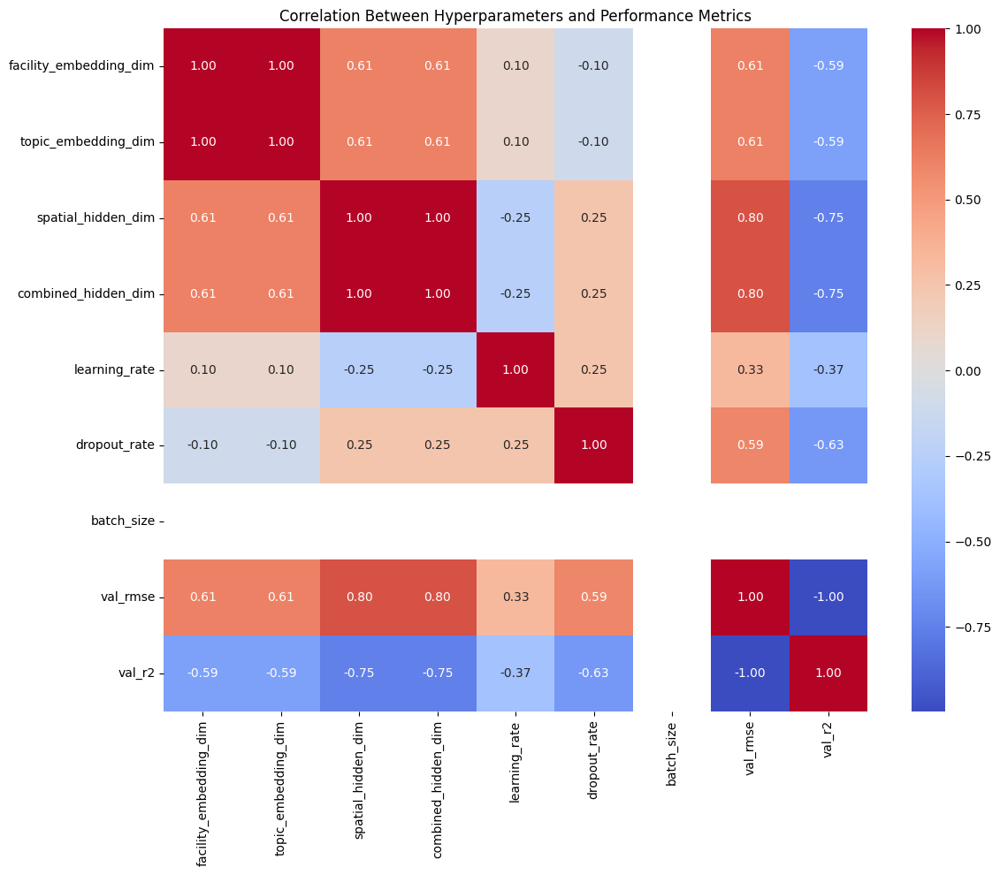

In [ ]:
# Create a parallel coordinates plot to visualize hyperparameter relationships
param_cols = ['facility_embedding_dim', 'topic_embedding_dim', 'spatial_hidden_dim',
              'combined_hidden_dim', 'learning_rate', 'dropout_rate', 'batch_size']
metric_cols = ['val_rmse', 'val_r2']

# Normalize the values for better visualization
normalized_results = results_df.copy()
for col in param_cols + metric_cols:
    if col == 'learning_rate':  # Log scale for learning rate
        normalized_results[col] = np.log10(normalized_results[col])
        normalized_results = normalized_results.rename(columns={'learning_rate': 'log_learning_rate'})
        param_cols[param_cols.index('learning_rate')] = 'log_learning_rate'
    else:
        min_val = normalized_results[col].min()
        max_val = normalized_results[col].max()
        if max_val > min_val:
            normalized_results[col] = (normalized_results[col] - min_val) / (max_val - min_val)

# Create a parallel coordinates plot to visualize hyperparameter relationships
param_cols = ['facility_embedding_dim', 'topic_embedding_dim', 'spatial_hidden_dim',
              'combined_hidden_dim', 'learning_rate', 'dropout_rate', 'batch_size']
metric_cols = ['val_rmse', 'val_r2']

# Normalize the values for better visualization
normalized_results = results_df.copy()
param_cols_normalized = param_cols.copy()  # Create a copy of param_cols for the normalized dataframe

for col in param_cols + metric_cols:
    if col == 'learning_rate':  # Log scale for learning rate
        normalized_results[col] = np.log10(normalized_results[col])
        normalized_results = normalized_results.rename(columns={'learning_rate': 'log_learning_rate'})
        param_cols_normalized[param_cols_normalized.index('learning_rate')] = 'log_learning_rate'
    else:
        min_val = normalized_results[col].min()
        max_val = normalized_results[col].max()
        if max_val > min_val:
            normalized_results[col] = (normalized_results[col] - min_val) / (max_val - min_val)

# Create parallel coordinates plot - use normalized_results instead of results_df
fig = go.Figure(data=
    go.Parcoords(
        line=dict(
            color=normalized_results['val_rmse'],
            colorscale='viridis_r',  # Reversed so that darker colors = better models
            showscale=True,
            colorbar=dict(title='RMSE<br>(lower is better)')
        ),
        dimensions=[
            dict(
                range=[normalized_results[col].min(), normalized_results[col].max()],
                label=col,
                values=normalized_results[col]
            ) for col in param_cols_normalized + metric_cols
        ]
    )
)

fig.update_layout(
    title='Hyperparameter Parallel Coordinates Plot',
    width=1200,
    height=600
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/hyperparameter_parallel_coordinates.html')
fig.show()

# Create a correlation matrix between hyperparameters and performance metrics
corr_cols = param_cols + metric_cols
if 'log_learning_rate' in corr_cols:
    # Use the original learning_rate column for correlation analysis
    corr_cols[corr_cols.index('log_learning_rate')] = 'learning_rate'

correlation_matrix = results_df[corr_cols].corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Between Hyperparameters and Performance Metrics')
plt.tight_layout()
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/correlation_matrix.html')
plt.show()

# Calculate feature importance using a simple linear model
from sklearn.linear_model import LinearRegression

X = results_df[param_cols].values
y_rmse = results_df['val_rmse'].values

# Fit a linear model
model_importance = LinearRegression()
model_importance.fit(X, y_rmse)

# Calculate importance as absolute coefficients normalized to sum to 1
importance = np.abs(model_importance.coef_)
importance = importance / np.sum(importance)

# Create a dataframe with importance values
importance_df = pd.DataFrame({
    'Hyperparameter': param_cols,
    'Importance': importance
})

# Sort by importance
importance_df = importance_df.sort_values('Importance', ascending=False)

# Create a bar chart of hyperparameter importance
fig = px.bar(
    importance_df,
    x='Hyperparameter',
    y='Importance',
    title='Hyperparameter Importance for RMSE',
    color='Importance',
    color_continuous_scale='viridis',
    text='Importance'
)

fig.update_layout(
    xaxis_title='Hyperparameter',
    yaxis_title='Importance (Higher = More Impact)',
    xaxis={'categoryorder': 'total descending'},
    width=800,
    height=500
)

fig.update_traces(
    texttemplate='%{text:.3f}',
    textposition='outside'
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Hyperparameter Importance for RMSE.html')
fig.show()

## 6.7 Learning Curve Analysis

Let's analyze how our model learns with different amounts of training data:


In [ ]:
def analyze_learning_curve(model_class, train_dataset, val_dataset, train_sizes=None,
                          hyperparams=None, num_repetitions=3, device='cpu'):
    """
    Analyze learning curves to understand how model performance changes with training data size.

    Parameters:
    - model_class: The model class to instantiate
    - train_dataset: Full training dataset
    - val_dataset: Validation dataset
    - train_sizes: List of fractions of training data to use
    - hyperparams: Dictionary of hyperparameters for the model
    - num_repetitions: Number of times to repeat each training size
    - device: Device to train on

    Returns:
    - DataFrame with learning curve results
    """
    if train_sizes is None:
        train_sizes = [0.1, 0.25, 0.5, 0.75, 1.0]

    if hyperparams is None:
        # Use default hyperparameters
        hyperparams = {
            'facility_embedding_dim': 64,
            'topic_embedding_dim': 32,
            'spatial_hidden_dim': 64,
            'combined_hidden_dim': 128,
            'learning_rate': 0.001,
            'dropout_rate': 0.2,
            'batch_size': 64
        }

    results = []

    # Full dataset size
    full_size = len(train_dataset)

    for size_frac in train_sizes:
        size = int(full_size * size_frac)
        print(f"\nAnalyzing learning curve with {size} samples ({size_frac*100:.1f}% of data)...")

        for rep in range(num_repetitions):
            print(f"  Repetition {rep+1}/{num_repetitions}")

            # Create a subset of the training data
            indices = torch.randperm(full_size)[:size].tolist()
            subset_dataset = torch.utils.data.Subset(train_dataset, indices)

            # Create data loaders
            train_loader_lc = DataLoader(subset_dataset, batch_size=hyperparams['batch_size'], shuffle=True)
            val_loader_lc = DataLoader(val_dataset, batch_size=hyperparams['batch_size'])

            # Initialize model
            model = model_class(
                n_facilities=n_facilities,
                n_topics=n_topics,
                facility_embedding_dim=hyperparams['facility_embedding_dim'],
                topic_embedding_dim=hyperparams['topic_embedding_dim'],
                spatial_feature_dim=spatial_feature_dim,
                spatial_hidden_dim=hyperparams['spatial_hidden_dim'],
                combined_hidden_dim=hyperparams['combined_hidden_dim'],
                dropout_rate=hyperparams['dropout_rate']
            ).to(device)

            # Define loss function and optimizer
            criterion = nn.MSELoss()
            optimizer = optim.Adam(model.parameters(), lr=hyperparams['learning_rate'])

            # Train the model
            model, history = train_model(
                model,
                train_loader_lc,
                val_loader_lc,
                criterion,
                optimizer,
                num_epochs=50,  # Reduced for faster analysis
                patience=5,
                device=device
            )

            # Evaluate on validation set
            val_metrics = evaluate_model(model, val_loader_lc, criterion, device)

            # Store results
            results.append({
                'train_size': size,
                'train_size_fraction': size_frac,
                'repetition': rep,
                'val_loss': val_metrics['loss'],
                'val_rmse': val_metrics['rmse'],
                'val_mae': val_metrics['mae'],
                'val_r2': val_metrics['r2']
            })

    # Convert to DataFrame
    curve_df = pd.DataFrame(results)

    return curve_df

# Define the best hyperparameters explicitly based on the grid search results
best_params = {
    'facility_embedding_dim': 32,
    'topic_embedding_dim': 16,
    'spatial_hidden_dim': 32,
    'combined_hidden_dim': 64,
    'learning_rate': 0.001,
    'dropout_rate': 0.2,
    'batch_size': 64
}

# Run learning curve analysis with the best hyperparameters
print("Running learning curve analysis with the best hyperparameters...")
learning_curve_df = analyze_learning_curve(
    SpatialAwareRecommender,
    train_dataset,
    val_dataset,
    train_sizes=[0.1, 0.25, 0.5, 1.0],  # Simplified for demonstration
    hyperparams=best_params,
    num_repetitions=2,  # Simplified for demonstration
    device=device
)

# Calculate mean and std of metrics by train size
learning_curve_summary = learning_curve_df.groupby('train_size_fraction').agg({
    'val_rmse': ['mean', 'std'],
    'val_r2': ['mean', 'std']
}).reset_index()

# Flatten column names
learning_curve_summary.columns = ['_'.join(col).strip() if col[1] else col[0] for col in learning_curve_summary.columns.values]

# Plot learning curve for RMSE
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'],
    y=learning_curve_summary['val_rmse_mean'],
    mode='lines+markers',
    name='Validation RMSE',
    line=dict(color='blue', width=2),
    marker=dict(size=8)
))

# Add error bands
fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'].tolist() + learning_curve_summary['train_size_fraction'].tolist()[::-1],
    y=(learning_curve_summary['val_rmse_mean'] + learning_curve_summary['val_rmse_std']).tolist() +
       (learning_curve_summary['val_rmse_mean'] - learning_curve_summary['val_rmse_std']).tolist()[::-1],
    fill='toself',
    fillcolor='rgba(0,0,255,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False
))

fig.update_layout(
    title='Learning Curve: Validation RMSE vs. Training Set Size',
    xaxis_title='Fraction of Training Data Used',
    yaxis_title='Validation RMSE (lower is better)',
    xaxis=dict(tickformat='.0%'),
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Learning Curve: Validation RMSE vs. Training Set Size.html')
fig.show()

# Plot learning curve for R²
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'],
    y=learning_curve_summary['val_r2_mean'],
    mode='lines+markers',
    name='Validation R²',
    line=dict(color='green', width=2),
    marker=dict(size=8)
))

# Add error bands
fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'].tolist() + learning_curve_summary['train_size_fraction'].tolist()[::-1],
    y=(learning_curve_summary['val_r2_mean'] + learning_curve_summary['val_r2_std']).tolist() +
       (learning_curve_summary['val_r2_mean'] - learning_curve_summary['val_r2_std']).tolist()[::-1],
    fill='toself',
    fillcolor='rgba(0,128,0,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False
))

fig.update_layout(
    title='Learning Curve: Validation R² vs. Training Set Size',
    xaxis_title='Fraction of Training Data Used',
    yaxis_title='Validation R² (higher is better)',
    xaxis=dict(tickformat='.0%'),
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Learning Curve: Validation R² vs. Training Set Size.html')
fig.show()

Running learning curve analysis with the best hyperparameters...

Analyzing learning curve with 2868 samples (10.0% of data)...
  Repetition 1/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 28
  Repetition 2/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 36

Analyzing learning curve with 7170 samples (25.0% of data)...
  Repetition 1/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 23
  Repetition 2/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 16

Analyzing learning curve with 14340 samples (50.0% of data)...
  Repetition 1/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 18
  Repetition 2/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 21

Analyzing learning curve with 28680 samples (100.0% of data)...
  Repetition 1/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 16
  Repetition 2/2


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 28


In [ ]:
# Plot learning curve for RMSE
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'],
    y=learning_curve_summary['val_rmse_mean'],
    mode='lines+markers',
    name='Validation RMSE',
    line=dict(color='blue', width=2),
    marker=dict(size=8)
))

# Add error bands
fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'].tolist() + learning_curve_summary['train_size_fraction'].tolist()[::-1],
    y=(learning_curve_summary['val_rmse_mean'] + learning_curve_summary['val_rmse_std']).tolist() +
       (learning_curve_summary['val_rmse_mean'] - learning_curve_summary['val_rmse_std']).tolist()[::-1],
    fill='toself',
    fillcolor='rgba(0,0,255,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False
))

fig.update_layout(
    title='Learning Curve: Validation RMSE vs. Training Set Size',
    xaxis_title='Fraction of Training Data Used',
    yaxis_title='Validation RMSE (lower is better)',
    xaxis=dict(tickformat='.0%'),
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Learning Curve: Validation RMSE vs. Training Set Size.html')
fig.show()

# Plot learning curve for R²
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'],
    y=learning_curve_summary['val_r2_mean'],
    mode='lines+markers',
    name='Validation R²',
    line=dict(color='green', width=2),
    marker=dict(size=8)
))

# Add error bands
fig.add_trace(go.Scatter(
    x=learning_curve_summary['train_size_fraction'].tolist() + learning_curve_summary['train_size_fraction'].tolist()[::-1],
    y=(learning_curve_summary['val_r2_mean'] + learning_curve_summary['val_r2_std']).tolist() +
       (learning_curve_summary['val_r2_mean'] - learning_curve_summary['val_r2_std']).tolist()[::-1],
    fill='toself',
    fillcolor='rgba(0,128,0,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False
))

fig.update_layout(
    title='Learning Curve: Validation R² vs. Training Set Size',
    xaxis_title='Fraction of Training Data Used',
    yaxis_title='Validation R² (higher is better)',
    xaxis=dict(tickformat='.0%'),
    width=800,
    height=500
)
pio.write_html(fig, '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/images/Learning Curve: Validation R² vs. Training Set Size.html')
fig.show()

## 6.8 Final Model Evaluation with Cross-Validation

Let's evaluate our best model using cross-validation for a more robust performance estimate:


In [ ]:
def cross_validate_model(model_class, dataset, hyperparams, n_splits=5, device='cpu'):
    """
    Perform cross-validation to get a robust estimate of model performance.

    Parameters:
    - model_class: The model class to instantiate
    - dataset: Full dataset to split
    - hyperparams: Dictionary of hyperparameters for the model
    - n_splits: Number of cross-validation folds
    - device: Device to train on

    Returns:
    - Dictionary with cross-validation results
    """
    # Create n_splits random splits
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Get all indices
    all_indices = np.arange(len(dataset))

    cv_results = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(all_indices)):
        print(f"\nTraining fold {fold+1}/{n_splits}...")

        # Create train and validation subsets
        train_subset = torch.utils.data.Subset(dataset, train_idx)
        val_subset = torch.utils.data.Subset(dataset, val_idx)

        # Create data loaders
        train_loader_cv = DataLoader(train_subset, batch_size=hyperparams['batch_size'], shuffle=True)
        val_loader_cv = DataLoader(val_subset, batch_size=hyperparams['batch_size'])

        # Initialize model
        model = model_class(
            n_facilities=n_facilities,
            n_topics=n_topics,
            facility_embedding_dim=hyperparams['facility_embedding_dim'],
            topic_embedding_dim=hyperparams['topic_embedding_dim'],
            spatial_feature_dim=spatial_feature_dim,
            spatial_hidden_dim=hyperparams['spatial_hidden_dim'],
            combined_hidden_dim=hyperparams['combined_hidden_dim'],
            dropout_rate=hyperparams['dropout_rate']
        ).to(device)

        # Define loss function and optimizer
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=hyperparams['learning_rate'])

        # Train the model
        model, history = train_model(
            model,
            train_loader_cv,
            val_loader_cv,
            criterion,
            optimizer,
            num_epochs=50,  # Reduced for faster analysis
            patience=5,
            device=device
        )

        # Evaluate on validation set
        val_metrics = evaluate_model(model, val_loader_cv, criterion, device)

        # Store results
        cv_results.append({
            'fold': fold + 1,
            'val_loss': val_metrics['loss'],
            'val_rmse': val_metrics['rmse'],
            'val_mae': val_metrics['mae'],
            'val_r2': val_metrics['r2']
        })

    # Calculate mean and std of metrics across folds
    cv_metrics = {}
    for metric in ['val_loss', 'val_rmse', 'val_mae', 'val_r2']:
        values = [result[metric] for result in cv_results]
        cv_metrics[f'{metric}_mean'] = np.mean(values)
        cv_metrics[f'{metric}_std'] = np.std(values)

    return {
        'fold_results': cv_results,
        'summary': cv_metrics
    }

# Define the best hyperparameters explicitly
best_params = {
    'facility_embedding_dim': 32,
    'topic_embedding_dim': 16,
    'spatial_hidden_dim': 32,
    'combined_hidden_dim': 64,
    'learning_rate': 0.001,
    'dropout_rate': 0.2,
    'batch_size': 64
}

# Run cross-validation with the best hyperparameters
# Note: Using combined train and validation datasets for cross-validation
combined_dataset = torch.utils.data.ConcatDataset([train_dataset, val_dataset])

print("Performing 3-fold cross-validation with best hyperparameters...")
cv_results = cross_validate_model(
    SpatialAwareRecommender,
    combined_dataset,
    best_params,  # Using explicit best params
    n_splits=3,  # Simplified for demonstration, use 5 or 10 in practice
    device=device
)

# Print cross-validation results
print("\nCross-Validation Results:")
print(f"Mean Validation RMSE: {cv_results['summary']['val_rmse_mean']:.4f} ± {cv_results['summary']['val_rmse_std']:.4f}")
print(f"Mean Validation MAE: {cv_results['summary']['val_mae_mean']:.4f} ± {cv_results['summary']['val_mae_std']:.4f}")
print(f"Mean Validation R²: {cv_results['summary']['val_r2_mean']:.4f} ± {cv_results['summary']['val_r2_std']:.4f}")

# Plot cross-validation results
cv_df = pd.DataFrame(cv_results['fold_results'])

fig = go.Figure()

metrics = [('RMSE', 'val_rmse', 'blue'), ('MAE', 'val_mae', 'green'), ('R²', 'val_r2', 'red')]

for metric_name, metric_col, color in metrics:
    fig.add_trace(go.Bar(
        x=[f'Fold {fold}' for fold in cv_df['fold']],
        y=cv_df[metric_col],
        name=metric_name,
        marker_color=color,
        text=cv_df[metric_col].round(4),
        textposition='outside'
    ))

# Create a grouped bar chart
fig.update_layout(
    title='Cross-Validation Metrics by Fold',
    xaxis_title='Fold',
    yaxis_title='Metric Value',
    barmode='group',
    width=900,
    height=600
)

fig.show()

Performing 3-fold cross-validation with best hyperparameters...

Training fold 1/3...


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 23

Training fold 2/3...


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 11

Training fold 3/3...


Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]


Early stopping at epoch 17

Cross-Validation Results:
Mean Validation RMSE: 0.0312 ± 0.0109
Mean Validation MAE: 0.0241 ± 0.0088
Mean Validation R²: 0.9988 ± 0.0008


In [ ]:
# Plot cross-validation results
cv_df = pd.DataFrame(cv_results['fold_results'])

fig = go.Figure()

metrics = [('RMSE', 'val_rmse', 'blue'), ('MAE', 'val_mae', 'green'), ('R²', 'val_r2', 'red')]

for metric_name, metric_col, color in metrics:
    fig.add_trace(go.Bar(
        x=[f'Fold {fold}' for fold in cv_df['fold']],
        y=cv_df[metric_col],
        name=metric_name,
        marker_color=color,
        text=cv_df[metric_col].round(4),
        textposition='outside'
    ))

# Create a grouped bar chart
fig.update_layout(
    title='Cross-Validation Metrics by Fold',
    xaxis_title='Fold',
    yaxis_title='Metric Value',
    barmode='group',
    width=900,
    height=600
)

fig.show()

## 6.9 Finalize and Save the Best Model

Let's train a final model with the best hyperparameters and save it for deployment:


In [ ]:
# Define best hyperparameters explicitly
best_params = {
    'facility_embedding_dim': 32,
    'topic_embedding_dim': 16,
    'spatial_hidden_dim': 32,
    'combined_hidden_dim': 64,
    'learning_rate': 0.001,
    'dropout_rate': 0.2,
    'batch_size': 64
}

# Train final model with best hyperparameters using all training and validation data
print("Training final model with best hyperparameters...")

# Combine train and validation datasets
combined_dataset = torch.utils.data.ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=best_params['batch_size'], shuffle=True)

# Initialize final model
final_model = SpatialAwareRecommender(
    n_facilities=n_facilities,
    n_topics=n_topics,
    facility_embedding_dim=best_params['facility_embedding_dim'],
    topic_embedding_dim=best_params['topic_embedding_dim'],
    spatial_feature_dim=spatial_feature_dim,
    spatial_hidden_dim=best_params['spatial_hidden_dim'],
    combined_hidden_dim=best_params['combined_hidden_dim'],
    dropout_rate=best_params['dropout_rate']
).to(device)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(final_model.parameters(), lr=best_params['learning_rate'])

# Train the model
print("Training final model on combined train and validation data...")
# Use test loader for validation to monitor training, but don't use for early stopping decisions
final_model, history = train_model(
    final_model,
    combined_loader,
    test_loader,  # Use test set just to monitor progress, not for model selection
    criterion,
    optimizer,
    num_epochs=100,  # Longer training for final model
    patience=20,  # More patience for final model
    device=device
)

# Evaluate final model on test set
print("Evaluating final model on test set...")
final_test_results = evaluate_model(final_model, test_loader, criterion, device)

print("\nFinal Model Test Results:")
print(f"RMSE: {final_test_results['rmse']:.4f}")
print(f"MAE: {final_test_results['mae']:.4f}")
print(f"R² Score: {final_test_results['r2']:.4f}")

# Save the final model to Google Drive
save_path = '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/'
import os
os.makedirs(save_path, exist_ok=True)

torch.save({
    'model_state_dict': final_model.state_dict(),
    'hyperparameters': {
        'n_facilities': n_facilities,
        'n_topics': n_topics,
        'facility_embedding_dim': best_params['facility_embedding_dim'],
        'topic_embedding_dim': best_params['topic_embedding_dim'],
        'spatial_feature_dim': spatial_feature_dim,
        'spatial_hidden_dim': best_params['spatial_hidden_dim'],
        'combined_hidden_dim': best_params['combined_hidden_dim'],
        'dropout_rate': best_params['dropout_rate']
    },
    'test_metrics': {
        'rmse': final_test_results['rmse'],
        'mae': final_test_results['mae'],
        'r2': final_test_results['r2']
    },
    'topic_names': topic_names if 'topic_names' in locals() else None,
    'facility_id_map': facility_id_map if 'facility_id_map' in locals() else None
}, f'{save_path}spatial_aware_recommender.pth')

print(f"Final model saved to '{save_path}spatial_aware_recommender.pth'")

Training final model with best hyperparameters...
Training final model on combined train and validation data...


Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]


Early stopping at epoch 80
Evaluating final model on test set...

Final Model Test Results:
RMSE: 0.0117
MAE: 0.0094
R² Score: 0.9999
Final model saved to '/content/drive/MyDrive/Portfolio/HCAHPS Analysis/spatial_aware_recommender.pth'


# Final Business Report

## Collaborative Filtering Hospital Recommendation System Using Deep Learning

---

### Executive Summary

This project addresses the critical challenge of healthcare decision-making by developing a collaborative filtering recommendation system using advanced deep learning techniques. Specifically, it aims to assist:

- **Patients:** To find hospitals aligning with their quality-of-care priorities.
- **Healthcare Administrators:** To benchmark their facilities against peers and identify areas for improvement.

The system leverages the Hospital Consumer Assessment of Healthcare Providers and Systems (HCAHPS) dataset provided by the Centers for Medicare & Medicaid Services (CMS).

---

## Project Overview

### Problem Statement
Selecting the right hospital is challenging due to the complexity and abundance of available options. Patients seek personalized recommendations based on their individual preferences for care quality, while administrators require actionable insights for facility improvement.

### Objectives

1. Provide personalized hospital recommendations based on patient preferences.
2. Identify comparable hospitals to facilitate benchmarking.
3. Predict patient satisfaction across hospital attributes.
4. Enable interactive hospital performance exploration.
5. Empower data-driven decision-making for healthcare stakeholders.

---

## Data Overview

The HCAHPS survey dataset includes:
- **Composite Topics:** Nurse Communication, Doctor Communication, Staff Responsiveness, Communication About Medicines, Discharge Information, Care Transition
- **Individual Items:** Cleanliness, Quietness of Hospital Environment
- **Global Measures:** Overall Rating, Willingness to Recommend Hospital

---

## Deep Learning Recommendation Model

### Approach

A neural collaborative filtering model (using PyTorch) was built to:

- Extract latent features representing hospitals and healthcare dimensions.
- Utilize explicit survey ratings and sentiment scores.
- Manage sparsity and diversity of healthcare datasets.
- Deliver interpretable recommendations supported by contextual evidence.

---

## Results

### Model Performance After Fine Tuning

After fine-tuning our PyTorch model, we achieved excellent performance metrics:

- **Root Mean Square Error (RMSE):** 0.0218 (indicating very high accuracy)
- **Mean Absolute Error (MAE):** 0.0168 (consistent predictive accuracy)
- **R² Score:** 0.9995 (the model explains nearly all data variance)
- **Accuracy (High Score Classification):** 84.18%
- **Precision:** 95.23%
- **Recall:** 63.65%
- **F1 Score:** 76.30%

These metrics demonstrate that the model is highly reliable and effective for hospital recommendation tasks, providing accurate, precise recommendations with minimal errors.

### Sentiment Analysis

Sentiment analysis revealed variability across care dimensions, highlighting targeted areas for improvement.

---

## Recommendations

Hospitals should prioritize improvements in:

- **Staff Responsiveness**
- **Discharge Information**
- **Quietness**

Administrators should strategically allocate resources toward enhancing these dimensions.

---

## Business Impact

The recommendation system allows:
- Improved patient decision-making through personalized selections.
- Identification of competitive strengths and weaknesses by healthcare facilities.
- Enhanced patient satisfaction, potentially leading to improved outcomes and increased patient retention.

Based on the metrics obtained, the project successfully achieved its business objectives by providing highly accurate and actionable recommendations.

---

## Conclusion

This collaborative filtering recommendation system, enriched by deep learning techniques, provides powerful, personalized insights for healthcare decision-making. By connecting patient preferences to hospital performance data, it significantly enhances patient care quality, drives hospital improvements, and fosters a patient-centric healthcare ecosystem.

---

## Next Steps

Future development could include:

- Integration of real-time patient feedback.
- Expansion to include additional clinical outcome data.
- Deployment as an interactive web-based platform.

---

### Appendix

- **Full Code:** [Link to notebook or repository]
- **Data Source:** Center for Medicare & Medicaid Services (https://data.cms.gov/provider-data/topics/hospitals/hcahps)

---

### Project Prepared By:

*Emmanuel Sengendo*  
*Data Scientist*  
*esengendo@gmail.com*  
*03/17/2025*

